In [ ]:
%load_ext autoreload
%autoreload 2
import geopandas as gpd
import pandas as pd
import ast
import shapely
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import LineString
import scipy as sc
import re
from tqdm import tqdm
import xarray as xr
import os
from sklearn.cluster import KMeans
from sklearn.metrics import r2_score

directory = '/scratch/6256481/'

import sys
sys.path.insert(0, directory + f'python/py_code/')
from sklearn.neighbors import NearestNeighbors


from support import str_to_list, expand_dataframe
from support import shaped_lineair
from calc_functions import confinement_values
import json

from glob import glob
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import matplotlib as mpl


# from main import main


from calc_functions import x_y_intercept
import shapely
import ast


from run_confinement_values import create_apex_val_dataframe, calc_confinement_values


In [ ]:
files = glob('/Volumes/PhD/confinement/results/clusters/*.gpkg')


In [19]:
files = glob('/Volumes/PhD/confinement/results/clusters/*.gpkg')
for i, f in tqdm(enumerate(files), total = len(files)):
    dfT = gpd.read_file(f)
    cont, cont_id, _, _ = f.split('/')[-1].split('_')
    dfT['cont'] = cont
    dfT['cont_id'] = cont_id

    if i == 0:
        df = dfT
    else:
        df = pd.concat([df, dfT])

c = [[0], [1,3,4,6], [2], [5]]
names = ['Unconfined', 'Asymmetrical', 'Confined', 'Symmetrical']
for i in range(len(c)):
    df.loc[df['GMM_7_hard'].isin(c[i]), 'clusters'] = names[i]
# df.to_file('/Volumes/PhD/confinement/results/global_clusters_bend.gpkg', driver = 'GPKG')

0it [00:00, ?it/s]


In [37]:
dfG = df.to_crs('EPSG:3857')
dfG["geometry"] = dfG.geometry.set_precision(1).simplify(50, preserve_topology=False)
dfG = dfG.to_crs('EPSG:4326')
df.size, dfG.size

(56641774, 56641774)

In [39]:
n0 = shapely.get_num_coordinates(df.geometry.values).sum()
n1 = shapely.get_num_coordinates(dfG.geometry.values).sum()
n0, n1

(np.int64(37352373), np.int64(6693858))

In [44]:
dfG.loc[dfG['clusters'] == 'Unconfined', ['geometry', 'clusters']].\
    to_file('/Volumes/PhD/confinement/results/global_clusters_bend_unc_simp.gpkg', driver = 'GPKG', layer="data",
    layer_options={"SPATIAL_INDEX":"NO"})

df.loc[df['clusters'] == 'Unconfined', ['geometry', 'clusters']].\
    to_file('/Volumes/PhD/confinement/results/global_clusters_bend_unc.gpkg', driver = 'GPKG')

In [45]:
dfG.loc[dfG['clusters'] == 'Confined', ['geometry', 'clusters']].\
    to_file('/Volumes/PhD/confinement/results/global_clusters_bend_conf_simp.gpkg', driver = 'GPKG', layer="data",
    layer_options={"SPATIAL_INDEX":"NO"})
dfG.loc[dfG['clusters'] == 'Unconfined', ['geometry', 'clusters']].\
    to_file('/Volumes/PhD/confinement/results/global_clusters_bend_unc_simp.gpkg', driver = 'GPKG', layer="data",
    layer_options={"SPATIAL_INDEX":"NO"})
dfG.loc[dfG['clusters'] == 'Asymmetrical', ['geometry', 'clusters']].\
    to_file('/Volumes/PhD/confinement/results/global_clusters_bend_asym_simp.gpkg', driver = 'GPKG', layer="data",
    layer_options={"SPATIAL_INDEX":"NO"})
dfG.loc[dfG['clusters'] == 'Symmetrical', ['geometry', 'clusters']].\
    to_file('/Volumes/PhD/confinement/results/global_clusters_bend_sym_simp.gpkg', driver = 'GPKG', layer="data",
    layer_options={"SPATIAL_INDEX":"NO"})

    

In [23]:
df[['geometry', 'clusters']].\
    to_file('/Volumes/PhD/confinement/results/global_clusters_bend_global.gpkg', driver = 'GPKG')

# find reaches

In [30]:
D = gpd.read_file(glob(directory + 'results/new_segments/vector/*eu*02*')[0])
d = gpd.read_file('/home/6256481/River_Morphology/input/SWOT_vector/eu_sword_reaches_v17.gpkg')


In [10]:
D[D['river_name'] == 'Rhine'].iloc[0]['networkGraph']

112

5659

In [91]:
D = D[D['networkGraph'] == 112]
D = str_to_list(D, ['rch_id_dn_orig', 'rch_id_up_orig'], [])
RT = np.unique(D['combined_reach_id'].values)

In [92]:
# for r in D[D['networkGraph'] == 112].reach_id.values:
#     print(r, ',')

In [21]:
import networkx as nx


In [104]:
# Remove everything downstream
# 23240603191
# 23240603021
# 23240602474
# 23240600531
# 23240900216
# 23240400521
remT = [5602,5752,5710,5701,5687,5712,5654,  6185, 6179,6163, 6165]

In [41]:
D[~D.combined_reach_dn.isna()].iloc[0].combined_reach_dn, D['combined_reach_id'].iloc[0]

(5573.0, 5573.0)

In [95]:
edges = []
for i, r in D.iterrows():
    DN = r['combined_reach_dn']
    # if isinstance(DN, list):
    if ~np.isnan(DN):
        # for dn in DN:
        edges.append([r['combined_reach_id'], DN])

G = nx.Graph()
G.add_edges_from(edges)

networks = list(nx.connected_components(G))
# dfN = pd.DataFrame(networks)
# dfN = dfN.unstack().reset_index(name='reach_id')[['level_1', 'reach_id']]
# dfN = dfN.sort_values('level_1').dropna().rename(columns={"level_1": "networkGraph"})
# df  = df.merge(dfN, how = 'left', on = 'reach_id')

In [48]:
list(nx.all_simple_paths(G, source=5659.0, target=5693.0))

[]

In [105]:
remList = []
for t in remT:
    for n in networks:
        if t in n:
            print(t, n)
            for a in n:
                remList.append(a)

5602 {5632.0, 5633.0, 5634.0, 5635.0, 5636.0, 5637.0, 5638.0, 5639.0, 5640.0, 5641.0, 5642.0, 5643.0, 5644.0, 5645.0, 5646.0, 5647.0, 5648.0, 5649.0, 5650.0, 5651.0, 5652.0, 5653.0, 5602.0, 5603.0, 5604.0, 5605.0, 5606.0, 5607.0, 5608.0, 5609.0, 5610.0, 5611.0, 5612.0, 5613.0, 5614.0, 5615.0, 5616.0, 5617.0, 5618.0, 5619.0, 5620.0, 5621.0, 5622.0, 5623.0, 5624.0, 5625.0, 5626.0, 5627.0, 5628.0, 5629.0, 5630.0, 5631.0}
5752 {5760.0, 5761.0, 5752.0, 5753.0, 5754.0, 5755.0, 5756.0, 5757.0, 5758.0, 5759.0}
5710 {5710.0, 5711.0}
5701 {5701.0, 5702.0, 5703.0, 5704.0, 5705.0, 5706.0, 5707.0, 5708.0, 5709.0}
5687 {5696.0, 5697.0, 5698.0, 5699.0, 5700.0, 5687.0, 5688.0, 5689.0, 5690.0, 5691.0, 5692.0, 5693.0, 5694.0, 5695.0}
5712 {5712.0, 5713.0, 5714.0, 5715.0, 5716.0, 5717.0, 5718.0, 5719.0, 5720.0, 5721.0, 5722.0, 5723.0, 5724.0, 5725.0, 5726.0, 5727.0, 5728.0, 5729.0, 5730.0, 5731.0, 5732.0, 5733.0, 5734.0, 5735.0, 5736.0, 5737.0, 5738.0, 5739.0, 5740.0, 5741.0, 5742.0, 5743.0, 5744.0, 5745

In [106]:
NRT = []
for r in RT:
    if r not in remList:
        NRT.append(r)

In [107]:
len(NRT), len(RT)


(870, 1058)

In [102]:
6185 in NRT

False

In [108]:
NRT

[5751.0,
 5762.0,
 5763.0,
 5764.0,
 5765.0,
 5766.0,
 5767.0,
 5768.0,
 5769.0,
 5770.0,
 5771.0,
 5772.0,
 5773.0,
 5774.0,
 5775.0,
 5776.0,
 5777.0,
 5778.0,
 5779.0,
 5780.0,
 5781.0,
 5782.0,
 5783.0,
 5784.0,
 5785.0,
 5786.0,
 5787.0,
 5788.0,
 5789.0,
 5790.0,
 5791.0,
 5792.0,
 5793.0,
 5794.0,
 5795.0,
 5796.0,
 5797.0,
 5798.0,
 5799.0,
 5800.0,
 5801.0,
 5802.0,
 5803.0,
 5804.0,
 5805.0,
 5806.0,
 5807.0,
 5808.0,
 5809.0,
 5810.0,
 5811.0,
 5812.0,
 5813.0,
 5814.0,
 5815.0,
 5816.0,
 5817.0,
 5818.0,
 5819.0,
 5820.0,
 5821.0,
 5822.0,
 5823.0,
 5824.0,
 5825.0,
 5826.0,
 5827.0,
 5828.0,
 5829.0,
 5830.0,
 5831.0,
 5832.0,
 5833.0,
 5834.0,
 5835.0,
 5836.0,
 5837.0,
 5838.0,
 5839.0,
 5840.0,
 5841.0,
 5842.0,
 5843.0,
 5844.0,
 5845.0,
 5846.0,
 5847.0,
 5848.0,
 5849.0,
 5850.0,
 5851.0,
 5852.0,
 5853.0,
 5854.0,
 5855.0,
 5856.0,
 5857.0,
 5858.0,
 5859.0,
 5860.0,
 5861.0,
 5862.0,
 5863.0,
 5864.0,
 5865.0,
 5866.0,
 5867.0,
 5868.0,
 5869.0,
 5870.0,
 5871.0,
 

In [13]:
from support import str_to_list

In [24]:
files = glob(directory + 'results/all/*50.csv')
for i,f in enumerate(files):
    dfT = pd.read_csv(f)
    
    dfT['file_id']   = f[-9:-7]
    dfT['file_cont'] = f[-12:-10]
    if i == 0:
        df = dfT

    else:
        df = pd.concat([df, dfT], ignore_index=True)

df = df.drop(['lineOut', 'lineInn', 'geometry', 'edit_flag'], axis =1)
ds = df.to_xarray()

fileName = directory + f'results/all/global_all_{50}.nc'
if os.path.exists(fileName):
    os.remove(fileName)
ds.to_netcdf(fileName, format="NETCDF4")

In [43]:
df.reach_len.sum()/1000

2207879.7600340405

In [38]:
df[(df['calculated'] == 0) & (df['include_flag'] == 0)].shape[0]

201086

In [41]:
2014960146.3331647/1000

2014960.1463331648

# open Files

In [2]:
cross = 50
allFiles        = np.sort(glob(directory + 'results/all/??_??_50.csv'))
singleFiles     = np.sort(glob(directory + 'results/single_values/??_??_50.csv'))
singleConfFiles = np.sort(glob(directory + f'results/single_values/*50*conf.nc'))
reachAveraged   = np.sort(glob(directory + f'results/reach_averaged/*50*.gpkg'))

In [30]:
singleConfFiles[0][-16:-14],singleConfFiles[0][-19:-17]

('00', 'af')

In [58]:
allFiles[-4], singleFiles[-4]

('/scratch/6256481/results/all/sa_01_50.csv',
 '/scratch/6256481/results/single_values/sa_01_50.csv')

In [59]:
df  = pd.read_csv(allFiles[-4], dtype = {'include_flag':str, 'calculated':str})
dfS = pd.read_csv(singleFiles[-4], dtype = {'include_flag':str, 'calculated':str})


In [41]:

for i, f in enumerate(allFiles):
    df = pd.read_csv(f, dtype = {'include_flag':str, 'calculated':str})
    df['File'] = f[-12:-7]
    if i == 0:
        dfAll = df
    else:
        dfAll = pd.concat([dfAll, df], ignore_index=True)

In [2]:
dfCF = pd.read_csv(directory + 'results/confinement_factor.csv')

In [17]:
dfCF[dfCF['DW'] == dfCF['DW'].max()]

,Unnamed: 0,bendWidths,conFactor,DH,DW
87633,48846,37937.517442,0.02,87.269569,758.750349


In [12]:
dfCF['bendWidths'].quantile(0.999)

2564.5638868772244

In [13]:
dfCF['DH'] = (dfCF['bendWidths']**0.607)*0.145
dfCF['DW'] = dfCF['bendWidths']*dfCF['conFactor']
dfCF

,Unnamed: 0,bendWidths,conFactor,DH,DW
0,0,36.000000,0.100000,1.276567,3.600000
1,1,41.000000,0.093567,1.381427,3.836244
2,2,50.166667,0.080075,1.561421,4.017115
3,3,47.250000,0.083926,1.505670,3.965495
4,4,40.500000,0.094435,1.371176,3.824609
...,...,...,...,...,...
1529012,36757,30.500000,0.100000,1.154351,3.050000
1529013,36758,32.000000,0.100000,1.188486,3.200000
1529014,36759,31.750000,0.100000,1.182841,3.175000
1529015,36760,35.916667,0.100000,1.274773,3.591667


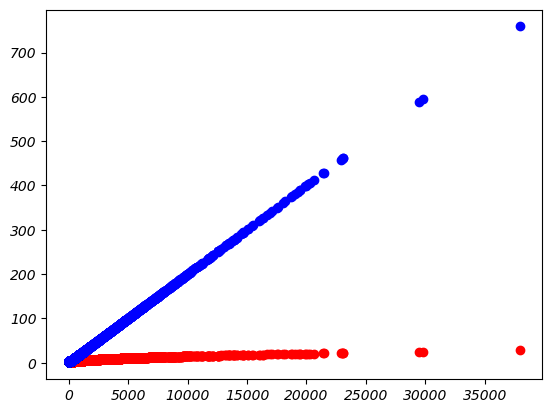

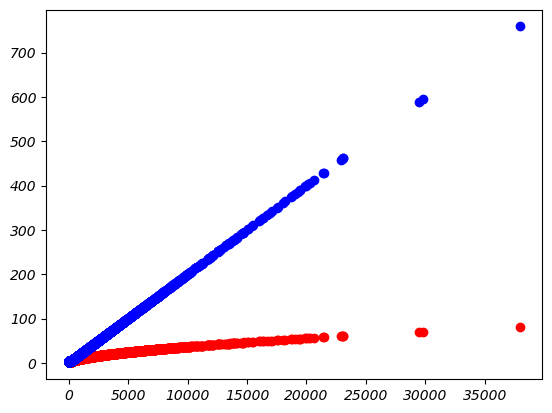

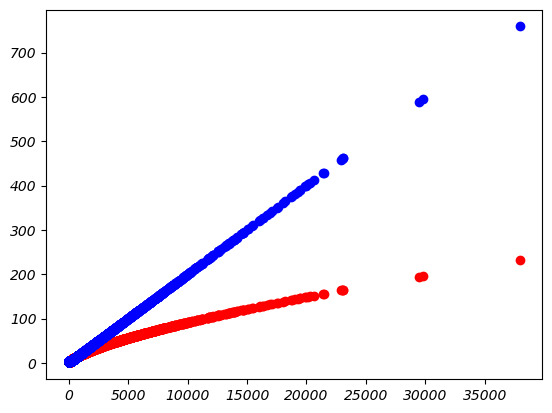

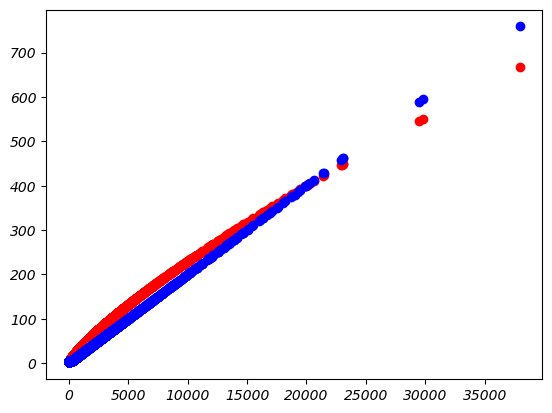

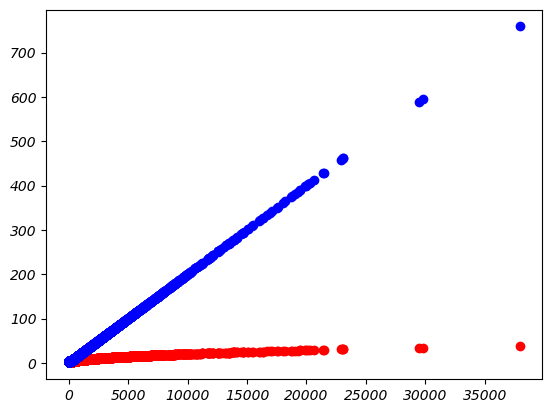

...

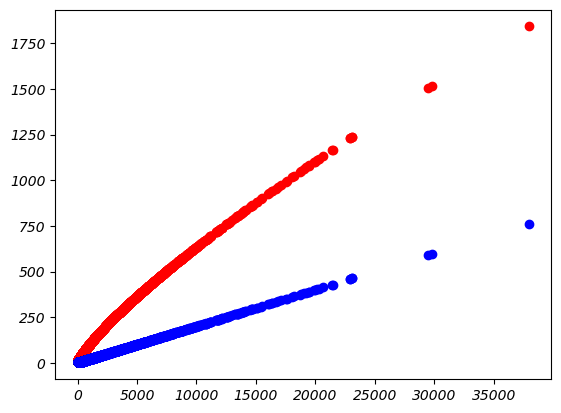

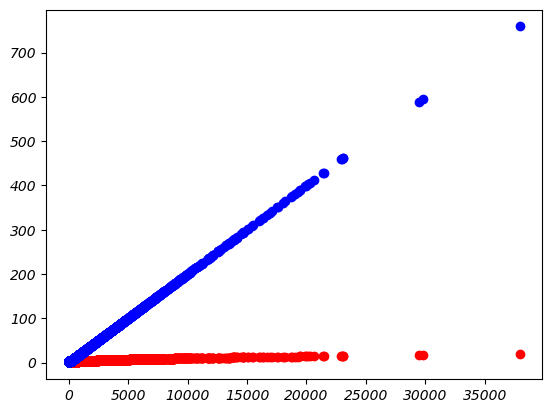

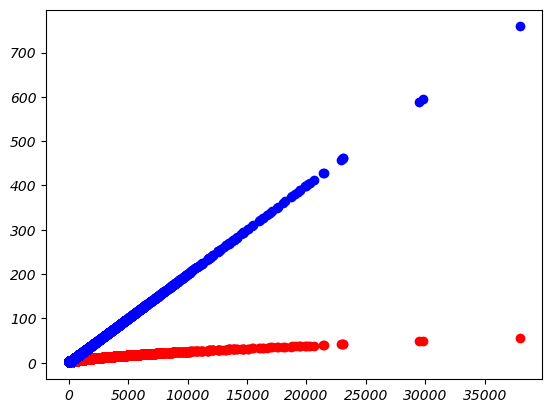

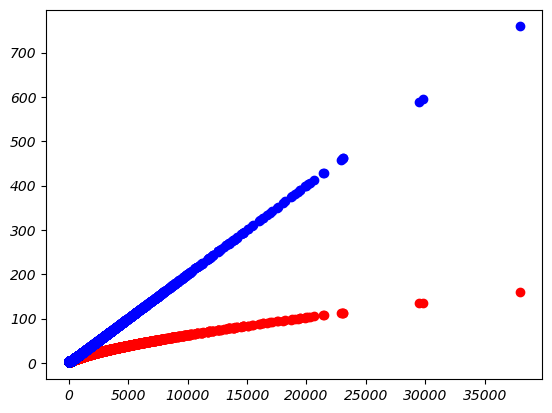

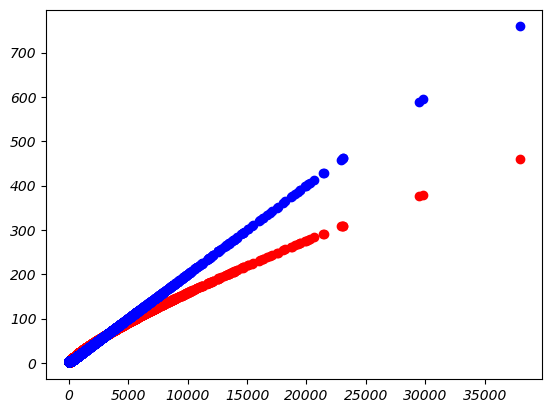

In [21]:
for i in [0.145, 0.2,0.3,0.4,0.1]:
    for j in [0.5, 0.6,0.7,0.8]:
        dfCF['DH'] = (dfCF['bendWidths']**j)*i
        plt.scatter(dfCF['bendWidths'], dfCF['DH'], c = 'red')
        plt.scatter(dfCF['bendWidths'], dfCF['DW'], c = 'blue')

        plt.show()

# check missing rows

In [64]:
from support import str_to_list_comb

In [65]:
dfInc = df[(df['include_flag'] == '0') & (df['calculated'] == '0')]
dropCols = ['x', 'y', 'swot_obs', 'edit_flag', 'trib_flag', 'wse_var', 'width_var']
dfInc = dfInc.drop(dropCols, axis = 1)
# dfInc.loc[dfInc['reach_id'].isin(AM_reaches), 'reach_id'].unique()
    
listStrCols = ['LROrthog', 'bendMaxWidths', 'bendWidths', 'ang', 'bendSin', 'apex', 'bendDistOut', 'bendLen', 'bendHeight'] # new run needed
# listStrCols = ['LROrthog', 'bendMaxWidths', 'bendWidths', 'ang', 'bendSin', 'apex', 'bendDistOut']
listGeomCols = ['apexP', 'lineInn', 'lineOut', 'bendLines']
listNestCols = ['distOut', 'distInn', 'elevInn', 'elevOut']

listCols = listStrCols + listGeomCols + listNestCols
dfInc = str_to_list_comb(dfInc, listCols, listNestCols)

In [66]:
dfInc.loc[dfInc['reach_id'].isin(AM_reaches), 'reach_id'].unique()


array([62294100021, 62293300011, 62270000491, 62255000151, 62235900061,
       62100900605, 62210000705, 62237000091, 62251000131, 62258000461,
       62270000161, 62291001121, 62291001331, 62291001321, 62293100161,
       62297500141, 62297100051, 62295300011, 62295300081, 62295300071,
       62295700051, 62297300371, 62305000645, 62305000295])

In [30]:
dfA = df[df['river_name'] == 'Amazon river']

In [60]:
dfS.loc[dfS['reach_id'].isin(AM_reaches), 'reach_id'].unique()

array([62294100021, 62293300011, 62270000491, 62255000151, 62235900061,
       62100900605, 62210000705, 62237000091, 62251000131, 62258000461,
       62270000161, 62291001121, 62291001331, 62291001321, 62293100161,
       62297500141, 62297100051, 62295300011, 62295300081, 62295300071,
       62295700051, 62297300371, 62305000645, 62305000295])

In [45]:
dfA.shape[0],\
dfA[dfA['include_flag'] == '0'].shape[0],\
dfA[dfA['calculated'] == '0'].shape[0]

(318, 314, 314)

In [49]:
AM_reaches = dfA.loc[(dfA['calculated'] == '0') & (dfA['include_flag'] == '0'), 'reach_id'].values

In [42]:
# dfCheck = df[df['include_flag'] == '0'].copy()
# df.shape[0], dfCheck.shape[0]
dfCheck = dfAll[dfAll['include_flag'] == '0'].copy()
dfAll.shape[0], dfCheck.shape[0]

(248647, 201151)

In [43]:
dfCheck['calculated'].unique(), df['include_flag'].unique()

(array(['0', '04'], dtype=object),
 array(['0', '24', '3', '34', '4', '2', '1', '12', '14', '124'],
       dtype=object))

In [44]:
dfCheck[dfCheck['calculated'] == '04'].shape[0]

2128

In [45]:
A = dfCheck.loc[dfCheck['calculated'] == '04', ['combined_reach_id', 'File']]
B = A.groupby(['combined_reach_id', 'File'], as_index = False).first().sort_values('File')
# B[B['File'] == 'af_04']['combined_reach_id'].values
B

,combined_reach_id,File
78,1627.0,af_00
150,2748.0,af_00
689,13632.0,af_00
688,13621.0,af_00
73,1461.0,af_00
...,...,...
1066,25793.0,sa_04
1065,25565.0,sa_04
1063,25532.0,sa_04
1045,24378.0,sa_04


# check not created files

In [98]:
# file_sorting
dfFS = pd.read_csv(directory + 'results/file_sorting.csv')
# dfFS[dfFS.file.str.startswith('af')]

In [99]:
dfFS[dfFS['file'].str.startswith('af')]

,Unnamed: 0,file,filePath,size
15,1,af_01,/scratch/6256481/results/new_segments/vector/a...,4635
22,2,af_02,/scratch/6256481/results/new_segments/vector/a...,4178
25,0,af_00,/scratch/6256481/results/new_segments/vector/a...,4083
29,3,af_03,/scratch/6256481/results/new_segments/vector/a...,3981
42,4,af_04,/scratch/6256481/results/new_segments/vector/a...,1036


In [158]:
allFileNames = [f[-12:-7] for f in allFiles]
for i, r in dfFS.iterrows():
    if r['file'] not in allFileNames:
        print(r['file'])

sa_01
as_04
na_05
as_05
as_06
eu_02
na_00
na_01


# Analyzing

## Open Files

### Open files new created

In [3]:
files = glob(directory + f'results/single_values/{'af'}*50*conf.nc')

In [2]:
dsList = []
cross = 50
for c in ['af', 'as', 'sa', 'na', 'oc', 'eu']:
# for c in ['sa']:
    print(c)
    files = glob(directory + f'results/single_values/{c}*{cross}*conf.nc')
    for f in tqdm(files):
        dsTemp = xr.open_dataset(f)
        dsTemp['file'] = ('index', [c] * dsTemp.sizes['index'])
        dsTemp = dsTemp.drop_vars(['infP', 'bendLines', 'apexP', 'lineInn', 'lineOut'])
        dsList.append(dsTemp)
    
ds = xr.concat(dsList, dim='index')
fName = directory + f'results/single_values/global_{cross}_conf.nc'
if os.path.exists(fName):
    os.remove(fName)
ds.to_netcdf(fName)

af


100%|██████████| 5/5 [01:15<00:00, 15.19s/it]


as


100%|██████████| 17/17 [05:05<00:00, 17.96s/it]


sa


100%|██████████| 5/5 [05:26<00:00, 65.24s/it] 


na


100%|██████████| 7/7 [01:20<00:00, 11.57s/it]


oc


100%|██████████| 3/3 [00:31<00:00, 10.47s/it]


eu


100%|██████████| 6/6 [01:08<00:00, 11.33s/it]


### Open global netcdf

In [2]:
f = directory + 'results/single_values/global_50_02_conf.nc'
ds = xr.open_dataset(f)

In [3]:
df = ds.to_dataframe().reset_index()

In [7]:
# df[(df['type'] == 1) & (df['lakeflag'] != 0) & (df['lakeflag'] != 3)]['lakeflag']

df[((df['type'] == 2) | (df['type'] == 3)) & (df['lakeflag'] != 1)]['lakeflag']

147        3
148        3
149        3
150        3
269        3
          ..
1472778    0
1485663    0
1485664    0
1485665    0
1485666    0
Name: lakeflag, Length: 7139, dtype: int64

## Extract vars from ds

In [4]:
dsSubset = ds[['ER_inn', 'ER_out', 'slope_inn', 'slope_out',
    'ER_left', 'ER_right', 'slope_left', 'slope_right',
    'apex', 'catchment_position', 'bendWidths', 'bendMaxWidths',
    'cp_height', 'cm_height','bendDistOut','max_dist_out','bendHeight',
    'sin', 'ang', 'conFactor', 'catchment_position', 
    'combined_reach_id', 'combined_reach_len', 'reach_id', 'file', 'bendLen', 'up_reach_id', 'networkGraph', 'networkGroup', 'river_name', 'river_segment',
    'sin', 'ang', 'widthRatio']]
df = dsSubset.to_dataframe().reset_index()

In [ ]:
df[df['E']]

In [130]:
D = gpd.read_file(directory + 'results/single_values/na_03_50_4_conf.gpkg')


In [6]:
df[df['reach_id'] == 75140100171]

,index,ER_inn,ER_out,slope_inn,slope_out,ER_left,ER_right,slope_left,slope_right,apex,...,combined_reach_len,reach_id,file,bendLen,up_reach_id,networkGraph,networkGroup,river_name,river_segment,widthRatio
1118266,11143,0.480781,1.106430,0.210598,0.095170,1.106430,0.480781,0.095170,0.210598,41.767695,...,10168.592436,75140100171,na,654.170198,7.514090e+10,167,3,Trinity River,1568.0,1.0
1118267,11144,0.734242,0.712230,0.128069,0.132027,0.734242,0.712230,0.128069,0.132027,70.433107,...,10168.592436,75140100171,na,1169.850414,7.514090e+10,167,3,Trinity River,1568.0,1.0
1118268,11145,0.593177,0.589921,0.154204,0.155055,0.589921,0.593177,0.155055,0.154204,183.201140,...,10168.592436,75140100171,na,1443.810981,7.514090e+10,167,3,Trinity River,1568.0,1.0
1118269,11146,0.852576,0.586541,0.116502,0.169344,0.852576,0.586541,0.116502,0.169344,493.140468,...,10168.592436,75140100171,na,2644.236784,7.514090e+10,167,3,Trinity River,1568.0,1.0
1118270,11147,0.479537,1.898952,0.179059,0.047147,1.898952,0.479537,0.047147,0.179059,212.873403,...,10168.592436,75140100171,na,1590.157890,7.514090e+10,167,3,Trinity River,1568.0,1.0
1118271,11148,1.210169,0.461666,0.090202,0.218320,1.210169,0.461666,0.090202,0.218320,113.905663,...,10168.592436,75140100171,na,1032.410382,7.514090e+10,167,3,Trinity River,1568.0,1.0
1118272,11149,1.460329,0.975743,0.063904,0.095640,0.975743,1.460329,0.095640,0.063904,103.252836,...,10168.592436,75140100171,na,679.828616,7.514090e+10,167,3,Trinity River,1568.0,1.0
1118273,11150,1.116075,0.602458,0.073003,0.135241,1.116075,0.602458,0.073003,0.135241,76.423775,...,10168.592436,75140100171,na,836.460081,7.514090e+10,167,3,Trinity River,1568.0,1.0


In [131]:
A = df[(df['file'] == 'na') & (df['river_segment'] == 1568)]
A.combined_reach_id.unique()

array([9078., 9079., 9080., 9081., 9082., 9083., 9084., 9085., 9086.,
       9087., 9088., 9089., 9090., 9091., 9092., 9093., 9094.])

In [132]:
d = D[D['combined_reach_id'].isin(A.combined_reach_id.unique())]

In [133]:
a = d[(d['bendDistOut'] > 127800) & (d['bendDistOut'] < 178518.053983)]
a = a.sort_values('bendDistOut')
a['rank'] = np.arange(a.shape[0])

In [80]:
import numpy as np
import matplotlib.pyplot as plt

# Define bin edges

# Create a colormap with N colors (N = number of bins)
cmap = plt.cm.Set1
N = len(bin_edges) - 1
colors = [cmap(i / (N - 1)) for i in range(N)]

def value_to_color(x, colors):
    bin_edges = [0.5, 5, 15, 30, 50]
    """Map a single value to its bin color."""
    idx = np.digitize([x], bin_edges, right=False)[0] - 1
    idx = max(0, min(idx, N - 1))  # clamp to valid range
    return colors[idx]

# Example usage
print("x=4  →", value_to_color(r['ER_out']))
# print("x=10 →", value_to_color(10))
# print("x=25 →", value_to_color(25))
# print("x=40 →", value_to_color(40))


x=4  → cyan


1

In [124]:
bin_edges = [0.5, 10 ,50]
colors    = ['red', 'green', 'blue', 'cyan']

In [125]:
CO = np.digitize(a['ER_out']  ,bin_edges , right=False)-1
CI = np.digitize(a['ER_inn']  ,bin_edges , right=False)-1
CL = np.digitize(a['ER_left'] ,bin_edges , right=False)-1
CR = np.digitize(a['ER_right'],bin_edges , right=False)-1


In [126]:
CI

array([2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 1, 2,
       0, 0, 1, 2, 2, 2, 2, 2, 2, 2, 1, 2, 0, 2, 0, 2, 1, 2, 1, 0, 1, 2,
       0])

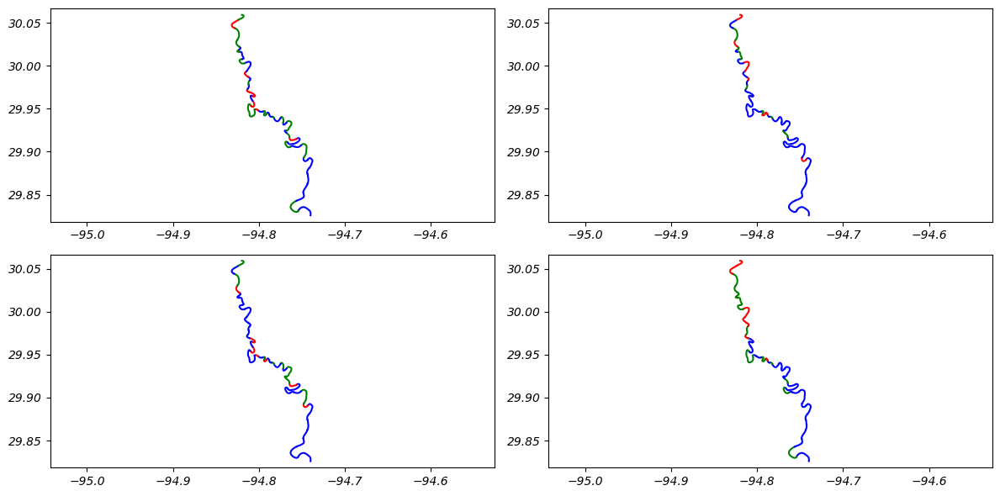

In [135]:
f, ax = plt.subplots(ncols = 2, nrows = 2, squeeze = False, figsize = [12,6])
i = -1
for I,r in a.iterrows():
        i +=1
    # print(r['ER_out'],value_to_color(r['ER_out']))
    # if np.isnan(r['ER_out']) == False:
        # c = colors[np.digitize([r['ER_out']],bin_edges , right=False)[0]-1]
        # print(np.digitize([r['ER_out']],bin_edges , right=False)[0], r["ER_out"])
        ax[0,0].plot(*r['geometry'].xy, color = colors[CO[i]])
    # if np.isnan(r['ER_inn']) == False:
       
        ax[0,1].plot(*r['geometry'].xy, color = colors[CI[i]])
    # if np.isnan(r['ER_left']) == False:
        ax[1,0].plot(*r['geometry'].xy, color = colors[CL[i]])
    # if np.isnan(r['ER_right']) == False:
        ax[1,1].plot(*r['geometry'].xy, color = colors[CR[i]])
ax[0,0].axis('equal')
ax[0,1].axis('equal')
ax[1,0].axis('equal')
ax[1,1].axis('equal')
plt.tight_layout()
plt.show()

In [44]:
a[['rank','ER_out', 'ER_inn', 'ER_left', 'ER_right']]

,rank,ER_out,ER_inn,ER_left,ER_right
11351,0,NaN,NaN,NaN,NaN
11350,1,42.466818,NaN,NaN,42.466818
11349,2,NaN,NaN,NaN,NaN
11348,3,NaN,NaN,NaN,NaN
11347,4,NaN,NaN,NaN,NaN
11346,5,NaN,NaN,NaN,NaN
11345,6,NaN,NaN,NaN,NaN
11344,7,NaN,4.205171,4.205171,NaN
11343,8,19.052074,NaN,19.052074,NaN
11342,9,NaN,NaN,NaN,NaN


In [4]:
def add_columns(df):
    # df['ER_max']    = df[['ER_inn', 'ER_out']].max(axis = 1)
    # df['slope_max'] = df[['slope_inn', 'slope_out']].max(axis = 1)


    # df['slope_diff_bendSide']     = df['slope_inn']     - df['slope_out']
    # df['slope_diff_bendSide_abs'] = abs(df['slope_inn'] - df['slope_out'])
    # df['slope_diff_side']         = df['slope_left']    - df['slope_right']


    # df['ER_diff_bendSide']     = df['ER_inn']     - df['ER_out']
    # df['ER_diff_bendSide_abs'] = abs(df['ER_inn'] - df['ER_out'])
    # df['ER_diff_side']         = df['ER_left']    - df['ER_right']

    df['slope_max'] = (df['cm_height'] - df['cp_height']) / (df['bendWidths']*0.5)
    df['slope_out_normalized'] = df['slope_out'] / df['slope_max']
    df['slope_inn_normalized'] = df['slope_inn'] / df['slope_max']

    df['nonDimAmp'] = df['apex'] / df['bendMaxWidths']
    df['catch_height'] = df['bendHeight'] * df['catchment_position']
    df['bend_catch_pos'] = df['bendDistOut'] / df['max_dist_out']
    
    return df

dfG = df.groupby(['file', 'combined_reach_id'], as_index = False)[['combined_reach_len', 'sin']].first()
df = add_columns(df)

In [5]:
conf_s = df[(~df['ER_inn'].isna()) | (~df['ER_out'].isna())].shape[0]
conf_o = df[(~df['ER_out'].isna())].shape[0]
conf_i = df[(~df['ER_inn'].isna())].shape[0]
conf   = df[(~df['ER_inn'].isna()) & (~df['ER_out'].isna())].shape[0]
total  = df.shape[0]

In [55]:
conf_s/total, conf/total, conf_o, conf_i, total

(0.8826712948644582, 0.7412511832697896, 1230741, 1189834, 1490573)

In [7]:
E

1153947

## Plot settings

In [8]:
labelTextSize   = 15
tickSize        = 15
legendSize      = 13
legendTitleSize = 13
scatterAlpha    = 0.05
scatterSize     = 0.1

In [35]:
F = '/scratch/6256481/input_created/plot_settings_confinement.json'

with open(F, 'r') as f:
    psd = json.load(f)
psd

{'labelSize': 15,
 'tickSize': 12,
 'legendTitleSize': 12,
 'legendEntrySize': 12,
 'colorOut': '#d62728',
 'colorInn': '#1F60B4',
 'saveResolution': 1000}

## Confinement height sensitivity analysis

In [6]:
drop_cols1 = ['reach_id', 'reach_len', 'n_nodes', 'wse', 'width', 'facc', 'n_chan_max', 'n_chan_mod', 'obstr_type', 'grod_id', 'hfalls_id',
             'slope', 'dist_out', 'lakeflag', 'max_width', 'n_rch_up', 'n_rch_dn', 'rch_id_up', 'rch_id_dn', 'swot_orbit', 'type',
             'river_name', 'path_freq', 'path_order', 'path_segs', 'main_side', 'strm_order', 'end_reach', 'network', 
             'include_flag', 'calculated',
             'pfaf1', 'pfaf2', 'localCRS', 'rch_id_up_orig', 'rch_id_dn_orig', 'n_rch_up_orig', 'n_rch_dn_orig', 'node_mean_max_width',
             'river_segment', 'river_segment_order', 'reach_order', 'dn_river_segment', 'combined_reach_len','combined_reach_width',
             'combined_reach_max_width',
             'networkGraph', 'networkGroup', 'combined_reach_crs', 'widthRatio', 'sin', 'lineSlope',
             'bendHeight', 'LROrthog', 'conFactor']
drop_cols2 = ['dn_connected_reach', 'max_dist_out', 'up_reach_id', 'catchment_position', 'bendSin', 'apex', 'ang', 'bendWidths', 'bendMaxWidths',
              'bendLen', 'reach_ids', 'up_connected_reach', 'combined_reach_up','combined_reach_dn', 'Unnamed: 0', 'file_cont','file_num']
rename_cols = ['valley_width_out','bendDistOut',
       'valley_width_inn', 'cp_height', 'cm_height', 'slope_out', 'slope_inn',
       'ER_out', 'ER_inn', 'ER_left', 'ER_right', 'slope_left', 'slope_right']

In [7]:
from functools import reduce
files = np.sort(glob(directory + 'results/single_values/*global*'))
files = files[:-2]
dfL = []
for i, f in enumerate(files):
    dsTemp = xr.open_dataset(f)
    dsTemp = dsTemp.drop_vars(drop_cols1)

    
    if i >0:
        dsTemp = dsTemp.drop_vars(drop_cols2)
    dfTemp = dsTemp.to_dataframe()
    
    dfTemp['bendRank'] = dfTemp.groupby(['file', 'combined_reach_id'])['bendDistOut'].rank(ascending=False).astype(int)
    dfTemp['bendID']   = dfTemp['combined_reach_id'].astype(int).astype(str) + '_' + dfTemp['bendRank'].astype(str)
    
    if i > 0:
        dfTemp = dfTemp.drop(columns = ['bendRank', 'combined_reach_id'])

    dfTemp = dfTemp.rename(columns={col: f"{col}_{f.split('_')[-2]}" for col in rename_cols})
    dfL.append(dfTemp)
merged_df = reduce(lambda left, right: 
                   pd.merge(left, right, on=['file', 'bendID']), dfL)

In [8]:
for ch in ['00.5', '01', '01.5', '02', '03', '04', '06', '08', '10']:
    merged_df[f'slope_max_{ch}'] = (merged_df[f'cm_height_{ch}'] - merged_df[f'cp_height_{ch}']) / (merged_df[f'bendWidths']*0.5)
    merged_df[f'slope_out_normalized_{ch}'] = merged_df[f'slope_out_{ch}'] / merged_df[f'slope_max_{ch}']
    merged_df[f'slope_inn_normalized_{ch}'] = merged_df[f'slope_inn_{ch}'] / merged_df[f'slope_max_{ch}']

In [9]:
df['plot'] = (df['ER_out'] + df['ER_inn']) / 2
dfP = df.copy()['plot'].dropna()
quantile_bins = np.quantile(dfP, np.linspace(0, 1, 10
                                             ))  # 5 bins
quantile_bins

array([ 0.38332302,  0.82027025,  1.25778035,  2.0425992 ,  3.27442864,
        5.12904903,  7.92522317, 12.25935728, 19.46574868, 49.72374126])

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# -----------------------------
# Plot using Seaborn
# -----------------------------
def multi_kde_plot(df,XType, XInn, 
                    logx = True, logy= False, labx = '', laby ='',
                    xlim = [],
                    saveFig =False, title = '', doubleDropNa = False):
    color = ['red', 'blue', 'green', 'cyan', 'yellow', 'purple', 'pink', 'gray']
    labels = [ 1, 2,4, 6]
    # labels = [1,2,4]
    fig, axs = plt.subplots(1, 1, figsize=(12, 8), layout='constrained')
    for i,l in enumerate(labels):
        if XType == 'slope':
            X = f'{XType}_{XInn}_normalized'
        else:
            X = f'{XType}_{XInn}'
        if l < 10:
            ls = f'0{l}'
        else:
            ls = f'{l}'
            
        x = f'{X}_{ls}'
        if doubleDropNa == True:
            sub = [x, f'ER_{XInn}_{ls}']
        else:
            sub = x
        df = df.copy().dropna(subset = sub)

        if logx == True:
            df['target'] = np.log10(df[x])
        else:
            df['target'] = df[x]


            # Note: We plot KDE of log(data), then convert axes to log-log
        sns.kdeplot(data = df,x = 'target', ax=axs, fill=True, color = color[i], label = l)

    axs.set_xlabel(labx, fontsize = labelTextSize)
    axs.set_ylabel(laby, fontsize = labelTextSize)
    if xlim == True:
        axs.set_xlim([df['target'].min(), df['target'].max()])

    if logy == True:
        axs.set_yscale('log')
    axs.grid(True, which="both", ls="--", lw=0.5)
    axs.tick_params(axis='both', which='major', labelsize=tickSize)
    # axs.set_yticks(ticks = np.arange(0,1.7,0.2))
    # axs.set_ylim([0, 1.7])
    axs.legend(title = 'CH', fontsize = legendSize, title_fontsize = legendTitleSize)
    if saveFig == True:
        if len(title) ==0:
            print('No title supplied')
        else:
            plt.savefig(directory + f'results/figures/{title}.png')
    plt.show()


ValueError: Axis limits cannot be NaN or Inf

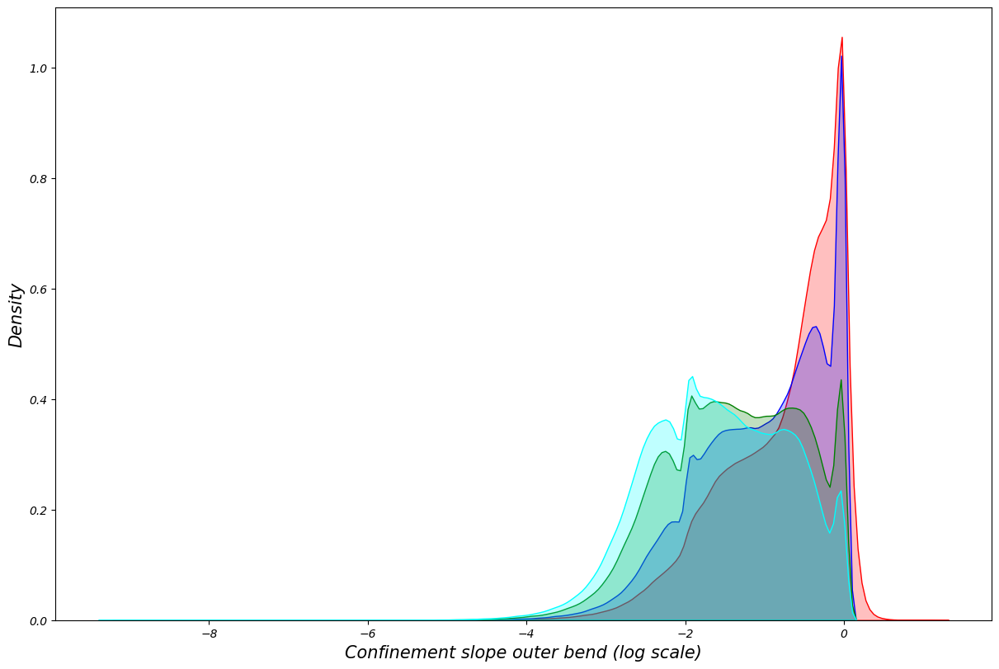

In [11]:
multi_kde_plot(merged_df,'slope', 'out', labx = 'Confinement slope outer bend (log scale)', laby = 'Density', saveFig = True, title = 'KDE_slopeOut_NE_Ls', xlim=True, logx=True , doubleDropNa = False)
multi_kde_plot(merged_df,'slope', 'out', labx = 'Confinement slope outer bend'            , laby = 'Density', saveFig = True, title = 'KDE_slopeInn_NE_Ln', xlim=True, logx=False, doubleDropNa = False)

multi_kde_plot(merged_df,'slope', 'out', labx = 'Confinement slope outer bend (With valley edge, log scale)' , laby = 'Density', saveFig = True, title = 'KDE_slopeOut_WE_Ls', xlim =True, logx = True , doubleDropNa = True)
multi_kde_plot(merged_df,'slope', 'out', labx = 'Confinement slope outer bend (With valley edge)'            , laby = 'Density', saveFig = True, title = 'KDE_slopeInn_WE_Ln', xlim =True, logx = False, doubleDropNa = True)

multi_kde_plot(merged_df,'slope', 'inn', labx = 'Confinement slope inner bend (log scale)', laby = 'Density', saveFig = True, title = 'KDE_slopeInn_NE_Ls', xlim =True, logx = True, )
multi_kde_plot(merged_df,'slope', 'inn', labx = 'Confinement slope inner bend'            , laby = 'Density', saveFig = True, title = 'KDE_slopeInn_NE_Ln', xlim = True, logx = False)

multi_kde_plot(merged_df,'slope', 'inn', labx = 'Confinement slope inner bend (log scale, With valley edge)', laby = 'Density', saveFig = True, title = 'KDE_slopeInn_WE_Ls', xlim = True, logx = True , doubleDropNa = True)
multi_kde_plot(merged_df,'slope', 'inn', labx = 'Confinement slope inner bend'                              , laby = 'Density', saveFig = True, title = 'KDE_slopeInn_WE_Ln', xlim = True, logx = False, doubleDropNa = True)

In [20]:
df['slope_out_normalized'].min(), df['slope_out_normalized'].max()

(-1.1162437552244084, 1.015057668765302)

In [18]:
np.log10(1), 10**-0.25

(0.0, 0.5623413251903491)

<Axes: xlabel='target', ylabel='Density'>

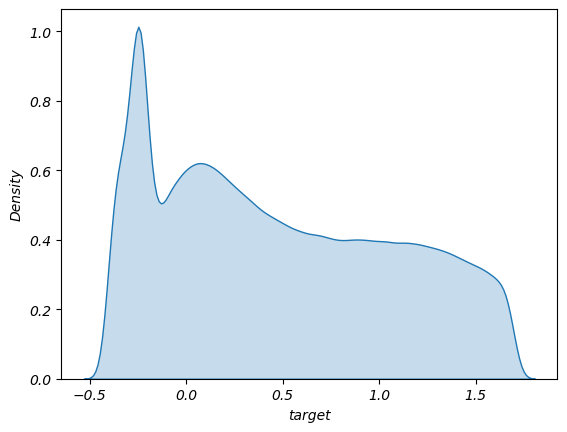

In [13]:
df['target'] = np.log10(df['ER_out'])
sns.kdeplot(data = df,x = 'target', fill=True)

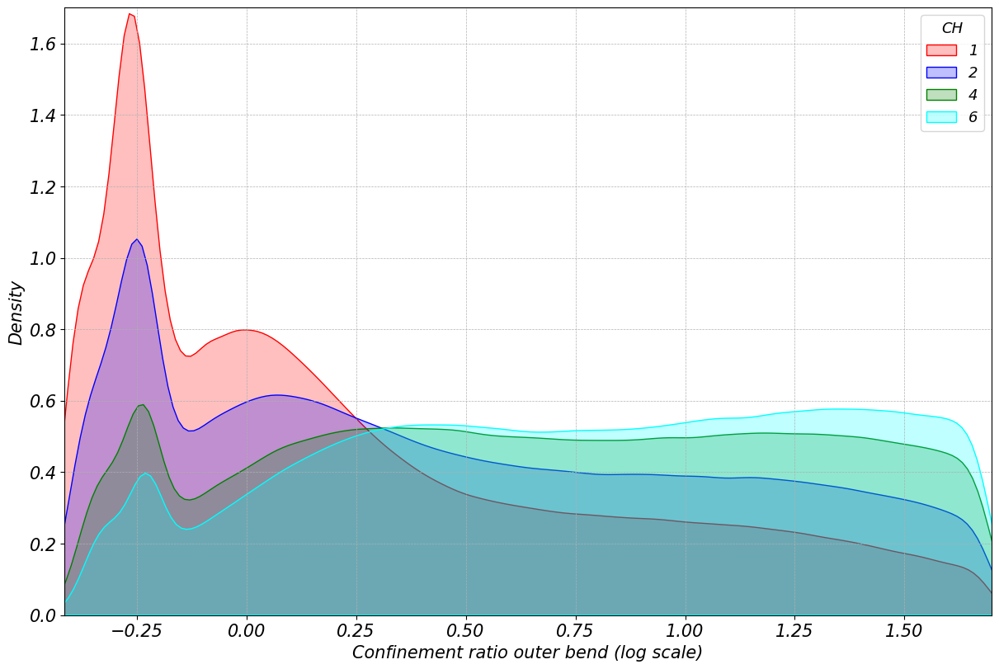

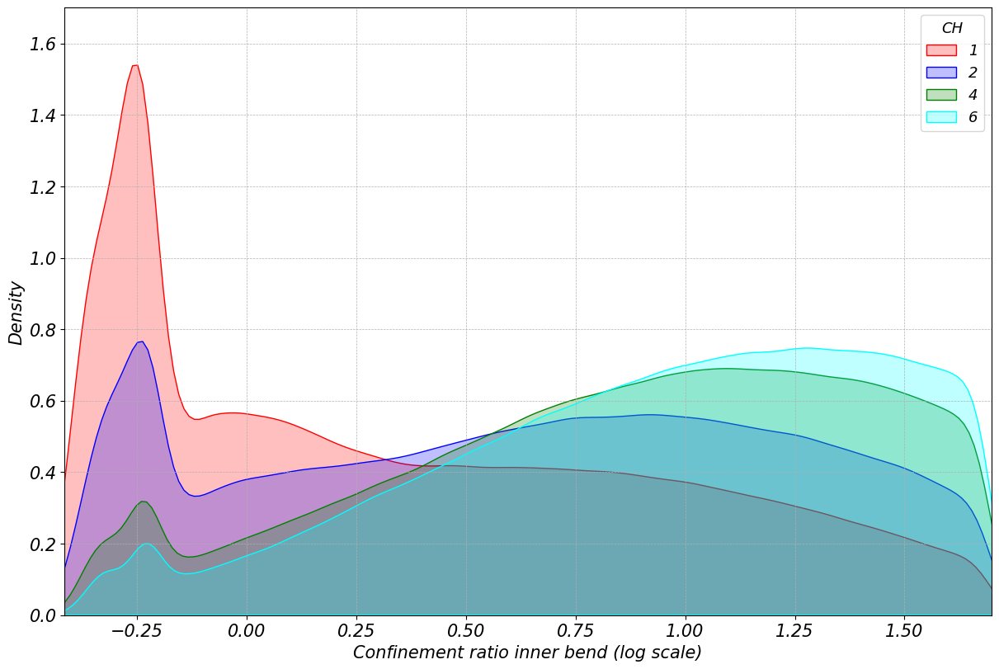

In [ ]:
multi_kde_plot(merged_df,'ER', 'out', labx = 'Confinement ratio outer bend (log scale)', laby = 'Density', saveFig = True, title = 'KDE_EROut_Ls', xlim = True, logx = True , doubleDropNa = True)
multi_kde_plot(merged_df,'ER', 'out', labx = 'Confinement ratio outer bend'            , laby = 'Density', saveFig = True, title = 'KDE_ERInn_Ln', xlim = True, logx = False, doubleDropNa = True)

multi_kde_plot(merged_df,'ER', 'inn', labx = 'Confinement ratio inner bend (log scale)', laby = 'Density', saveFig = True, title = 'KDE_ERInn_Ls', xlim = True, logx = True, )
multi_kde_plot(merged_df,'ER', 'inn', labx = 'Confinement ratio inner bend'            , laby = 'Density', saveFig = True, title = 'KDE_ERInn_Ln', xlim = True, logx = False)

In [22]:
10**1.6

39.810717055349734

In [13]:
def single_kde_plot(df, X, logx = True, logy = True, grouping = False, color = 'red',
                    labx = '', laby = '', title = '', saveFig = False):

    fig, axs = plt.subplots(1, 1, figsize=(15, 6), layout='constrained')
    df = df.copy().dropna(subset = X)
    if logx == True:
        df['target'] = np.log10(df[X])
    else:
        df['target'] = df[X]


        # Note: We plot KDE of log(data), then convert axes to log-log
    sns.kdeplot(data = df,x = 'target', ax=axs, fill=True, color = color)

    axs.set_xlabel(labx, fontsize = labelTextSize)
    axs.set_ylabel(laby, fontsize = labelTextSize)
    if laby == True:
        axs.set_yscale('log')
    axs.grid(True, which="both", ls="--", lw=0.5)
    axs.tick_params(axis='both', which='major', labelsize=tickSize)

    axs.legend(title = 'CH', fontsize = legendSize, title_fontsize = legendTitleSize)
    if saveFig == True:
        if len(title) ==0:
            print('No title supplied')
        else:
            plt.savefig(directory + f'results/figures/{title}.png')
    plt.show()

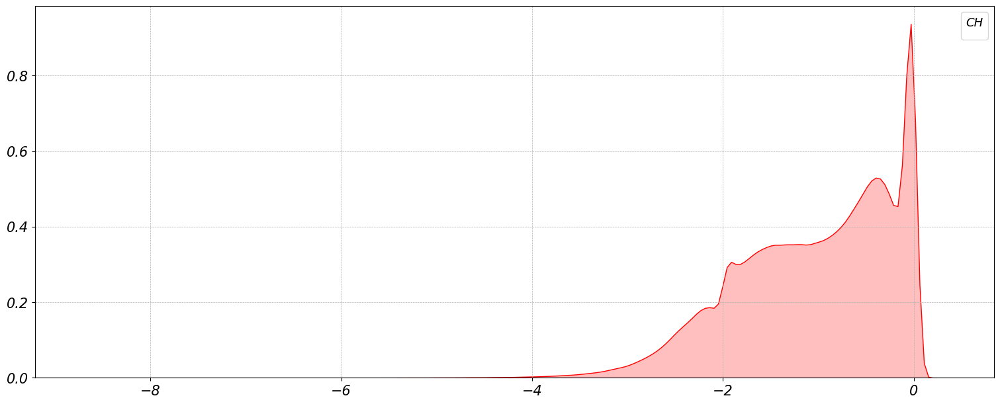

In [34]:
single_kde_plot(merged_df, 'slope_out_normalized_02')

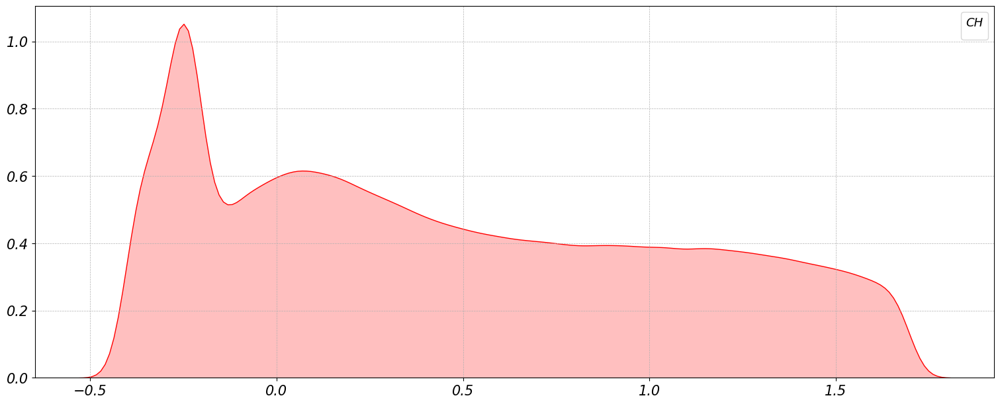

In [14]:
single_kde_plot(df, 'ER_out')

In [ ]:
def plot_
    fig, axs = plt.subplots(1, 1, figsize=(15, 6), layout='constrained')
    df = df.copy().dropna(subset = X)

    df['target'] = np.log10(df[X])



    # Note: We plot KDE of log(data), then convert axes to log-log
sns.kdeplot(data = df,x = 'target', ax=axs, fill=True, color = color)

axs.set_xlabel(labx, fontsize = labelTextSize)
axs.set_ylabel(laby, fontsize = labelTextSize)
if laby == True:
    axs.set_yscale('log')
axs.grid(True, which="both", ls="--", lw=0.5)
axs.tick_params(axis='both', which='major', labelsize=tickSize)

axs.legend(title = 'CH', fontsize = legendSize, title_fontsize = legendTitleSize)
if saveFig == True:
    if len(title) ==0:
        print('No title supplied')
    else:
        plt.savefig(directory + f'results/figures/{title}.png')
plt.show()

In [1]:
# -----------------------------
# Plot using Seaborn
# -----------------------------
fig, axs = plt.subplots(1, 2, figsize=(15, 6), sharey=True,layout='constrained')
C = ['red', 'blue', 'green', 'cyan', 'yellow', 'purple', 'pink', 'gray']
labels = [0.5, 1, 2,3,4, 6, 8, 10]
lines = []
for c, s in enumerate(['out', 'inn']):
    for i, X in enumerate([f'ER_{s}_00.5',f'ER_{s}_01', f'ER_{s}_02', f'ER_{s}_03', f'ER_{s}_04', f'ER_{s}_06' , f'ER_{s}_08', f'ER_{s}_10']):
    for i, X in enumerate([f'ER_{s}_00.5']):
        # Generate synthetic power-law-like data
        data = merged_df[X].copy()
        data = data[~data.isna()]

        log_data = np.log10(data)


        # Note: We plot KDE of log(data), then convert axes to log-log
        L = sns.kdeplot(log_data, ax=axs[c], fill=True, color=C[i], label = labels[i])
        if s == 'out':
            lines.append(L)
        axs[c].set_xlabel('Confinement ratio inner bend (log scale)', fontsize = labelTextSize)
        axs[c].set_yscale('log')
        axs[c].grid(True, which="both", ls="--", lw=0.5)
        axs[c].tick_params(axis='both', which='major', labelsize=tickSize)
axs[0].set_ylabel('Density (log scale)', fontsize = labelTextSize)
# axs.set_title('KDE (Log-Transformed Data)')
axs[0].legend(title = 'CH', fontsize = legendSize, title_fontsize = legendTitleSize)
# plt.tight_layout()
plt.savefig(directory + 'results/figures/KDE_confHeight_inner.png')
plt.show()

IndentationError: expected an indented block after 'for' statement on line 9 (4198817667.py, line 10)

## Histograms/KDEs

In [6]:
def log_scaled_histogram(data, dataCols, rows, cols, xlab, ylab, title, save, labelTextSize,
                         sharex = True, sharey = False, bins = 200):

    f, ax = plt.subplots(nrows = rows, ncols = cols, figsize  = [12,8], sharex = sharex, sharey= sharey,
                          squeeze = False)

    for r in range(rows):
        for c in range(cols):
            x = data[dataCols[r+c]]
            if x.min() <= 0:
                x = x[x > 0]
            bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=bins)

            # Create histogram
            ax[r,c].hist(x, bins=bin_edges, alpha=0.7, color = 'blue')
            ax[r,c].set_xscale('log')
            ax[r,c].set_yscale('log')
            if c == 0:
                ax[r,c].set_ylabel(ylab[c], fontsize = labelTextSize)
            if r == (rows-1):
                ax[r,c].set_xlabel(xlab[c], fontsize = labelTextSize)
            ax[r,c].tick_params(axis='both', which='major', labelsize=tickSize)


    f.suptitle(title)
    plt.tight_layout()
    plt.savefig(directory + f'results/figures/{save}.png')
    plt.show()

### Reach len

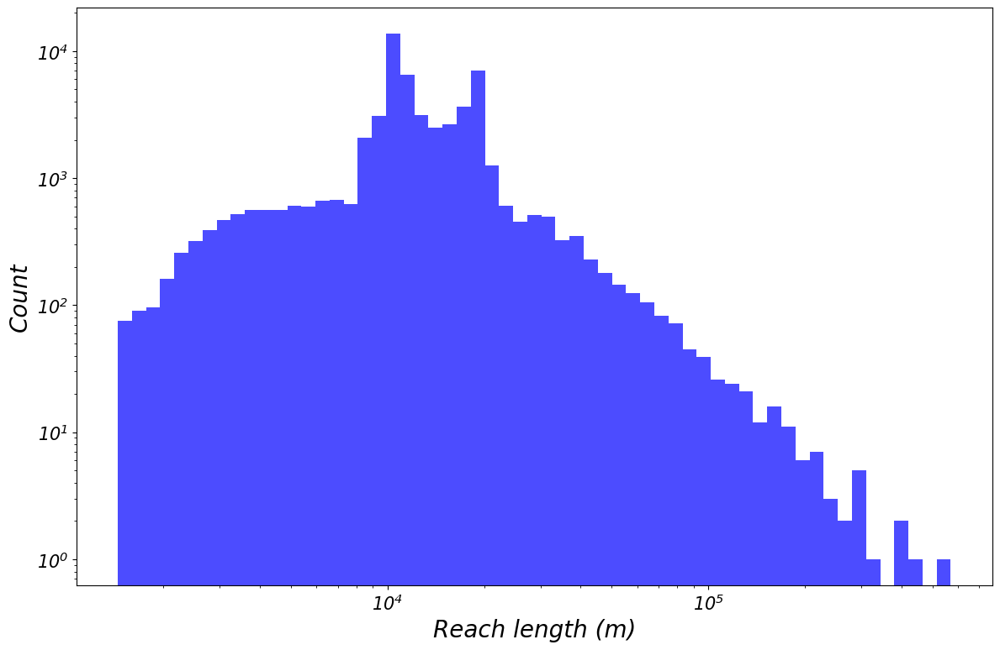

In [39]:

log_scaled_histogram(dfG, ['combined_reach_len'], 1, 1,
                     ['Reach length (m)'], ['Count'], 
                      '', 'hist_reach_len', labelTextSize, bins = 60)

### bendWidth / bendMaxwidth

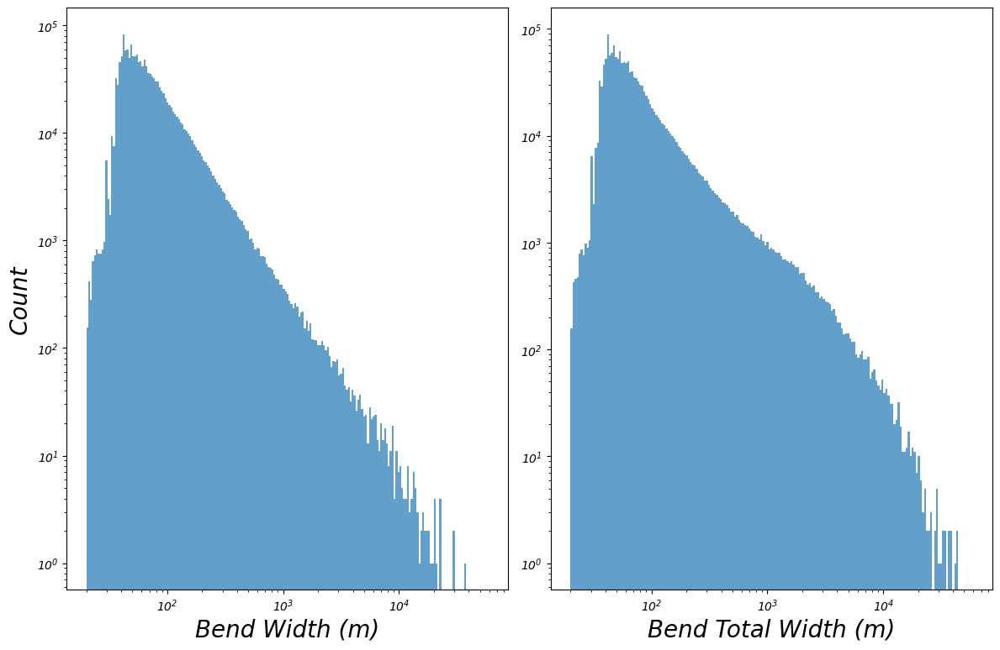

In [11]:
log_scaled_histogram(df, ['bendWidths', 'bendMaxWidths'], 1, 2,
                     ['Bend Width (m)', 'Bend Total Width (m)'], ['Count'], 
                      '', 'hist_bendWidths', labelTextSize)


### Sinuosity / curve ang

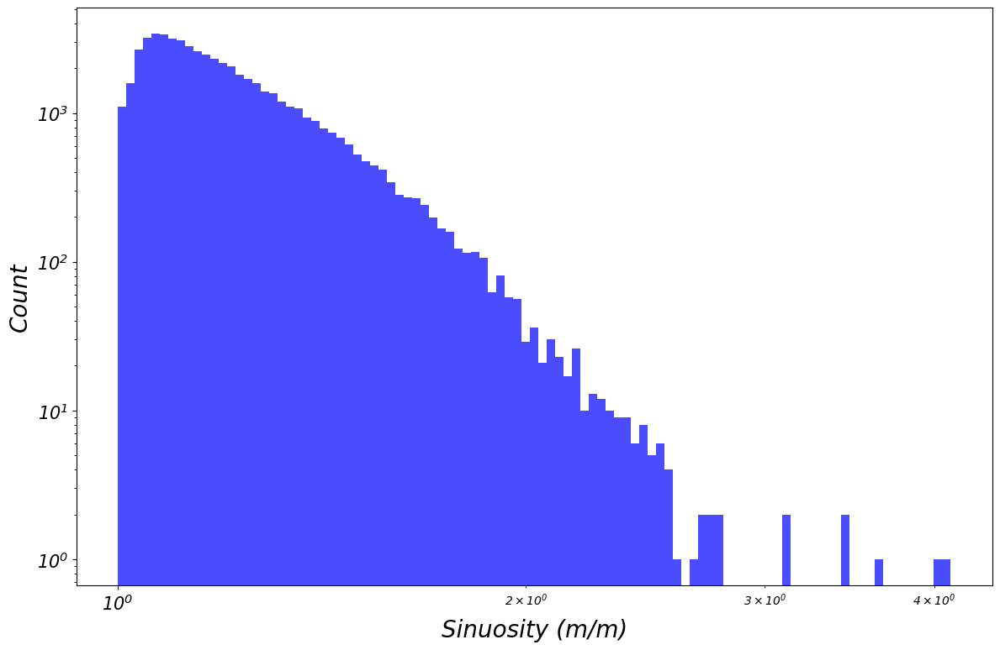

In [42]:
log_scaled_histogram(dfG, ['sin'], 1, 1,
                     ['Sinuosity (m/m)'], ['Count'], 
                      '', 'hist_sin', labelTextSize, bins = 100)



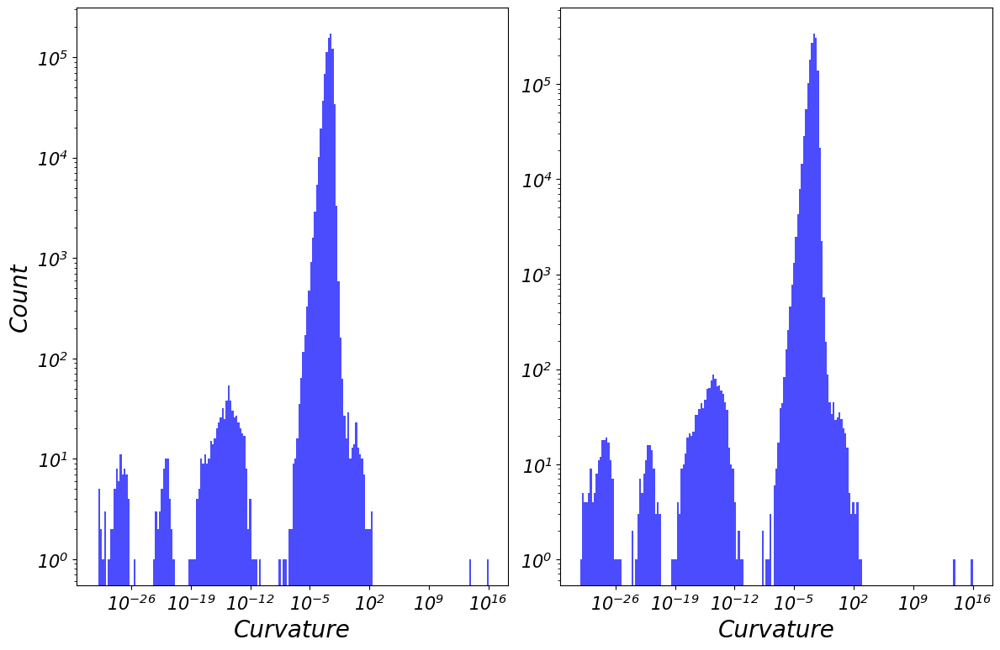

In [43]:
df['ang_abs'] = df['ang'].abs()
log_scaled_histogram(df, ['ang', 'ang_abs'], 1, 2,
                     ['Curvature', 'Curvature'], ['Count'], 
                      '', 'hist_ang', labelTextSize, bins = 200)
####################
# absolute????

### Apex / apex vs bendWidth

In [76]:
df[df['nonDimAmp'] < 0.5].shape[0]

36703

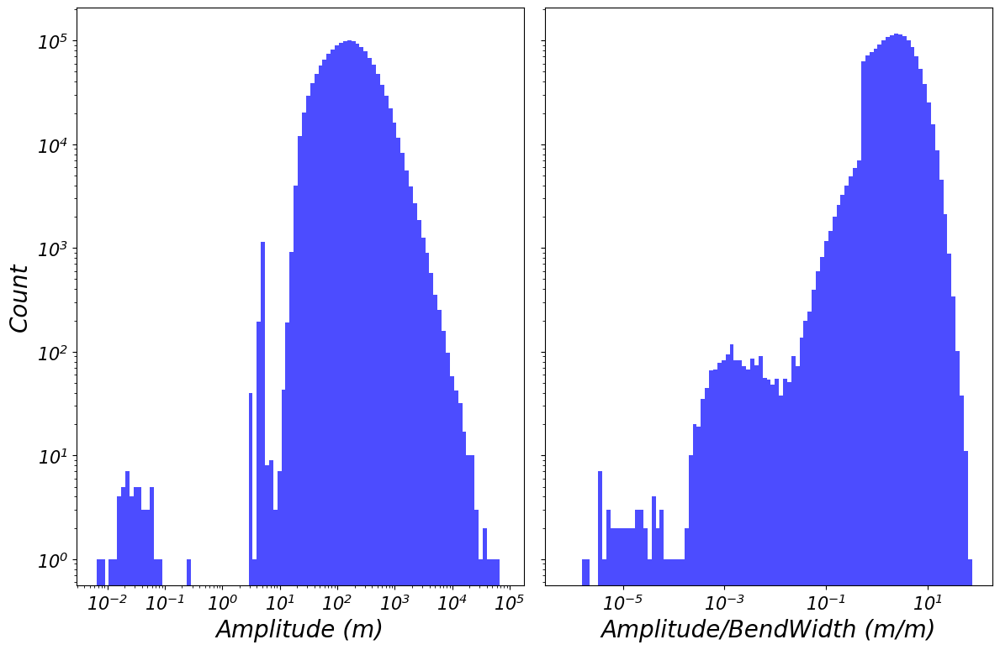

In [44]:
log_scaled_histogram(df, ['apex', 'nonDimAmp'], 1, 2,
                     ['Amplitude (m)', 'Amplitude/BendWidth (m/m)'], ['Count'], 
                      '', 'hist_ampBendWidth', labelTextSize, False, True, bins = 100)


### Catchment Position

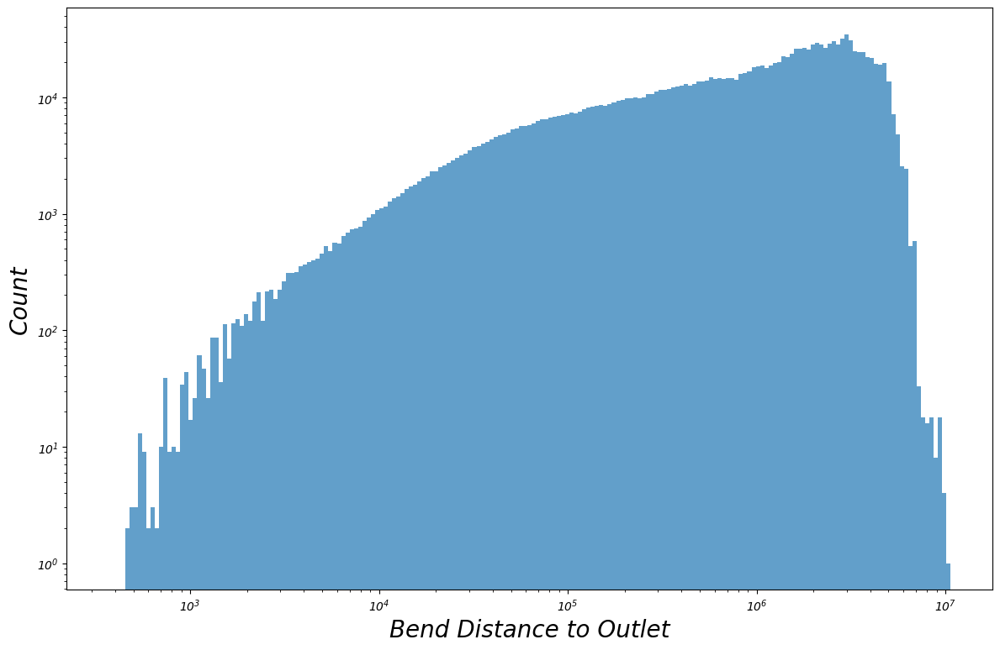

In [19]:

log_scaled_histogram(df, ['bendDistOut'], 1, 1,
                     ['Bend Distance to Outlet'], ['Count'], 
                      '', 'catchmentPos_hist', labelTextSize)

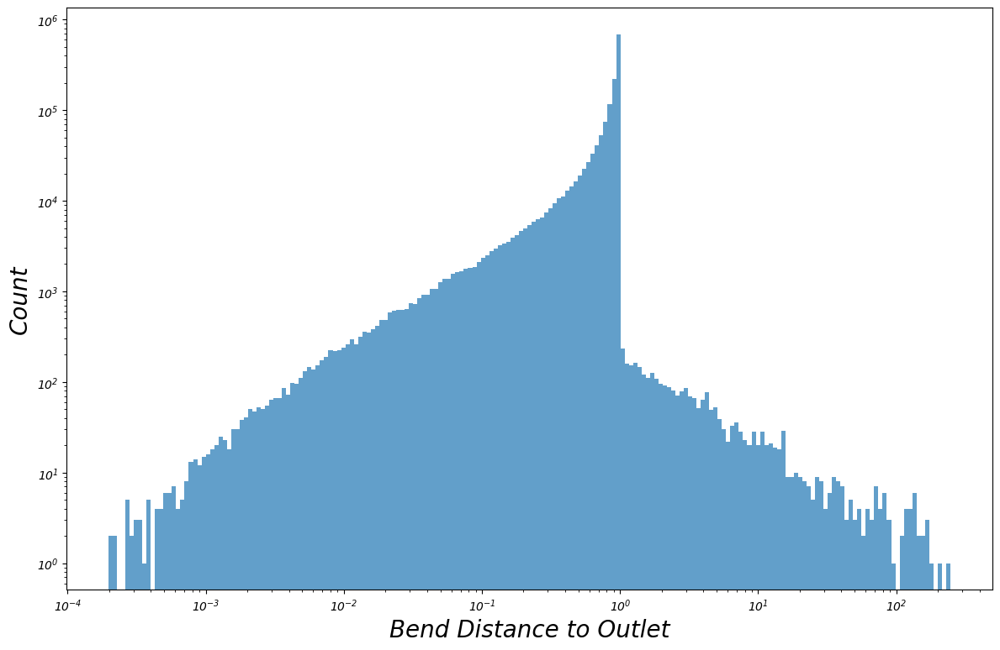

In [ ]:
#### Some problems in calculation... Shouldn't be above 1. Wrong max dist out???
log_scaled_histogram(df, ['bend_catch_pos'], 1, 1,
                     ['Bend Distance to Outlet'], ['Count'], 
                      '', 'catchmentPos_hist', labelTextSize)

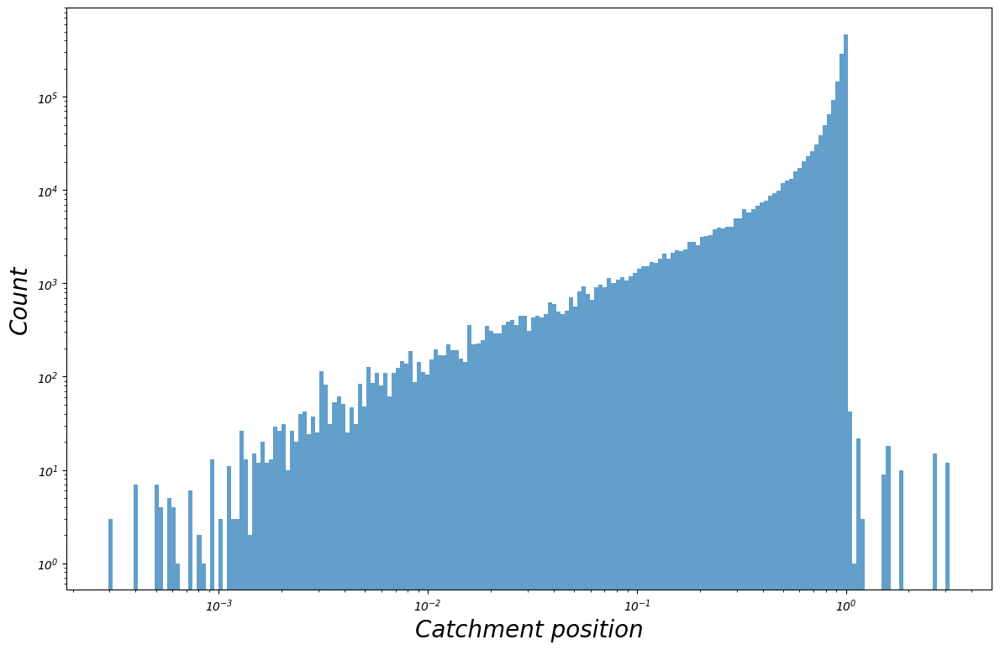

In [18]:

log_scaled_histogram(df, ['catchment_position'], 1, 1,
                     ['Catchment position'], ['Count'], 
                      '', 'catchmentPos_hist', labelTextSize)

### Elevation

<Axes: xlabel='cp_height', ylabel='Density'>

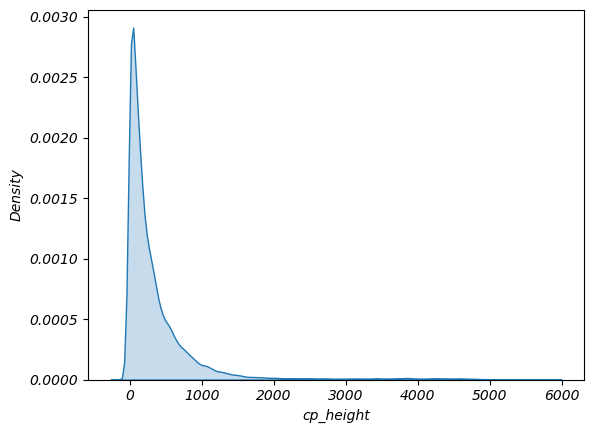

In [8]:
sns.kdeplot(data = df, x = 'cp_height', fill = True)

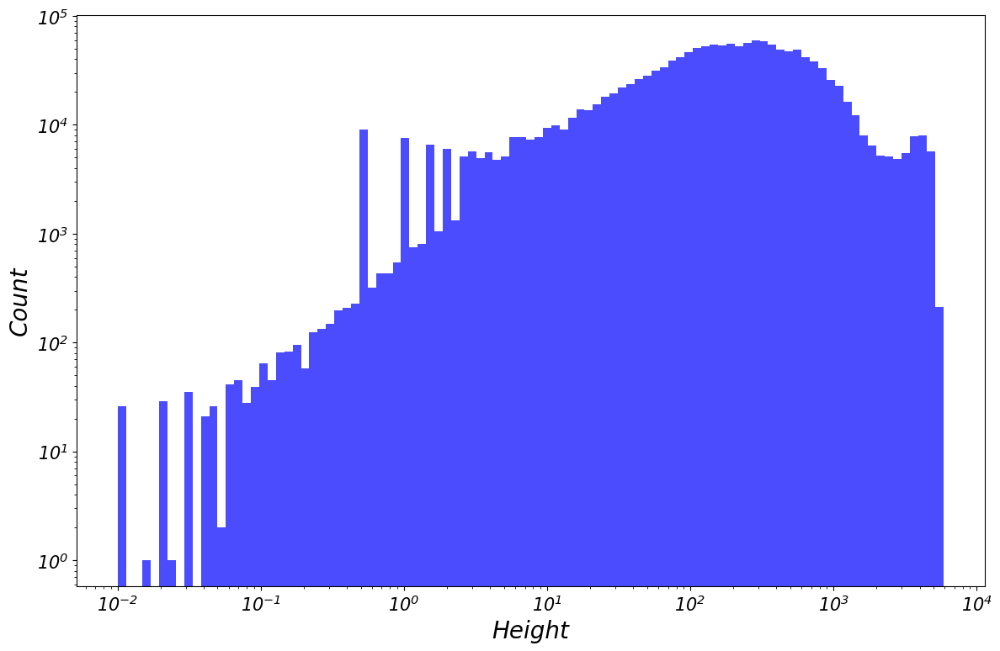

In [46]:
log_scaled_histogram(df, ['cp_height'], 1, 1,
                     ['Height'], ['Count'], 
                      '', 'catchmentPos_hist', labelTextSize,bins =  100)

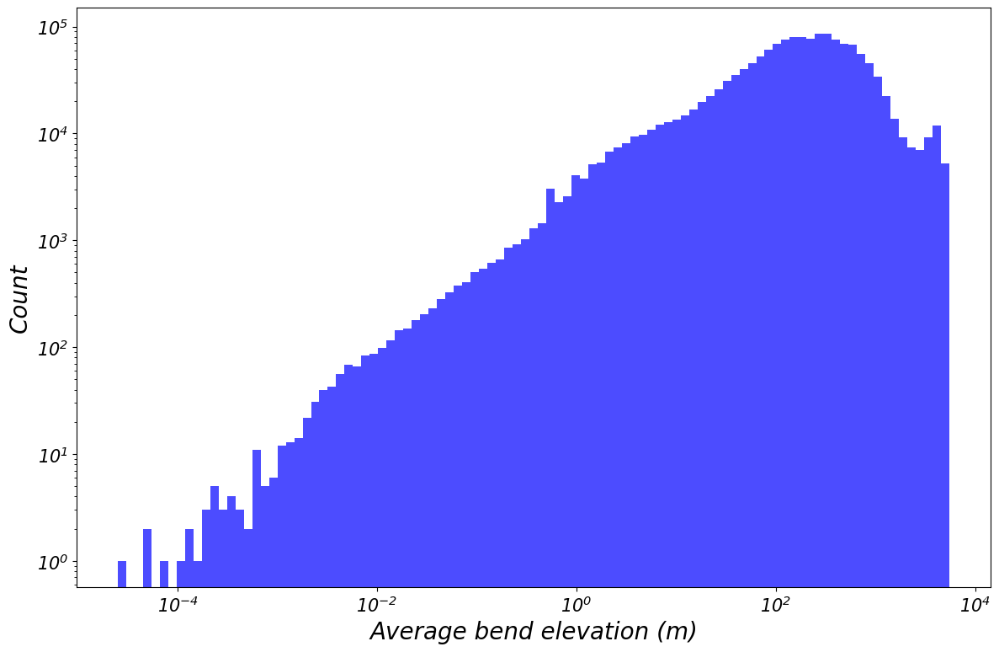

In [51]:
log_scaled_histogram(df, ['bendHeight'], 1, 1,
                     ['Average bend elevation (m)'], ['Count'], 
                      '', 'hist_bendHeight', labelTextSize, bins = 100)

### confinement Ratio

In [31]:
10**-0.3, 10**0,10**0.5,10**1,10**1.5

np.log10(0.5), np.log10(2)
print('[')
for i in [0.5,1,2,3,4,5,10,20, 50]:
    print(np.round(np.log10(i), 3), ',')
print(']')


[
-0.301 ,
0.0 ,
0.301 ,
0.477 ,
0.602 ,
0.699 ,
1.0 ,
1.301 ,
1.699 ,
]


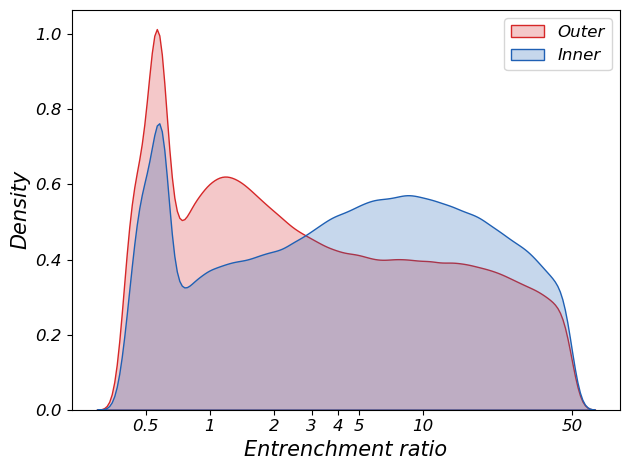

In [36]:
df['ER_out_log'] = np.log10(df['ER_out'])
df['ER_inn_log'] = np.log10(df['ER_inn'])
f,ax = plt.subplots()
sns.kdeplot(data = df,x = 'ER_out_log', fill=True, ax = ax, color = psd['colorOut'], label = 'Outer')
sns.kdeplot(data = df,x = 'ER_inn_log', fill=True, ax = ax, color = psd['colorInn'], label = 'Inner')
ax.set_xlabel('Entrenchment ratio', fontsize = psd['labelSize'])
ax.set_ylabel('Density', fontsize = psd['labelSize'])
ax.tick_params(axis = 'both', which = 'major', labelsize = psd['tickSize'])

plt.legend(title_fontsize = psd['legendTitleSize'], fontsize = psd['legendEntrySize'])

ax.set_xticks([-0.301 ,0.0 ,0.301 ,0.477 ,0.602 ,0.699 ,1.0, 1.699], [0.5,1,2,3,4,5,10, 50])
plt.tight_layout()
plt.savefig(directory + 'results/figures/ER_inOut_02_KDE.png', dpi = psd['saveResolution'])
plt.show()



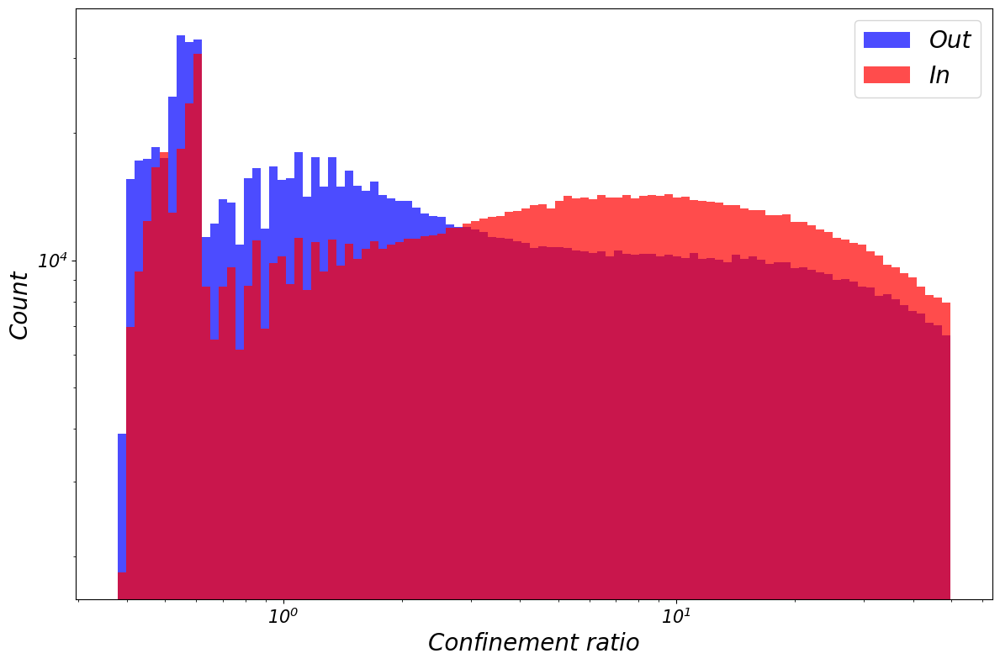

In [52]:
f, ax = plt.subplots(nrows = 1, ncols = 1, figsize  = [12,8], squeeze = False)
X = ['ER_out', 'ER_inn']
color = ['blue', 'red']
leg = ['Out', 'In']
c = r = 0
for i in range(len(X)):
    x = df[X[i]]
    if x.min() <= 0:
        x = x[x > 0]
    bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=100)

    # Create histogram
    ax[r,c].hist(x, bins=bin_edges, alpha=0.7, color = color[i], label = leg[i])
ax[r,c].set_xscale('log')
ax[r,c].set_yscale('log')
ax[r,c].set_ylabel('Count'            , fontsize = labelTextSize)
ax[r,c].set_xlabel('Confinement ratio', fontsize = labelTextSize)
ax[r,c].tick_params(axis='both', which='major', labelsize=tickSize)
# f.suptitle('Log Log Confinement Ratio', fontsize = labelTextSize)
plt.tight_layout()
plt.legend(fontsize = labelTextSize)
plt.savefig(directory + 'results/figures/conf_ratio_inn_out.png')
plt.show()

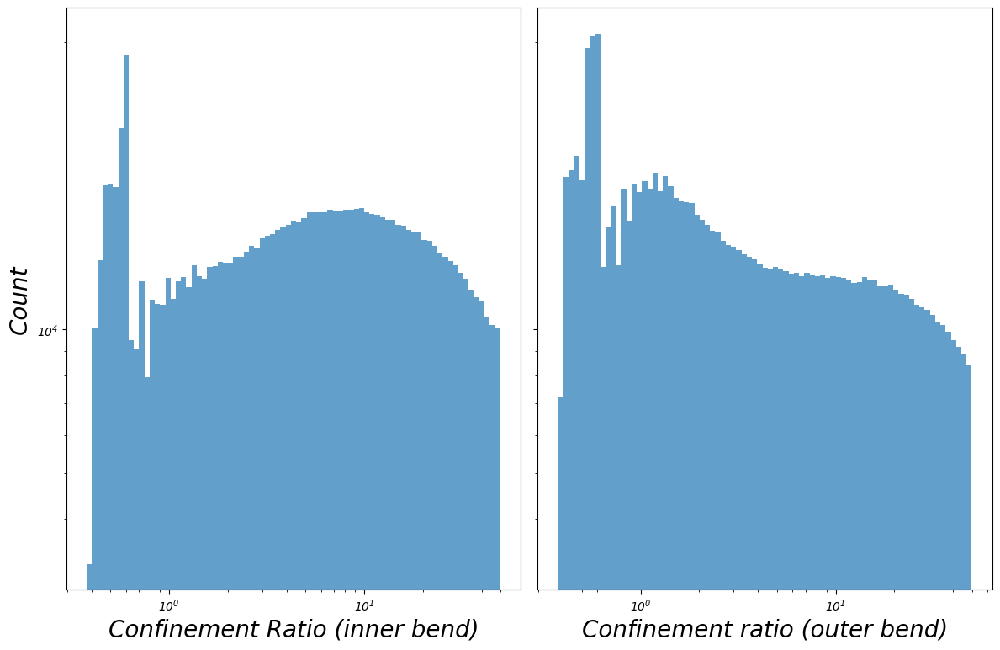

In [29]:
log_scaled_histogram(df, ['ER_inn', 'ER_out'], 1, 2,
                     ['Confinement Ratio (inner bend)', 'Confinement ratio (outer bend)'], ['Count'], 
                      '', 'hist_ER_outinn', labelTextSize, True, True, 80)

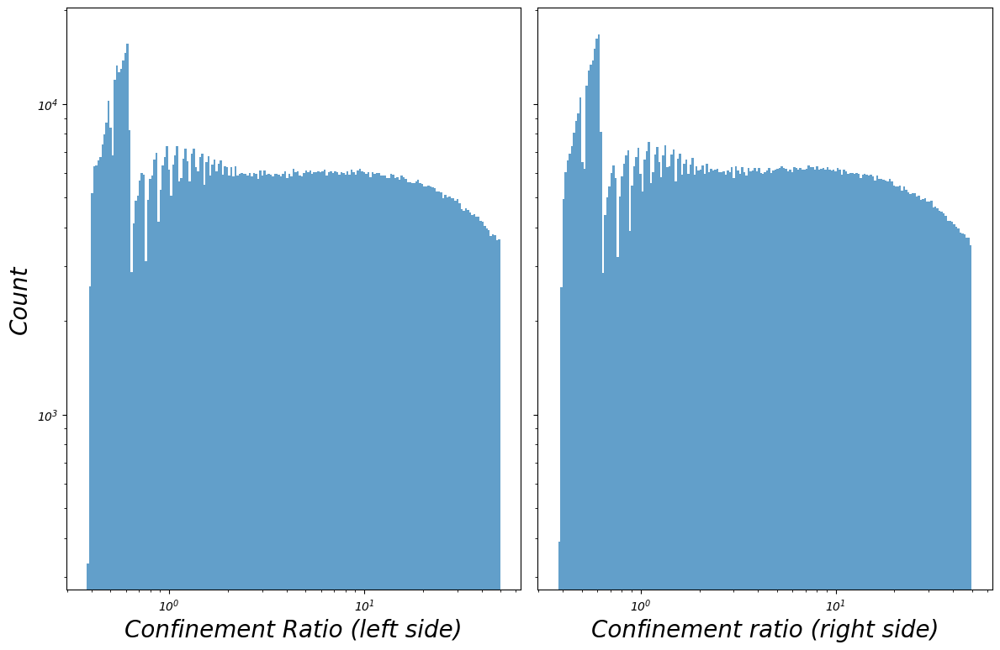

In [30]:
log_scaled_histogram(df, ['ER_left', 'ER_right'], 1, 2,
                     ['Confinement Ratio (left side)', 'Confinement ratio (right side)'], ['Count'], 
                      '', 'hist_ER_leftright', labelTextSize, True, True)

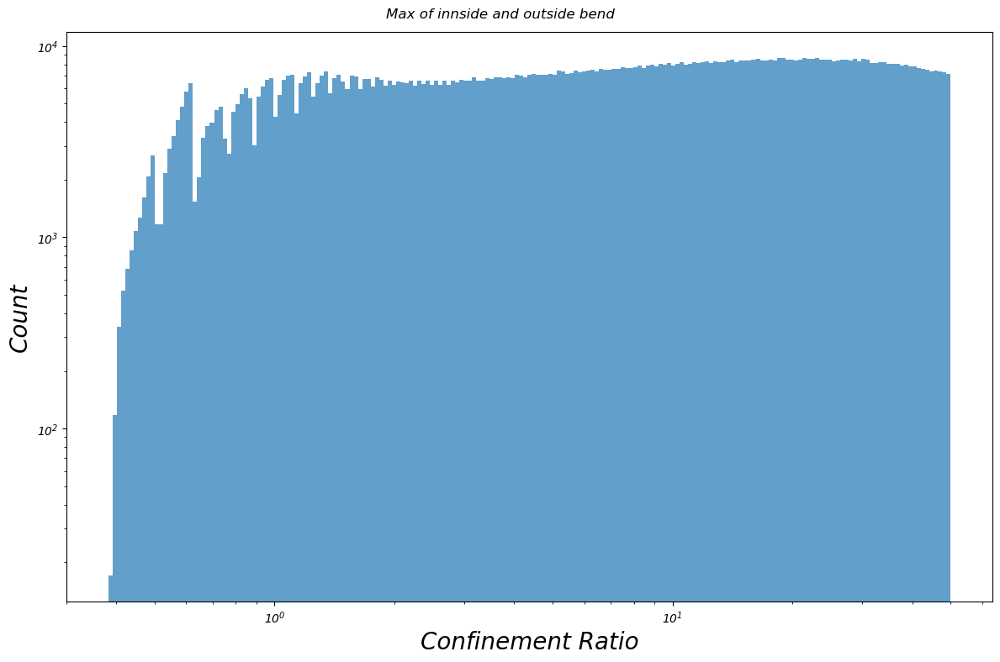

In [31]:
log_scaled_histogram(df, ['ER_max'], 1, 1,
                     ['Confinement Ratio'], ['Count'], 
                      'Max of innside and outside bend', '', labelTextSize)

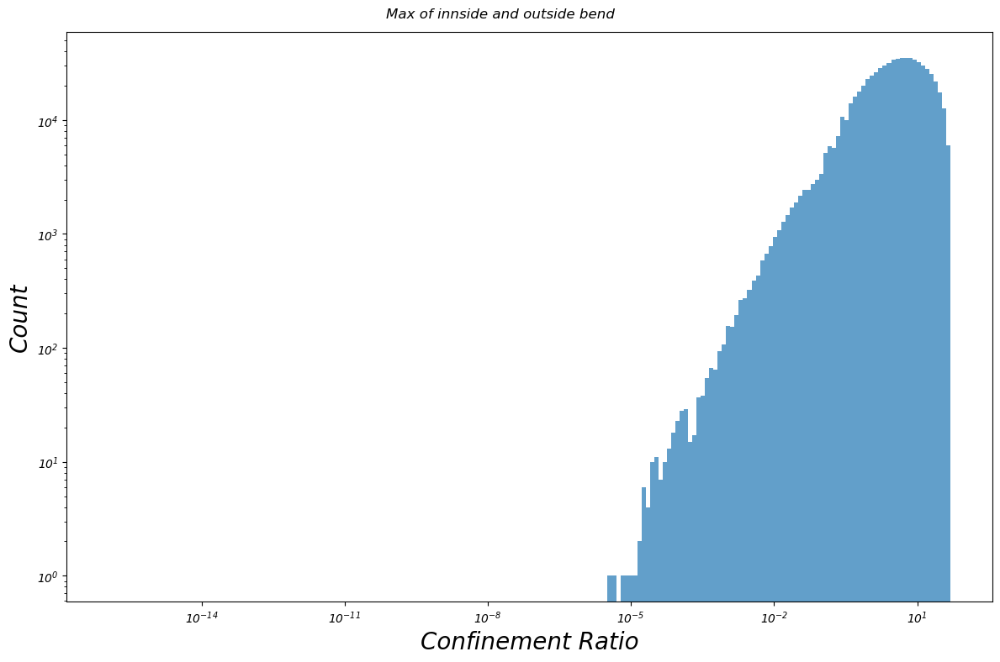

In [39]:
log_scaled_histogram(df, ['ER_diff_bendSide'], 1, 1,
                     ['Confinement Ratio'], ['Count'], 
                      'Max of innside and outside bend', '', labelTextSize)

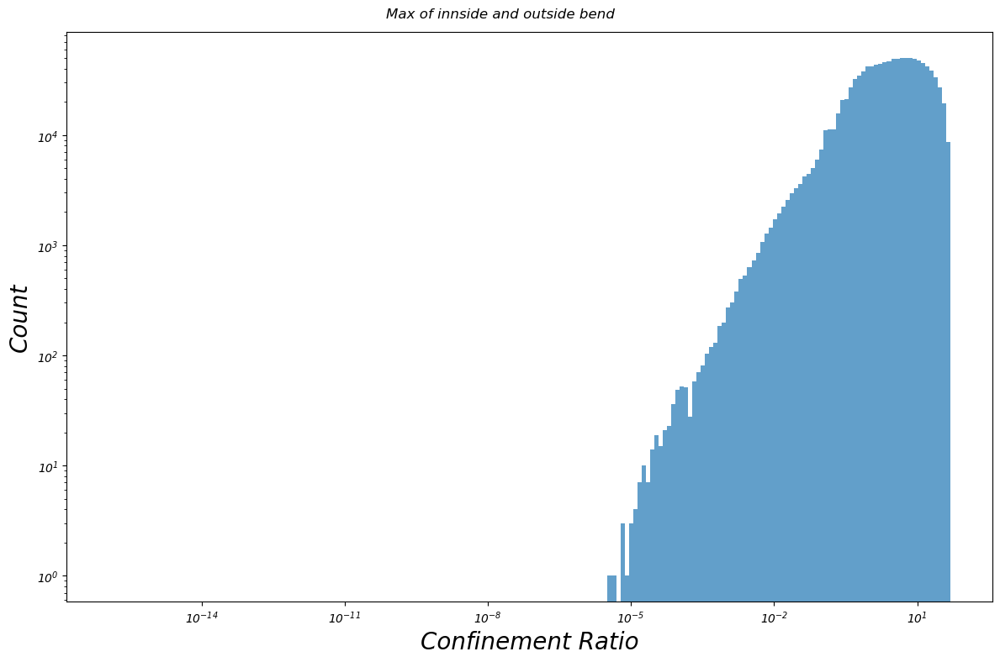

In [40]:
log_scaled_histogram(df, ['ER_diff_bendSide_abs'], 1, 1,
                     ['Confinement Ratio'], ['Count'], 
                      'Max of innside and outside bend', '', labelTextSize)

### Confinement & slope ratio per catchment

In [9]:
def catchment_filter_reach_id(df,targetCont, targetID):
    targetRow = df.loc[(df['combined_reach_id'] == targetID) & (df['file'] == targetCont), 
                       ['file', 'networkGraph']].iloc[0]
    dfCatchment = df[(df['file'] == targetRow['file']) & (df['networkGraph'] == targetRow['networkGraph'])]
    return dfCatchment

def hist_plot_overlay(df, cols, xlab, ylab, title, bins = 50):
    f, ax = plt.subplots(nrows = 1, ncols = 1, figsize  = [12,8], squeeze = False)
    
    color = ['blue', 'red']
    leg = ['Out', 'In']
    c = r = 0
    for i in range(len(cols)):
        x = df[cols[i]]
        if x.min() <= 0:
            x = x[x > 0]
        bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=bins)

        # Create histogram
        ax[r,c].hist(x, bins=bin_edges, alpha=0.7, color = color[i], label = leg[i])
    ax[r,c].set_xscale('log')
    ax[r,c].set_yscale('log')
    ax[r,c].set_ylabel(ylab, fontsize = labelTextSize)
    ax[r,c].set_ylabel(xlab, fontsize = labelTextSize)

    f.suptitle(title, fontsize = labelTextSize)
    plt.tight_layout()
    plt.legend(fontsize = labelTextSize)
    plt.show()

#### Amazone Catchment

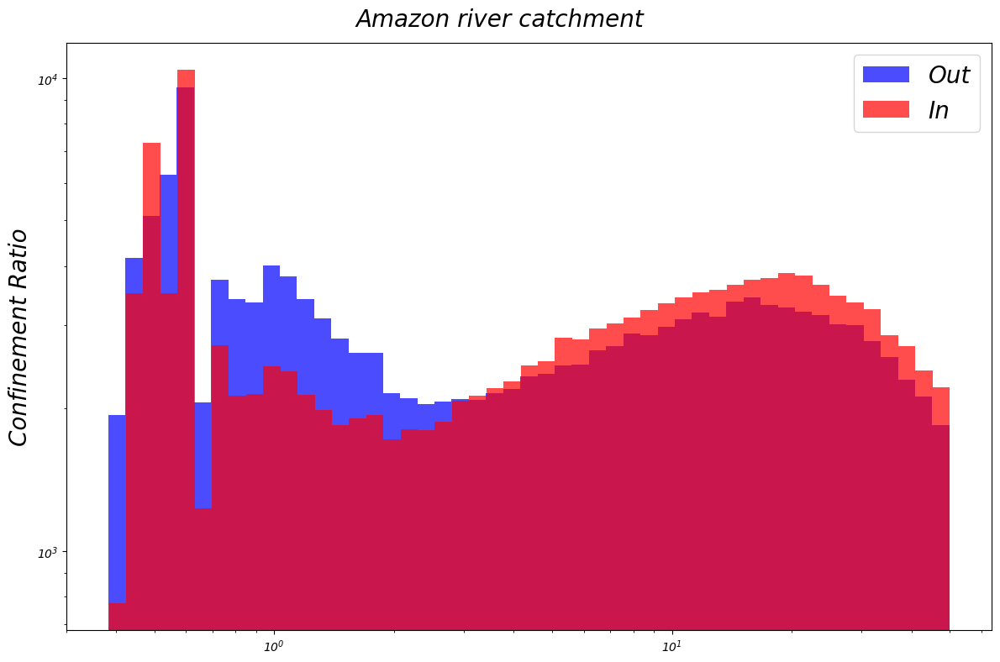

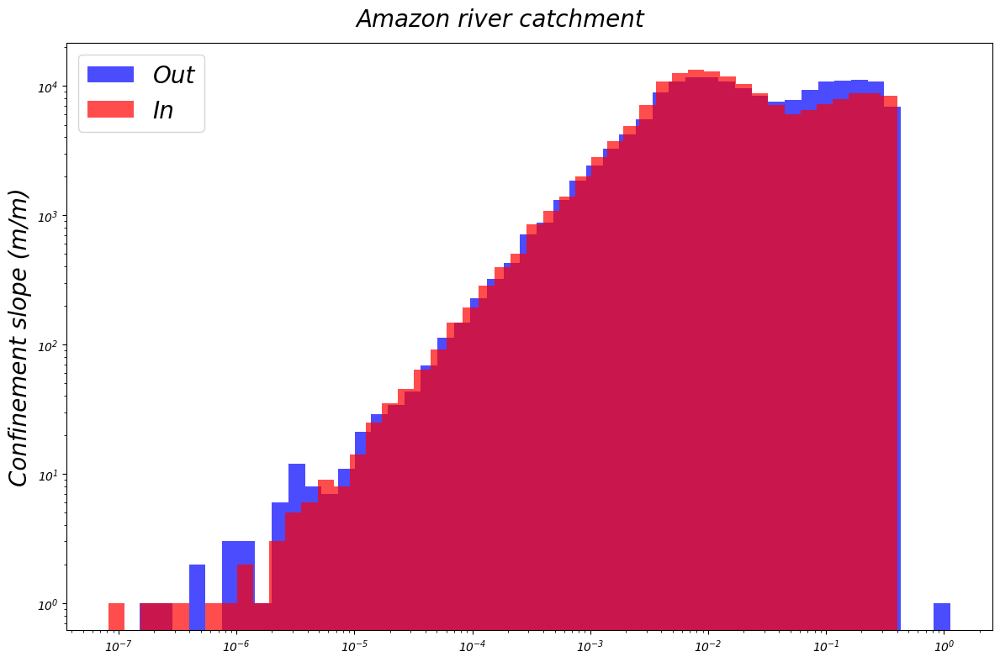

In [90]:
dfAmazon = catchment_filter_reach_id(df,'sa', 4409)

hist_plot_overlay(dfAmazon, ['ER_out', 'ER_inn'], 'Confinement Ratio', 'Count', 'Amazon river catchment', 50)
hist_plot_overlay(dfAmazon, ['slope_out', 'slope_inn'], 'Confinement slope (m/m)', 'Count', 'Amazon river catchment', 50)

#### Rhine catchment

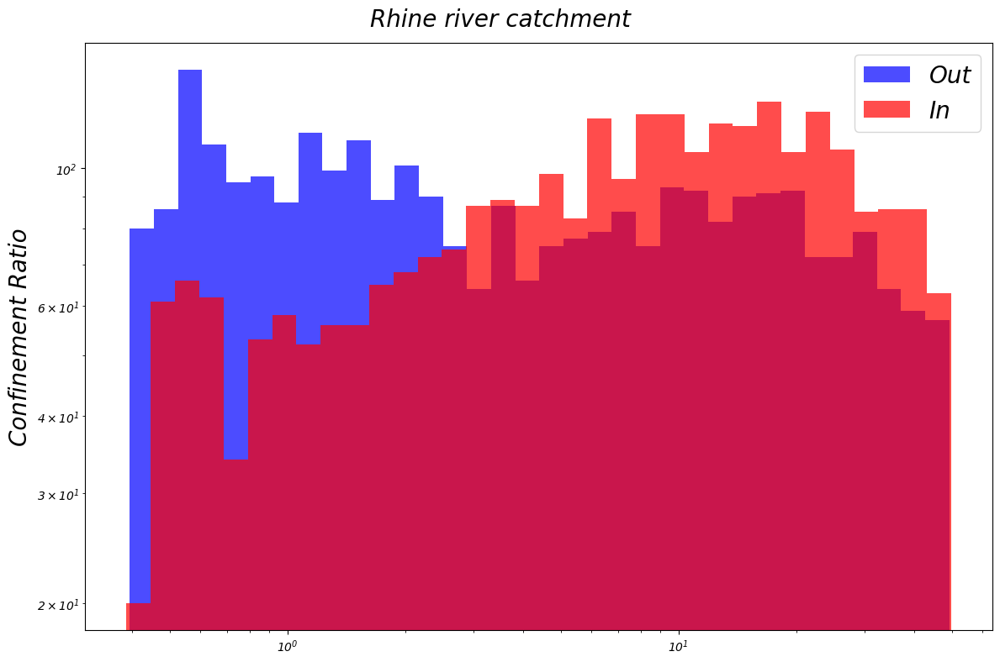

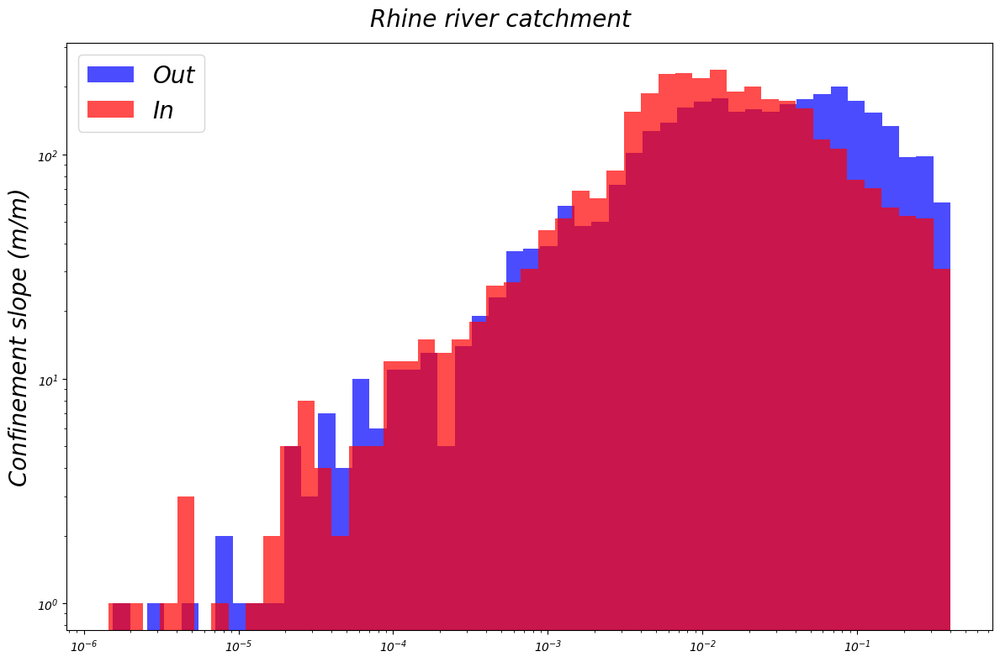

In [ ]:
dfCatch = catchment_filter_reach_id(df,'eu', 5878)

hist_plot_overlay(dfCatch, ['ER_out', 'ER_inn'], 'Confinement Ratio', 'Count', 'Rhine river catchment', 35)
hist_plot_overlay(dfCatch, ['slope_out', 'slope_inn'], 'Confinement slope (m/m)', 'Count', 'Rhine river catchment', 50)



#### Brahmaputra catchment

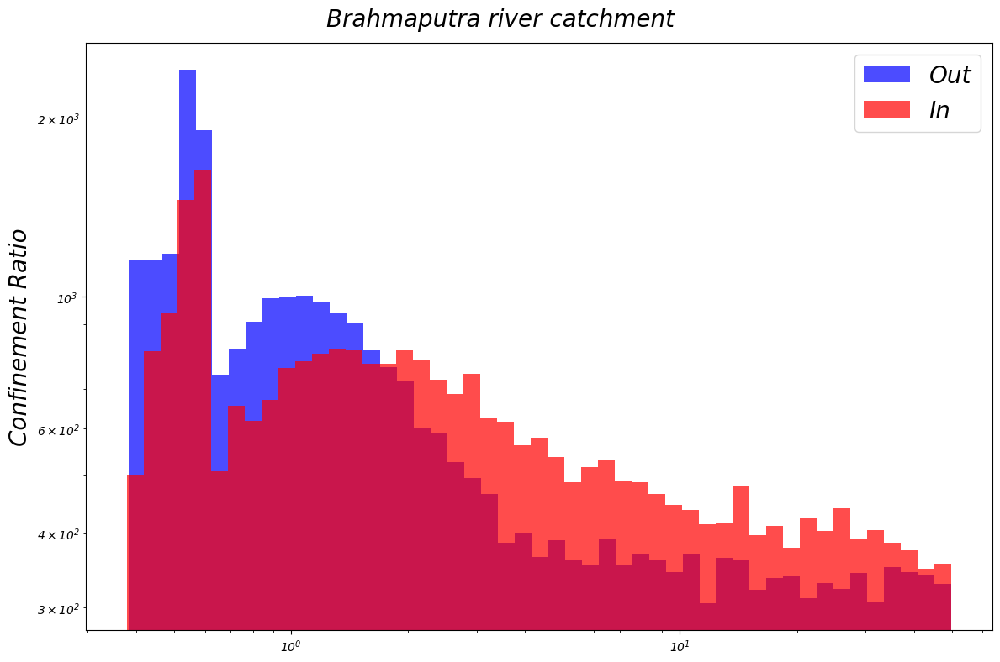

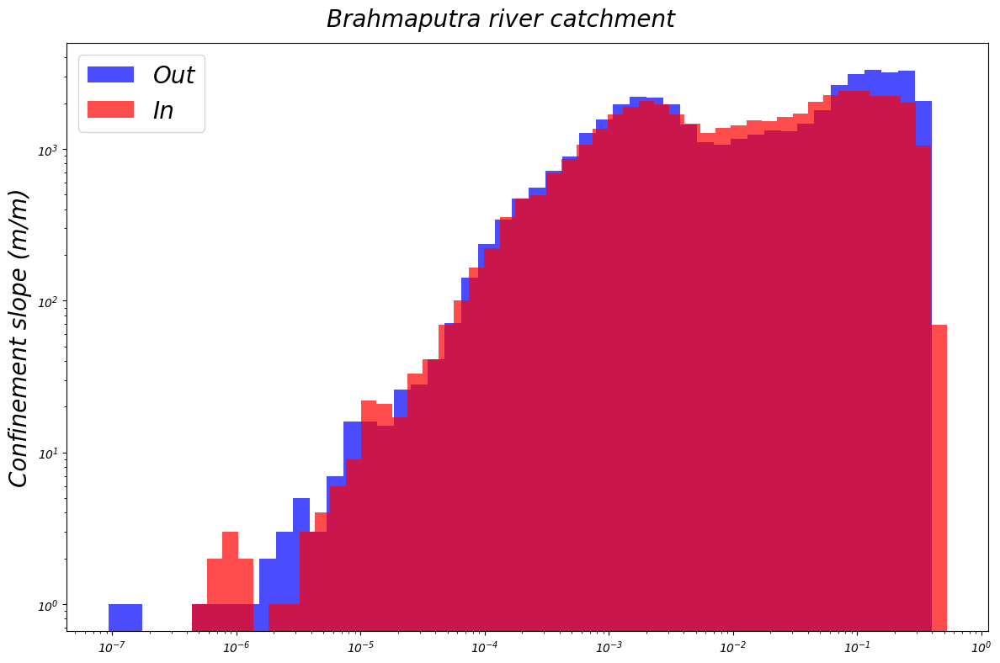

In [95]:
dfCatch = catchment_filter_reach_id(df,'as', 45203)

hist_plot_overlay(dfCatch, ['ER_out', 'ER_inn'], 'Confinement Ratio', 'Count', 'Brahmaputra river catchment', bins = 50)
hist_plot_overlay(dfCatch, ['slope_out', 'slope_inn'], 'Confinement slope (m/m)', 'Count', 'Brahmaputra river catchment', bins = 50)

#### Colorado River 

findfont: Font family ['DejaVu Sans Display'] not found. Falling back to DejaVu Sans.


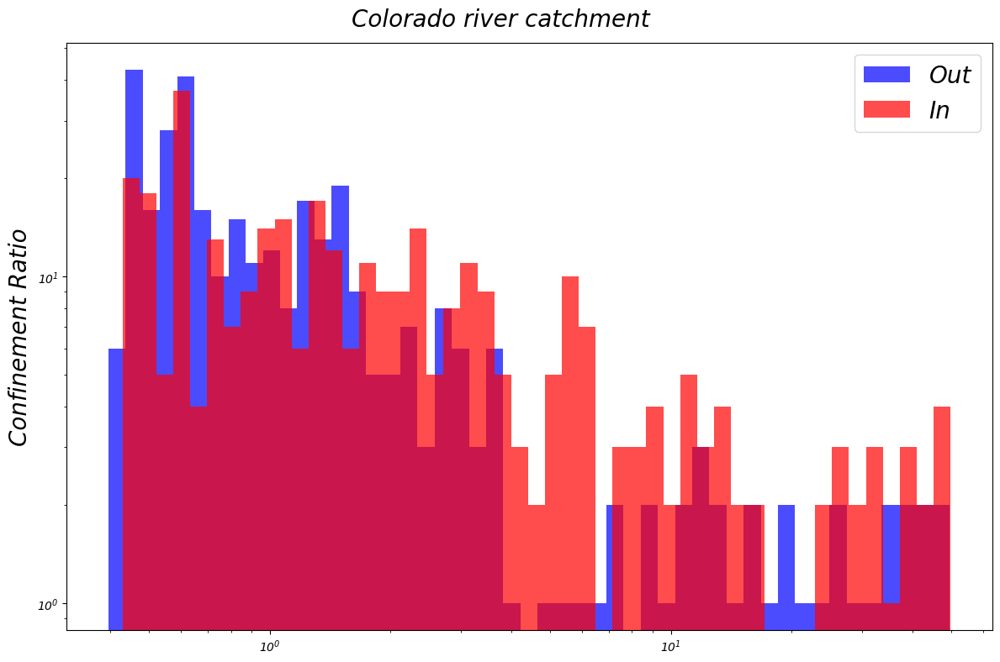

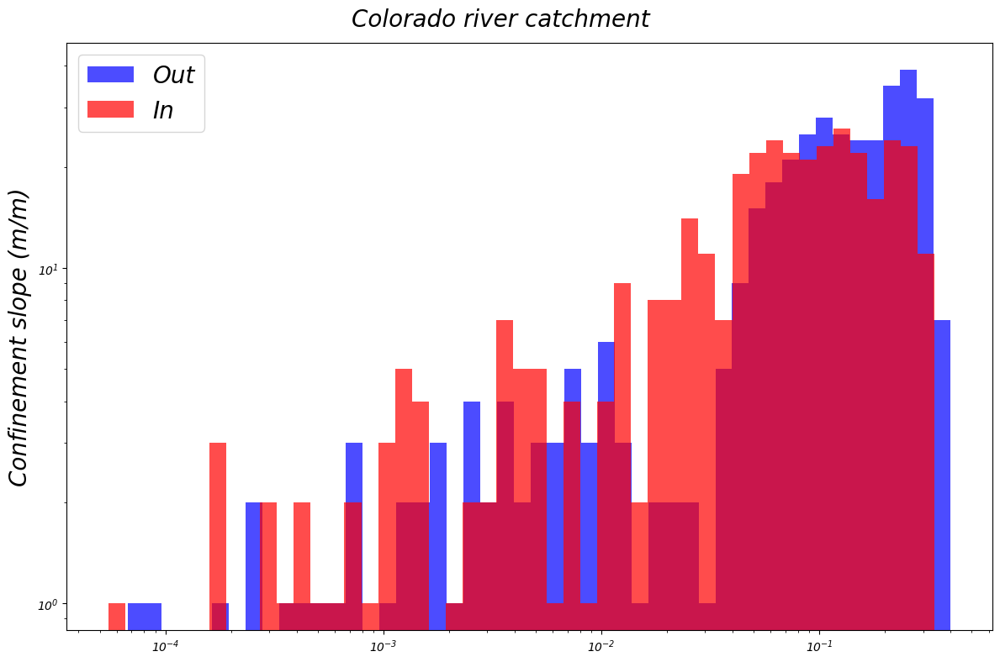

In [10]:
dfCatch = catchment_filter_reach_id(df,'na', 9307)

hist_plot_overlay(dfCatch, ['ER_out', 'ER_inn'], 'Confinement Ratio', 'Count', 'Colorado river catchment', bins = 50)
hist_plot_overlay(dfCatch, ['slope_out', 'slope_inn'], 'Confinement slope (m/m)', 'Count', 'Colorado river catchment', bins = 50)

#### North america

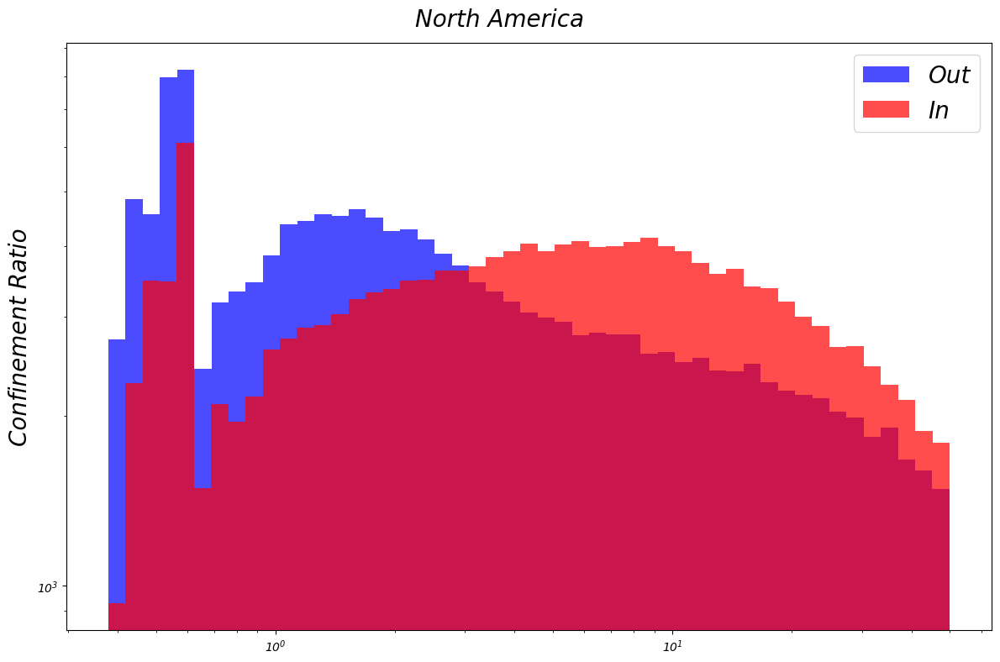

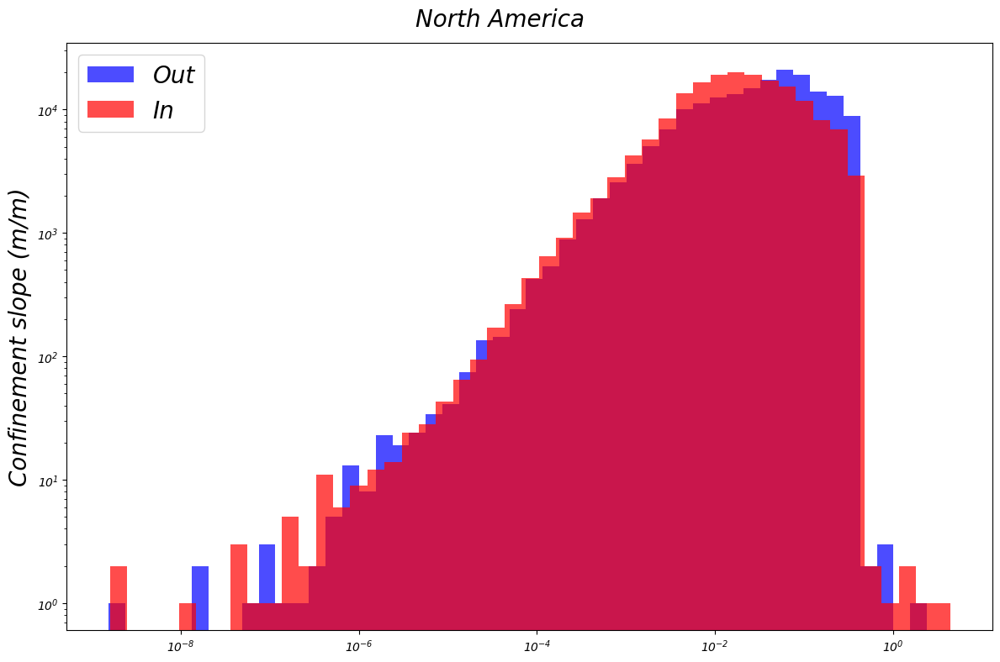

In [11]:
dfCatch = df[df['file'] == 'na']

hist_plot_overlay(dfCatch, ['ER_out', 'ER_inn'], 'Confinement Ratio', 'Count', 'North America', bins = 50)
hist_plot_overlay(dfCatch, ['slope_out', 'slope_inn'], 'Confinement slope (m/m)', 'Count', 'North America', bins = 50)

#### Africa

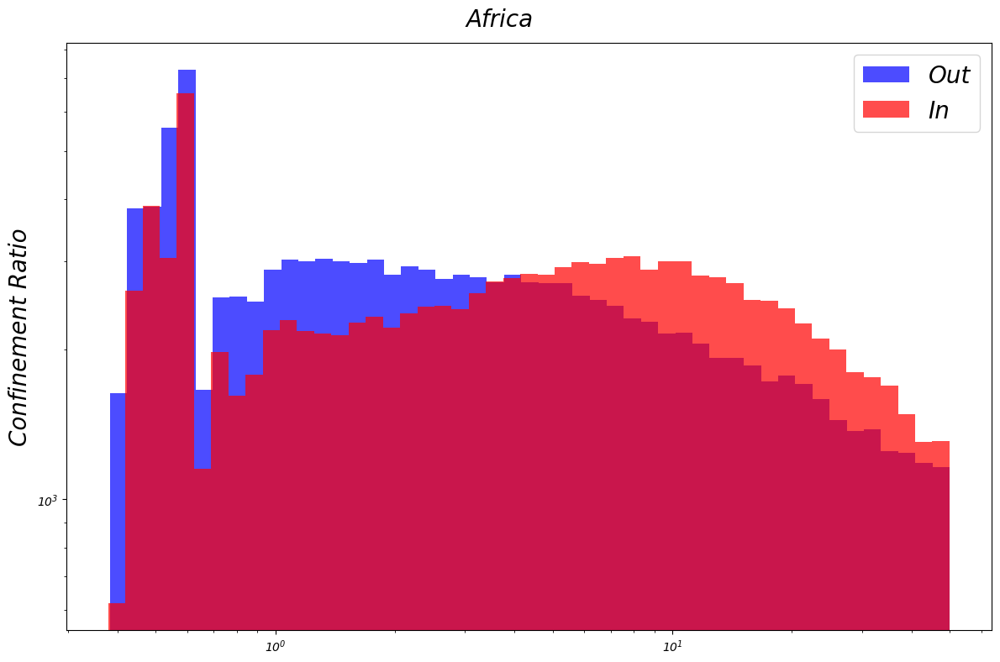

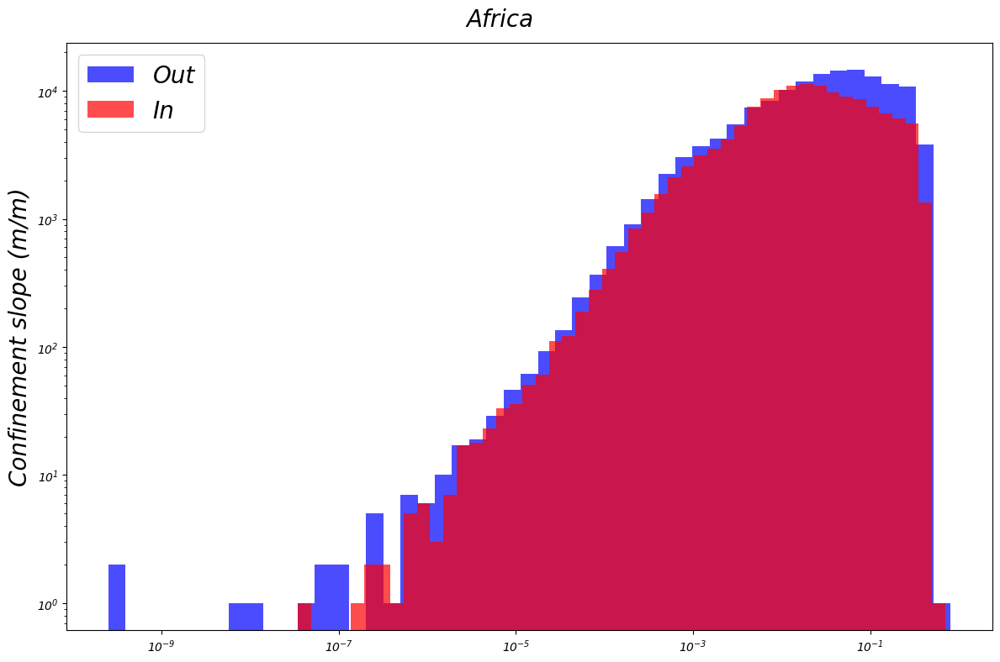

In [12]:
dfCatch = df[df['file'] == 'af']

hist_plot_overlay(dfCatch, ['ER_out', 'ER_inn'], 'Confinement Ratio', 'Count', 'Africa', bins = 50)
hist_plot_overlay(dfCatch, ['slope_out', 'slope_inn'], 'Confinement slope (m/m)', 'Count', 'Africa', bins = 50)


### Confinement slope

(-0.75, 0.5)

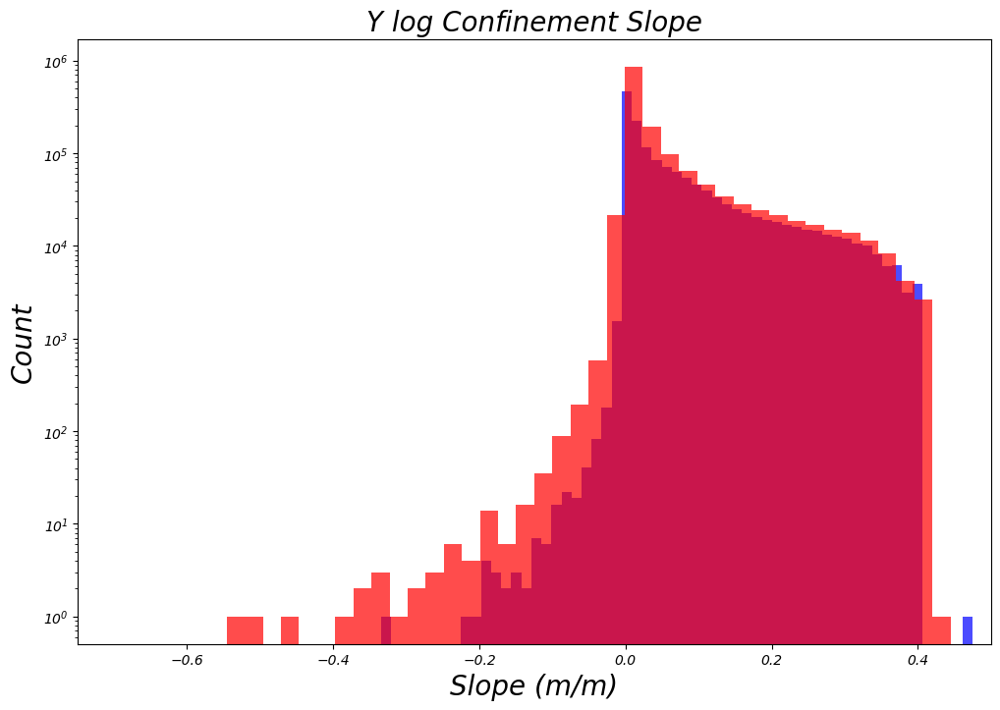

In [21]:
plt.figure(figsize = [12,8])
plt.hist(df['slope_out'], bins = 200, alpha = 0.7, color = 'blue')
plt.hist(df['slope_inn'], bins = 200, alpha = 0.7, color = 'red')
plt.yscale('log')
plt.title('Y log Confinement Slope', fontsize = labelTextSize)
plt.xlabel('Slope (m/m)', fontsize = labelTextSize)
plt.ylabel('Count', fontsize = labelTextSize)
plt.xlim([-0.75,0.5])

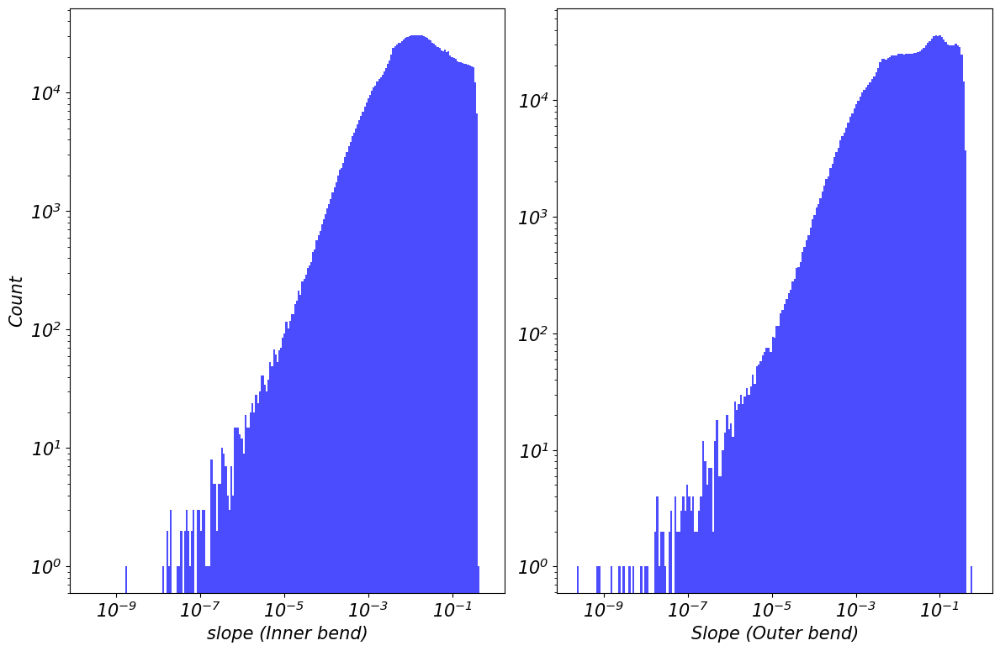

In [10]:
log_scaled_histogram(df, ['slope_inn', 'slope_out'], 1, 2,
                     ['slope (Inner bend)', 'Slope (Outer bend)'], ['Count'], 
                      '', 'hist_normSlope_outinn', labelTextSize)

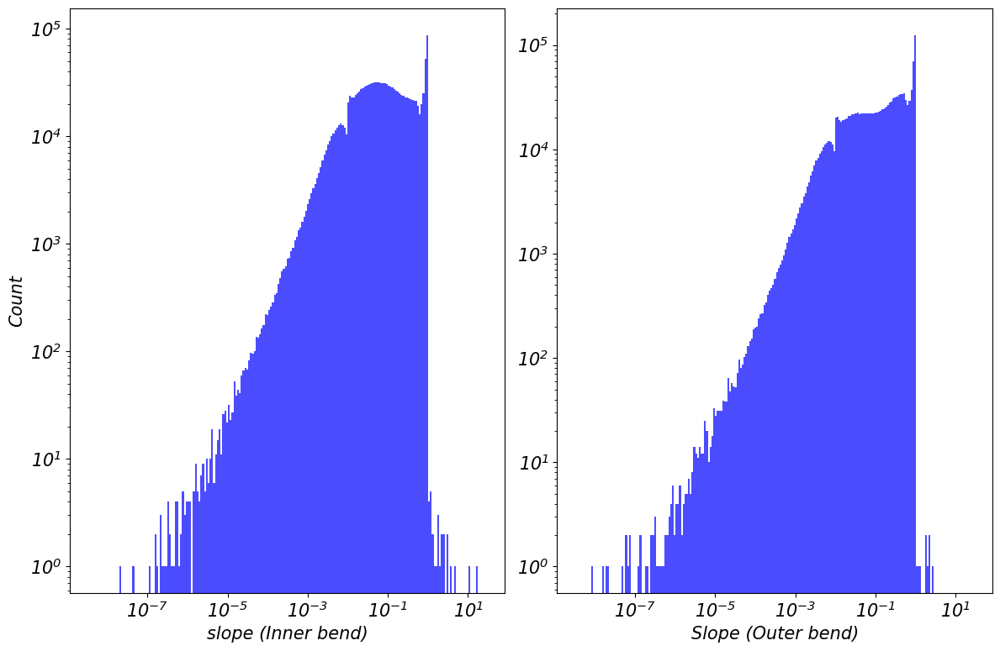

In [11]:
log_scaled_histogram(df, ['slope_inn_normalized', 'slope_out_normalized'], 1, 2,
                     ['slope (Inner bend)', 'Slope (Outer bend)'], ['Count'], 
                      '', 'hist_normSlope_outinn', labelTextSize)

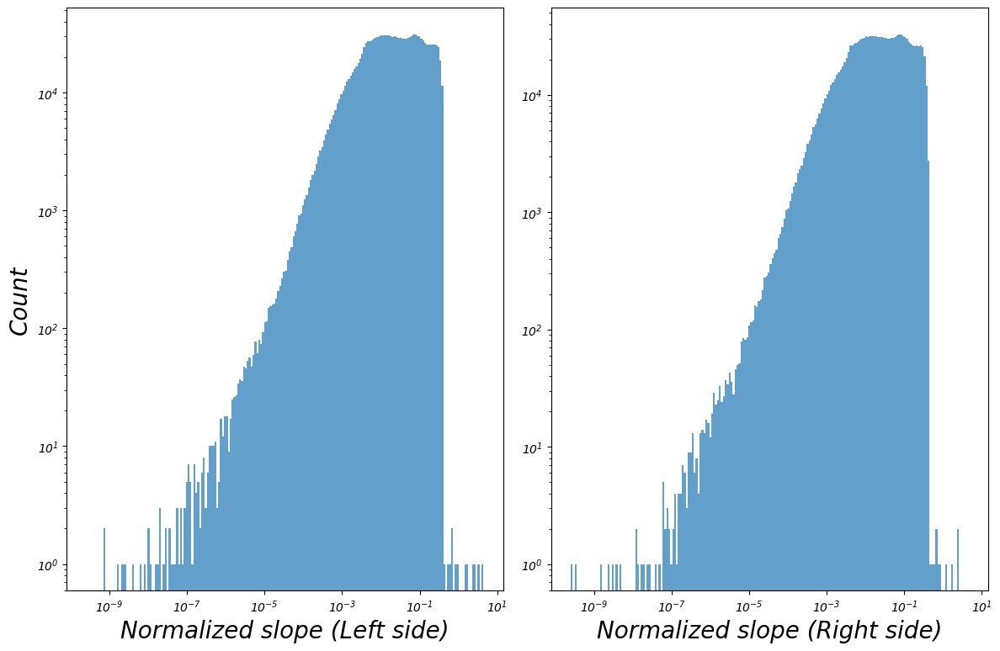

In [33]:
log_scaled_histogram(df, ['slope_left', 'slope_right'], 1, 2,
                     ['Normalized slope (Left side)', 'Normalized slope (Right side)'], ['Count'], 
                      '', 'hist_normSlope_outinn', labelTextSize)

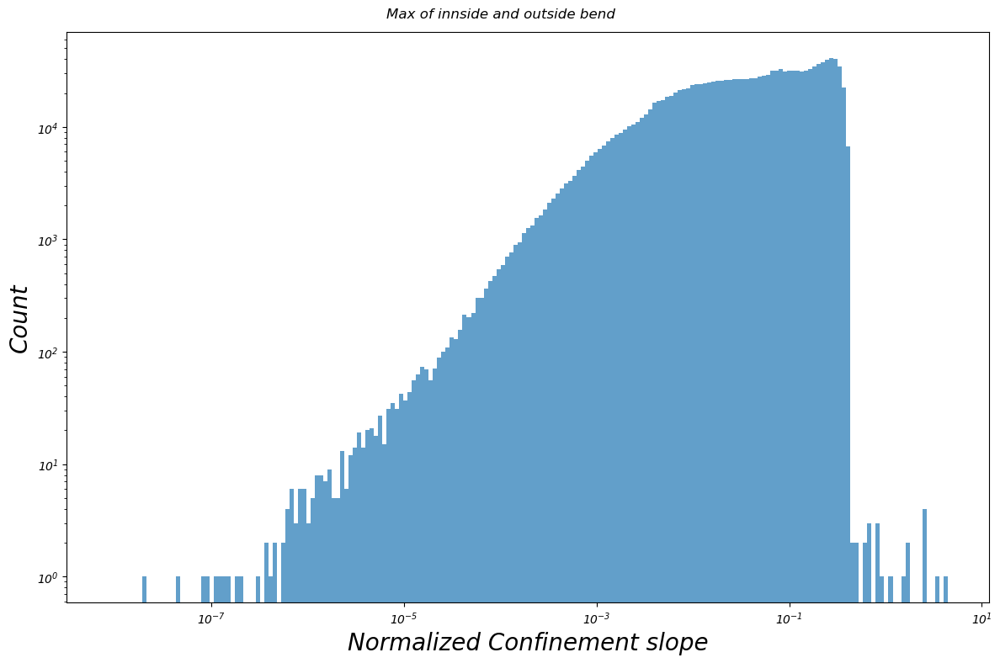

In [35]:
log_scaled_histogram(df, ['slope_max'], 1, 1,
                     ['Normalized Confinement slope'], ['Count'], 
                      'Max of innside and outside bend', '', labelTextSize)

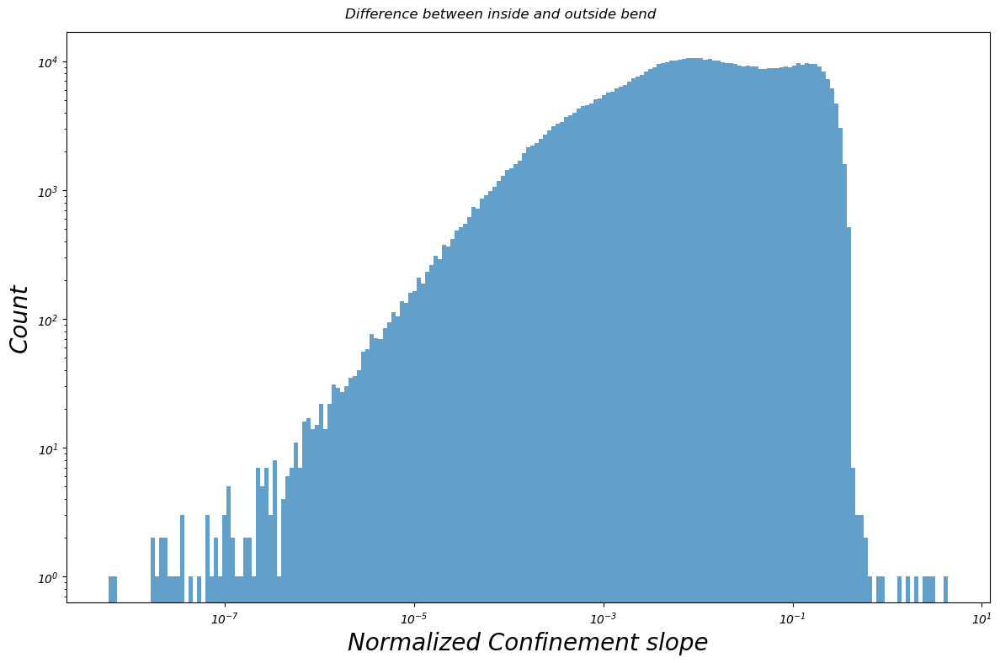

In [37]:
log_scaled_histogram(df, ['slope_diff_bendSide'], 1, 1,
                     ['Normalized Confinement slope'], ['Count'], 
                      'Difference between inside and outside bend', '', labelTextSize)

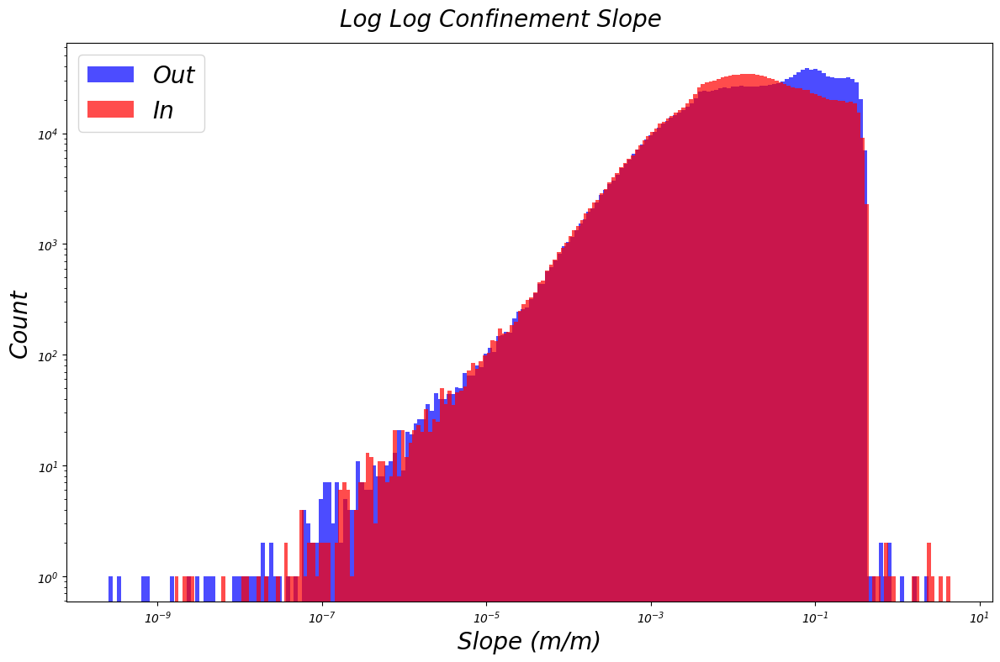

In [193]:
f, ax = plt.subplots(nrows = 1, ncols = 1, figsize  = [12,8], squeeze = False)
X = ['slope_out', 'slope_inn']
color = ['blue', 'red']
leg = ['Out', 'In']
c = r = 0
for i in range(len(X)):
    x = df[X[i]]
    if x.min() <= 0:
        x = x[x > 0]
    bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=200)

    # Create histogram
    ax[r,c].hist(x, bins=bin_edges, alpha=0.7, color = color[i], label = leg[i])
ax[r,c].set_xscale('log')
ax[r,c].set_yscale('log')
ax[r,c].set_ylabel('Count'      , fontsize = labelTextSize)
ax[r,c].set_xlabel('Slope (m/m)', fontsize = labelTextSize)

f.suptitle('Log Log Confinement Slope', fontsize = labelTextSize)
plt.tight_layout()
plt.legend(fontsize = labelTextSize)
plt.show()

### Confinement slope adjusted ???

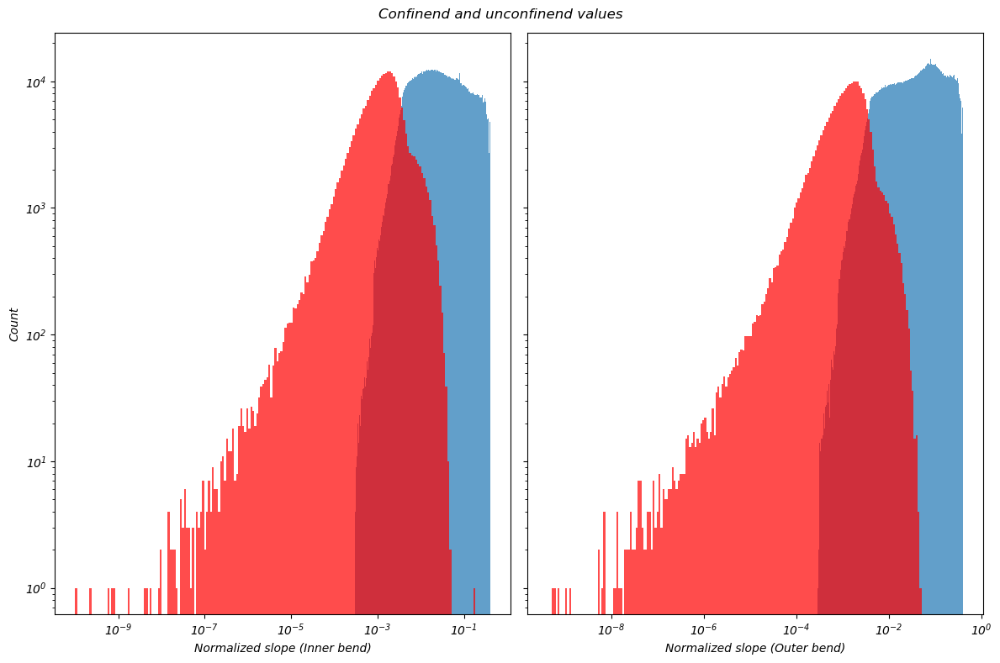

In [38]:
f, ax = plt.subplots(nrows = 1, ncols = 2, figsize  = [12,8], sharex = False, sharey= True,
                        squeeze = False)

##############
# innside bend
x = df.loc[~df['ER_inn'].isna(), 'slope_inn']
if x.min() <= 0:
    x = x[x > 0]
bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=200)
ax[0,0].hist(x, bins=bin_edges, alpha=0.7)

x = df.loc[df['ER_inn'].isna(), 'slope_inn']
if x.min() <= 0:
    x = x[x > 0]
bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=200)
ax[0,0].hist(x, bins=bin_edges, alpha=0.7, color = 'red')
ax[0,0].set_yscale('log')
ax[0,0].set_xscale('log')

##############
# Outside bend
x = df.loc[~df['ER_out'].isna(), 'slope_out']
if x.min() <= 0:
    x = x[x > 0]
bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=200)
ax[0,1].hist(x, bins=bin_edges, alpha=0.7)

x = df.loc[df['ER_out'].isna(), 'slope_out']
if x.min() <= 0:
    x = x[x > 0]

bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=200)
ax[0,1].hist(x, bins=bin_edges, alpha=0.7, color = 'red')
# ax[0,1].vlines(0.75,0, 10e5, linewidth = 1, linestyle = '--', color = 'black')
# ax[0,1].vlines(0.5 ,0, 10e5, linewidth = 1, linestyle = '--', color = 'black')
ax[0,1].set_yscale('log')
ax[0,1].set_xscale('log')

ax[0,0].set_xlabel('Normalized slope (Inner bend)')
ax[0,1].set_xlabel('Normalized slope (Outer bend)')
ax[0,0].set_ylabel('Count')



f.suptitle('Confinend and unconfinend values')
plt.tight_layout()
plt.show()

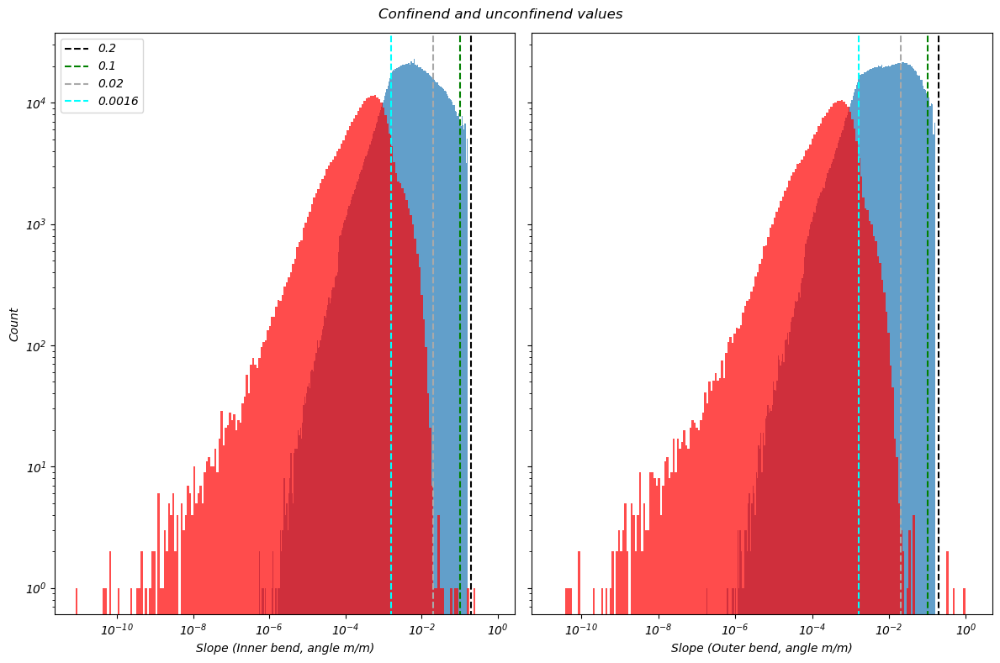

In [39]:
f, ax = plt.subplots(nrows = 1, ncols = 2, figsize  = [12,8], sharex = False, sharey= True,
                        squeeze = False)

##############
# innside bend
x = df.loc[~df['ER_inn'].isna(), 'slope_inn_angle']
if x.min() <= 0:
    x = x[x > 0]
bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=200)
ax[0,0].hist(x, bins=bin_edges, alpha=0.7)

x = df.loc[df['ER_inn'].isna(), 'slope_inn_angle']
if x.min() <= 0:
    x = x[x > 0]
bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=200)
ax[0,0].hist(x, bins=bin_edges, alpha=0.7, color = 'red')
ax[0,0].set_yscale('log')
ax[0,0].set_xscale('log')

##############
# Outside bend
x = df.loc[~df['ER_out'].isna(), 'slope_out_angle']
if x.min() <= 0:
    x = x[x > 0]
bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=200)
ax[0,1].hist(x, bins=bin_edges, alpha=0.7)

x = df.loc[df['ER_out'].isna(), 'slope_out_angle']
if x.min() <= 0:
    x = x[x > 0]

bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=200)
ax[0,1].hist(x, bins=bin_edges, alpha=0.7, color = 'red')
# ax[0,1].vlines(0.75,0, 10e5, linewidth = 1, linestyle = '--', color = 'black')
# ax[0,1].vlines(0.5 ,0, 10e5, linewidth = 1, linestyle = '--', color = 'black')
ax[0,1].set_yscale('log')
ax[0,1].set_xscale('log')

ax[0,0].set_xlabel('Slope (Inner bend, angle m/m)')
ax[0,1].set_xlabel('Slope (Outer bend, angle m/m)')
ax[0,0].set_ylabel('Count')

l1, color = 0.2,'black'
ax[0,0].vlines(l1, 0, 10e4, linestyle = '--', color = color, label = l1)
ax[0,1].vlines(l1, 0, 10e4, linestyle = '--', color = color)

l1, color = 0.1,'green'
ax[0,0].vlines(l1, 0, 10e4, linestyle = '--', color = color, label = l1)
ax[0,1].vlines(l1, 0, 10e4, linestyle = '--', color = color)

l1, color = 0.02,'darkgray'
ax[0,0].vlines(l1, 0, 10e4, linestyle = '--', color = color, label = l1)
ax[0,1].vlines(l1, 0, 10e4, linestyle = '--', color = color)

l1, color = 0.0016,'cyan'
ax[0,0].vlines(l1, 0, 10e4, linestyle = '--', color = color, label = l1)
ax[0,1].vlines(l1, 0, 10e4, linestyle = '--', color = color)
ax[0,0].legend()
f.suptitle('Confinend and unconfinend values')
plt.tight_layout()
plt.show()

In [ ]:
df['slope_out_T'] = df['slope_out'].copy()
df.loc[df['slope_out_T'] <0, 'slope_out_T'] = (df['slope_out_T']*-1) + 1

df['slope_inn_T'] = df['slope_inn'].copy()
df.loc[df['slope_inn_T'] < 0, 'slope_inn_T'] = (df['slope_inn_T']*-1) + 1

# check rows with to high negative value

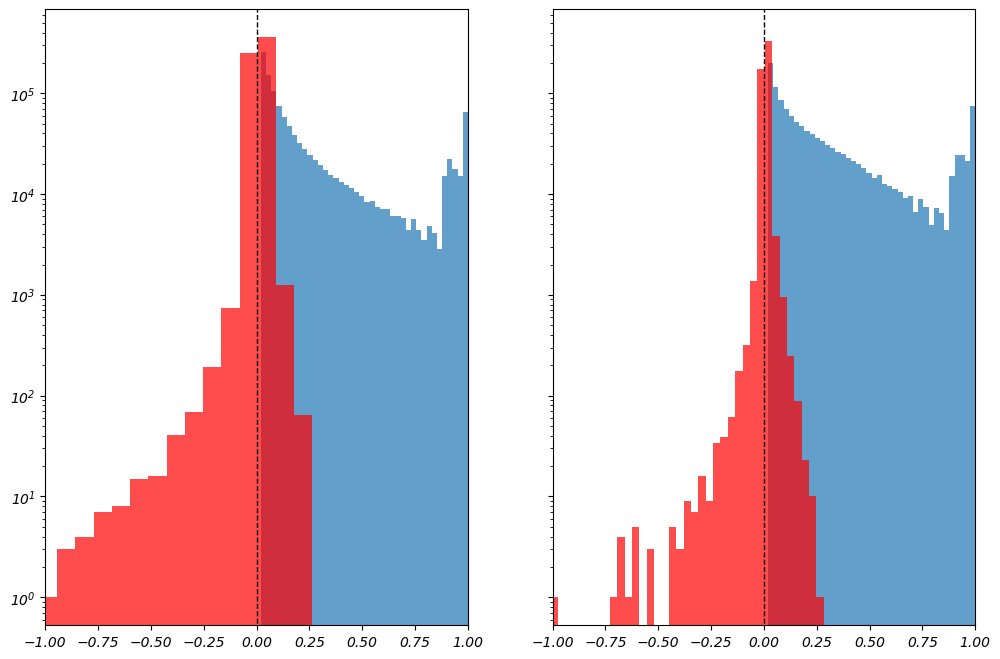

In [ ]:
f, ax = plt.subplots(nrows = 1, ncols = 2, figsize  = [12,8], sharex = True, sharey= True,
                        squeeze = False)
bins = 40
##############
# innside bend
x = df.loc[~df['ER_inn'].isna(), 'slope_inn']

ax[0,0].hist(x, bins=bins, alpha=0.7)

x = df.loc[df['ER_inn'].isna(), 'slope_inn']

ax[0,0].hist(x, bins=bins, alpha=0.7, color = 'red')
ax[0,0].set_yscale('log')

##############
# Outside bend
x = df.loc[~df['ER_out'].isna(), 'slope_out']

ax[0,1].hist(x, bins=bins, alpha=0.7)

x = df.loc[df['ER_out'].isna(), 'slope_out']

ax[0,1].hist(x, bins=bins, alpha=0.7, color = 'red')
ax[0,1].set_yscale('log')
ax[0,1].set_xlim(-1,1)
ax[0,0].vlines(0,0, 10e5, linewidth = 1, linestyle = '--', color = 'black')
ax[0,1].vlines(0,0, 10e5, linewidth = 1, linestyle = '--', color = 'black')
plt.show()

In [ ]:
import seaborn as sns

# Define conditions
conditions = [
    (~df['ER_out'].isna()) & (~df['ER_inn'].isna()),  # High
    (df['ER_out'].isna()) & (df['ER_inn'].isna()),
    (df['ER_out'].isna()) | (df['ER_inn'].isna())  # Medium
      # Low
]

# Define corresponding values
choices = ['Both', 'Single', 'No']

# Apply CASE WHEN logic
df['Confinement'] = np.select(conditions, choices, default='Unknown')


# Transform data while keeping sign
col  = 'slope_diff_bendSide'
data = df[[col, 'Confinement']].copy()

data['log'] = np.sign(data[col]) * np.log10(np.abs(data[col]))

# Plot histogram


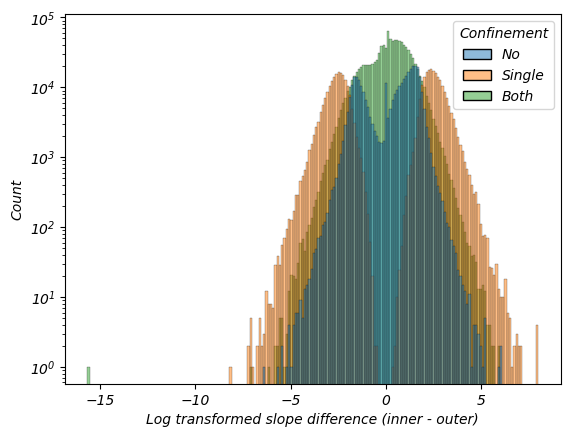

In [ ]:
sns.histplot(data = data, x = 'log', hue = 'Confinement', bins=200, kde=False)
plt.xlabel("Log transformed slope difference (inner - outer)")
plt.ylabel("Count")
plt.title("")
plt.yscale('log')
plt.show()


## EGU

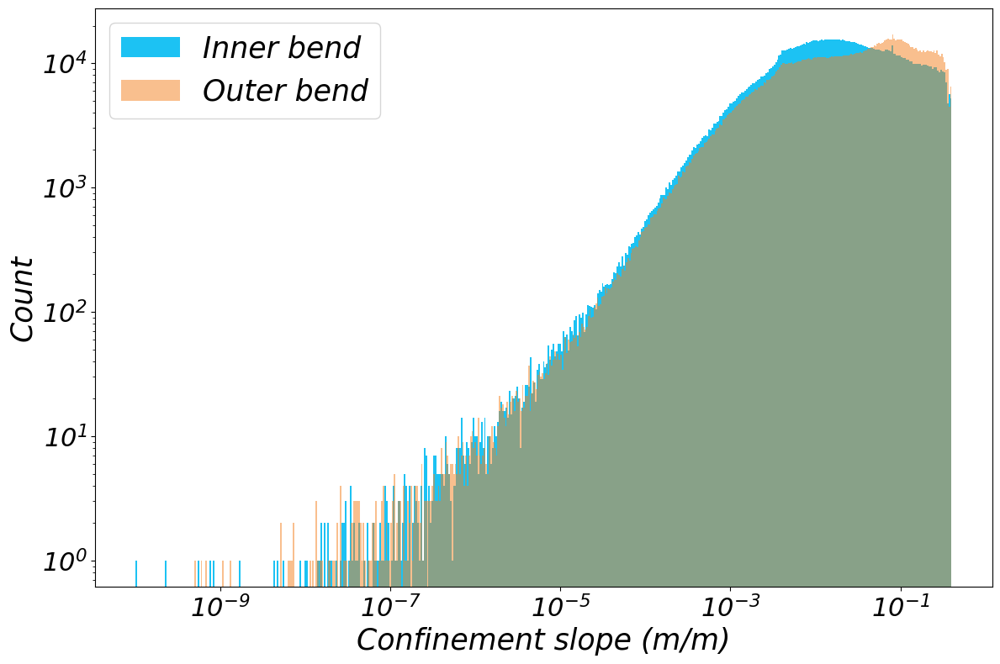

In [55]:
f, ax = plt.subplots(nrows = 1, ncols = 1, figsize  = [12,8], sharex = False, sharey= True,
                        squeeze = False)
bins = 500
##############
# innside bend
norm = ''
x = df[f'slope_inn{norm}']
if x.min() <= 0:
    x = x[x > 0]
bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=bins)
ax[0,0].hist(x, bins=bin_edges, alpha=1, color = '#1CC2F3', label = 'Inner bend')

x = df[f'slope_out{norm}']
if x.min() <= 0:
    x = x[x > 0]
bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=bins)
ax[0,0].hist(x, bins=bin_edges, alpha=0.5, color = '#F5811E', label = 'Outer bend')

ax[0,0].set_yscale('log')
ax[0,0].set_xscale('log')


ax[0,0].set_xlabel('Confinement slope (m/m)', fontsize = labelTextSize)
ax[0,0].set_ylabel('Count', fontsize = labelTextSize)
ax[0,0].tick_params(axis='both', labelsize=tickSize)
ax[0,0].legend(fontsize = labelTextSize)

plt.tight_layout()
plt.show()

In [53]:
labelTextSize = 25
tickSize = 22

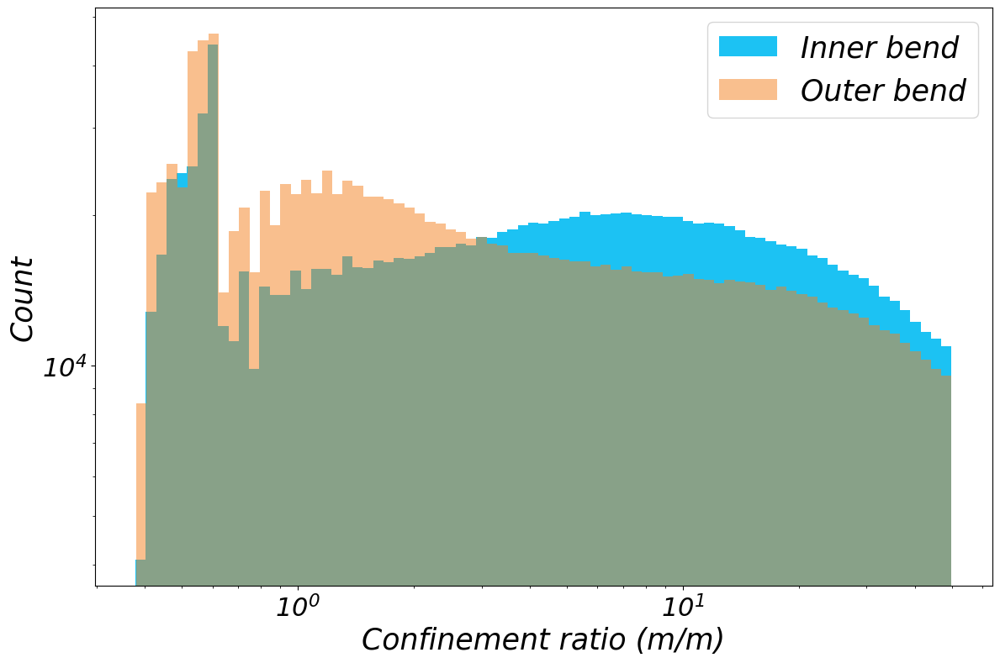

In [54]:
f, ax = plt.subplots(nrows = 1, ncols = 1, figsize  = [12,8], sharex = False, sharey= True,
                        squeeze = False)
bins = 80
##############
# innside bend
norm = '_angle'
x = df[f'ER_inn']
if x.min() <= 0:
    x = x[x > 0]
bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=bins)
ax[0,0].hist(x, bins=bin_edges, alpha=1, color = '#1CC2F3', label = 'Inner bend')

x = df[f'ER_out']
if x.min() <= 0:
    x = x[x > 0]
bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=bins)
ax[0,0].hist(x, bins=bin_edges, alpha=0.5, color = '#F5811E', label = 'Outer bend')

ax[0,0].set_yscale('log')
ax[0,0].set_xscale('log')


ax[0,0].set_xlabel('Confinement ratio (m/m)', fontsize = labelTextSize)
ax[0,0].tick_params(axis='both', labelsize=tickSize)

ax[0,0].set_ylabel('Count', fontsize = labelTextSize)
ax[0,0].legend(fontsize = labelTextSize)

plt.tight_layout()
plt.show()

In [34]:
df[~df['ER_out'].isna()]['slope_out'].min(), df[df['ER_inn'].isna()]['slope_inn'].max()

(0.0003044303984806301, 0.06315100575681158)

bendWidth
OUT


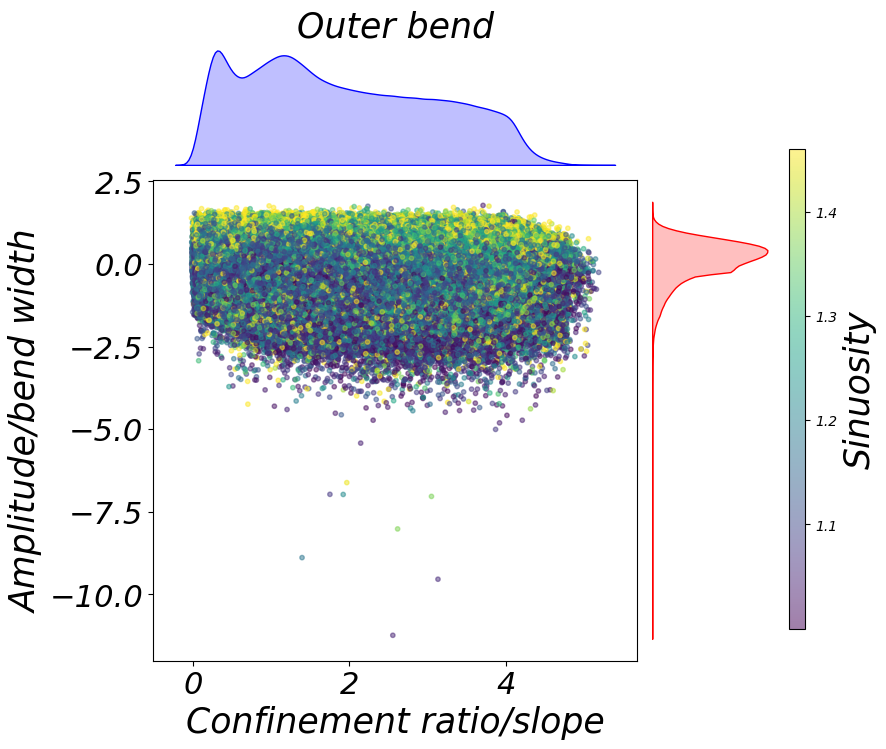

inn


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import gridspec

def scatter_density(df, colx, coly, colh, labx, laby, labh, title):

    dfT = df[[colx, coly, colh]].copy(deep = True)
    dfT = dfT[(~dfT[colx].isna()) & (dfT[coly] > 0)]
    dfT[f'log_{colx}'] = np.log10(dfT[colx])
    dfT[f'log_{coly}'] = np.log10(dfT[coly])
    # Example continuous variable for hue (e.g., size)

    dfT.loc[dfT[colh] > dfT[colh].quantile(0.9), colh] = dfT[colh].quantile(0.9)

    # Set up grid layout like jointplot
    fig = plt.figure(figsize=(8, 8))
    gs = gridspec.GridSpec(2, 2, width_ratios=[4, 1], height_ratios=[1, 4],
                        wspace=0.05, hspace=0.05)

    # Main scatter plot
    ax_main = fig.add_subplot(gs[1, 0])
    scatter = ax_main.scatter(
        dfT[f'log_{colx}'],
        dfT[f'log_{coly}'],
        c=dfT[colh],
        cmap="viridis",
        alpha=0.5, s = 10
    )
    ax_main.set_xlabel(labx, fontsize = labelTextSize)
    ax_main.set_ylabel(laby, fontsize = labelTextSize)
    ax_main.tick_params(axis='both', labelsize=tickSize)

    # Marginal KDE (X)
    ax_kde_x = fig.add_subplot(gs[0, 0], sharex=ax_main)
    sns.kdeplot(x=dfT[f'log_{colx}'], ax=ax_kde_x, fill=True, color='blue')
    ax_kde_x.axis("off")
    ax_kde_x.set_title(title, fontsize = labelTextSize)
    
    # Marginal KDE (Y)
    ax_kde_y = fig.add_subplot(gs[1, 1], sharey=ax_main)
    sns.kdeplot(y=dfT[f'log_{coly}'], ax=ax_kde_y, fill=True, color='red')
    ax_kde_y.axis("off")
    
    # Colorbar
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.6])
    cbar = fig.colorbar(scatter, cax=cbar_ax)
    cbar.set_label(labh, fontsize = labelTextSize)
    

    plt.tight_layout()
    plt.show()
print('bendWidth')
# scatter_density(df, "ER_out", 'slope_out', 'bendWidths','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Bend width (m)', 'Outside bend')
# scatter_density(df, "ER_inn", 'slope_inn', 'bendWidths','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Bend width (m)', 'Inside bend')
# scatter_density(df, "ER_out", 'slope_out', 'bendWidths','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Bend width (m)', 'Outside bend')
# scatter_density(df, "ER_inn", 'slope_inn', 'bendWidths','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Bend width (m)', 'Inside bend')

df['TOut'] = df['ER_out'] / df['slope_out']
df['TInn'] = df['ER_inn'] / df['slope_inn']
print('OUT')
# scatter_density(df, "TOut", 'bendHeight', 'sin'       ,'Confinement ratio/slope', 'Bend height (m)' , 'Sinuosity', 'Outer bend')
# scatter_density(df, "TOut", 'bendLen'   , 'sin'       ,'Confinement ratio/slope', 'Bend length (m)' , 'Sinuosity', 'Outer bend')
# scatter_density(df, "TOut", 'sin'       , 'bendWidths','Confinement ratio/slope', 'Sinuosity'       , 'Bend widthth (m)', 'Outer bend')


scatter_density(df, "TOut", 'nonDimAmp'       , 'sin','Confinement ratio/slope', 'Amplitude/bend width', 'Sinuosity', 'Outer bend')
# scatter_density(df, "TOut", 'bendWidths'      , 'sin','Confinement ratio/slope', 'Bend width (m)', 'Sinuosity', 'Outer bend')
# scatter_density(df, "TOut", 'bend_catch_pos'  , 'sin','Confinement ratio/slope', 'Relative catchment Position', 'Sinuosity', 'Outer bend')

print('inn')
# scatter_density(df, "TInn", 'bendHeight', 'sin'       ,'Confinement ratio/slope', 'Bend height (m)', 'Sinuosity', 'Outer bend')
# scatter_density(df, "TInn", 'bendLen'   , 'sin'       ,'Confinement ratio/slope', 'Bend length (m)', 'Sinuosity', 'Outer bend')
# scatter_density(df, "TInn", 'sin'       , 'bendWidths','Confinement ratio/slope', 'Sinuosity', 'Bend widthth (m)', 'Outer bend')


# scatter_density(df, "TInn", 'ang'           , 'sin','Confinement ratio/slope', 'Curvature', 'Sinuosity', 'Outer bend')
scatter_density(df, "TInn", 'nonDimAmp'             , 'sin','Confinement ratio/slope', 'Amplitude/bend width', 'Sinuosity', 'Inner bend')
# scatter_density(df, "TInn", 'bendWidths'    , 'sin','Confinement ratio/slope', 'Bend width (m)', 'Sinuosity', 'Inner bend')
# scatter_density(df, "TInn", 'bend_catch_pos', 'sin','Confinement ratio/slope', 'Relative catchment Position', 'Sinuosity', 'Outer bend')




# scatter_density(df, "ER_out", 'slope_out', 'nonDimAmp','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Amplitde / Bendwdith', 'Outer bend')
# scatter_density(df, "ER_inn", 'slope_inn', 'nonDimAmp','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Amplitde / Bendwdith', 'Inside bend')

# scatter_density(df, "ER_out", 'slope_out', 'cp_height','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Bend height (m)', 'Outer bend')
# scatter_density(df, "ER_inn", 'slope_inn', 'cp_height','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Bend height (m)', 'Inside bend')

# scatter_density(df, "ER_out", 'slope_out', 'sin','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Sinuosity', 'Outer bend')
# scatter_density(df, "ER_inn", 'slope_inn', 'sin','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Sinuosity', 'Inside bend')

# scatter_density(df, "ER_out", 'slope_out', 'bend_catch_pos','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Relative catchment position', 'Outer bend')
# scatter_density(df, "ER_inn", 'slope_inn', 'bend_catch_pos','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Relative catchment position', 'Inside bend')

In [93]:
df.columns

Index(['index', 'ER_inn', 'ER_out', 'slope_inn', 'slope_out', 'ER_left',
       'ER_right', 'slope_left', 'slope_right', 'apex', 'catchment_position',
       'bendWidths', 'bendMaxWidths', 'cp_height', 'bendDistOut',
       'max_dist_out', 'bendHeight', 'sin', 'ang', 'conFactor',
       'combined_reach_id', 'combined_reach_len', 'reach_id', 'file',
       'bendLen', 'up_reach_id', 'T', 'ER_max', 'slope_max',
       'slope_diff_bendSide', 'slope_diff_bendSide_abs', 'slope_diff_side',
       'ER_diff_bendSide', 'ER_diff_bendSide_abs', 'ER_diff_side', 'nonDimAmp',
       'catch_height', 'bend_catch_pos'],
      dtype='object')

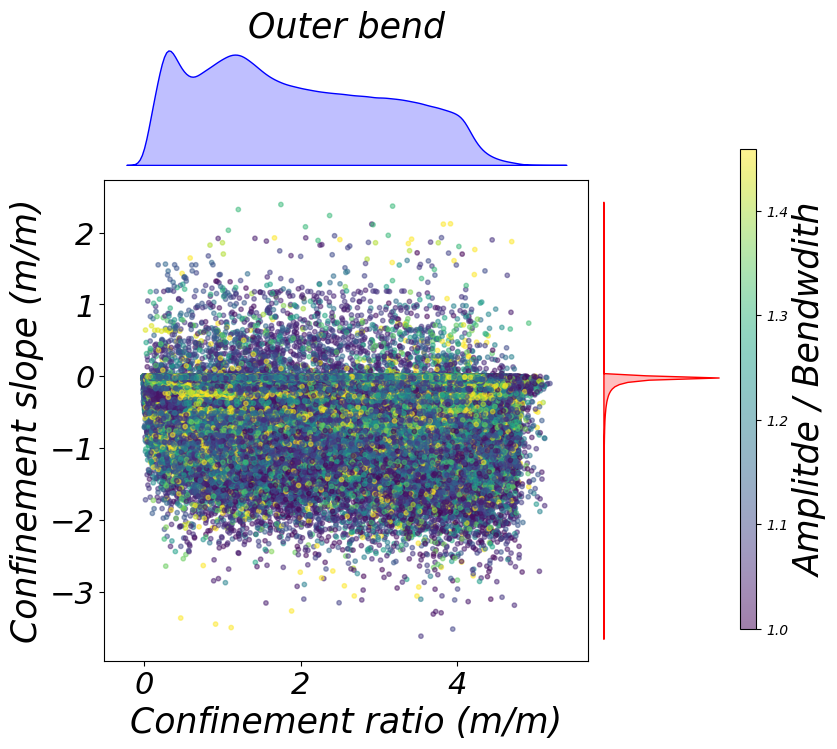

In [94]:
scatter_density(df, "T", 'bend_catch_pos', 'sin','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Amplitde / Bendwdith', 'Outer bend')


In [73]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import gridspec

cols = ['T', 'nonDimAmp', 'nonDimAmp']
dfT = df[cols].copy(deep = True)
# dfT = dfT[(~dfT[cols[0]].isna()) & (dfT[cols[1]] > 0)]
dfT = dfT[(~dfT[cols[0]].isna()) ]
dfT[f'log_{cols[1]}'] = np.log10(dfT[cols[1]])
dfT[f'log_{cols[0]}'] = np.log10(dfT[cols[0]])
# Example continuous variable for hue (e.g., size)
hue_var = cols[2]
dfT.loc[dfT[hue_var] > dfT[hue_var].quantile(0.9), hue_var] = dfT[hue_var].quantile(0.9)

# Set up grid layout like jointplot
fig = plt.figure(figsize=(8, 8))
gs = gridspec.GridSpec(2, 2, width_ratios=[4, 1], height_ratios=[1, 4],
                       wspace=0.05, hspace=0.05)

# Main scatter plot
ax_main = fig.add_subplot(gs[1, 0])
scatter = ax_main.scatter(
    dfT[f'log_{cols[1]}'],
    dfT[f'log_{cols[0]}'],
    c=dfT[hue_var],
    cmap="viridis",
    alpha=0.5, s = 10
)
ax_main.set_xlabel("Confinement slope (m/m)")
ax_main.set_ylabel("Confinement ratio (m/m)")


# Marginal KDE (X)
ax_kde_x = fig.add_subplot(gs[0, 0], sharex=ax_main)
sns.kdeplot(x=dfT[f'log_{cols[1]}'], ax=ax_kde_x, fill=True, color='blue')
ax_kde_x.axis("off")

# Marginal KDE (Y)
ax_kde_y = fig.add_subplot(gs[1, 1], sharey=ax_main)
sns.kdeplot(y=dfT[f'log_{cols[0]}'], ax=ax_kde_y, fill=True, color='red')
ax_kde_y.axis("off")

# Colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.6])
cbar = fig.colorbar(scatter, cax=cbar_ax)
cbar.set_label(hue_var)

plt.tight_layout()
plt.show()


ValueError: Cannot set a DataFrame with multiple columns to the single column log_nonDimAmp

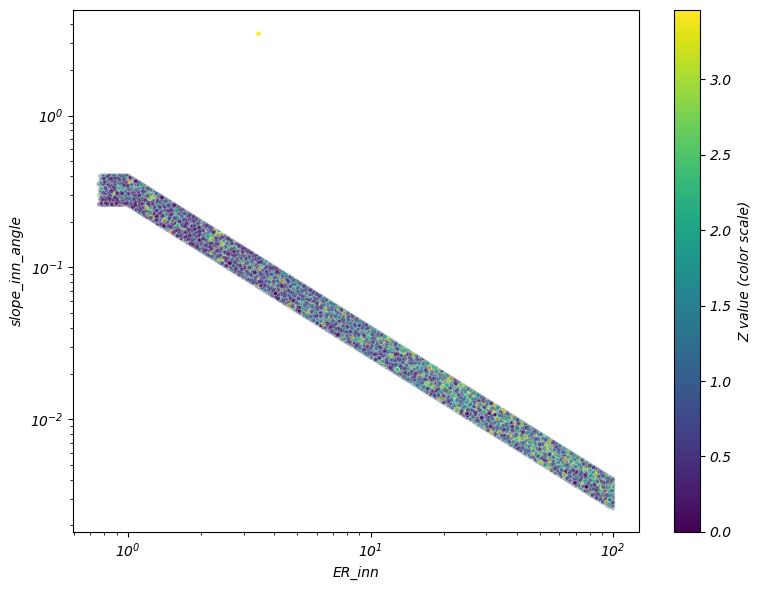

In [51]:
fig, ax = plt.subplots(figsize=(8, 6))
z = 'nonDimAmp'
df[f'{z}_scale'] = df[z].copy()
df[df[f'{z}_scale'] > df[f'{z}_scale'].quantile(0.8)] = df[f'{z}_scale'].quantile(0.80)

# Normalize color scale
norm = plt.Normalize(df[f'{z}_scale'].min(), df[f'{z}_scale'].max())
sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])  # required dummy array

scatter = sns.scatterplot(df, x = 'ER_inn', y = 'slope_inn_angle', hue = 'nonDimAmp', legend = False, palette = 'viridis', ax = ax, alpha = 0.5, s = 10)
# plt.xlabel('Confinement ratio', fontsize = labelTextSize)
# plt.ylabel('Confinement slope', fontsize = labelTextSize)
# plt.title('Outer bend', fontsize = labelTextSize)
# plt.xticks(fontsize=tickSize)
# plt.yticks(fontsize=tickSize)

# Add colorbar (and now it knows which axis to attach to)
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label("Z value (color scale)")

# Add colorbar


plt.xscale('log')
plt.yscale('log')
plt.tight_layout()
plt.show()

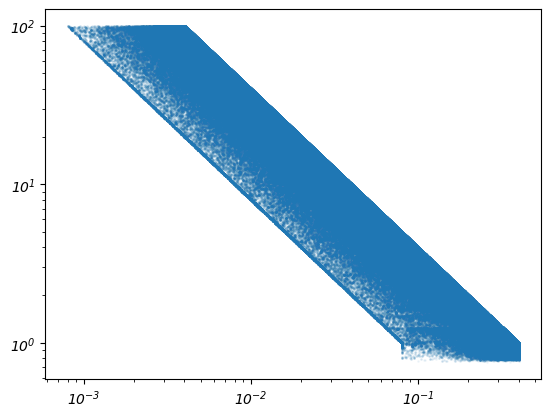

In [28]:
plt.scatter(df['slope_inn_angle'], df['ER_inn'], s = 1, alpha =0.05)
plt.xscale('log')
plt.yscale('log')

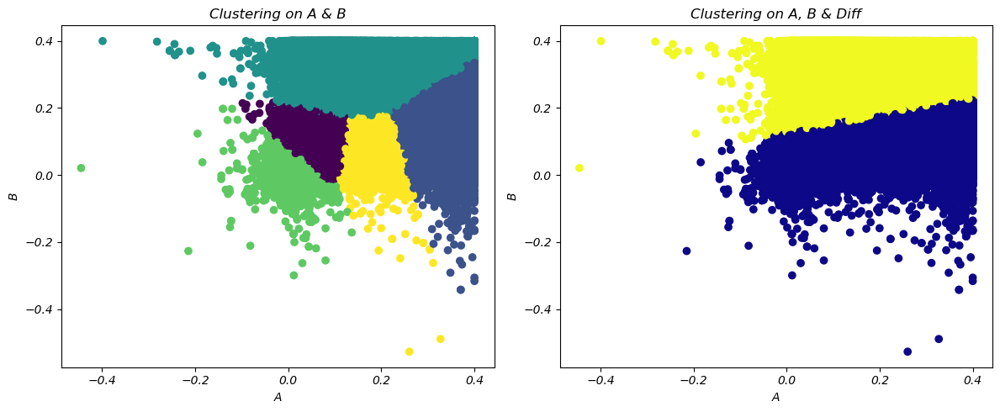

In [92]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Create a simple dataset
A = df.copy()
A = A[(~A['slope_out_angle'].isna()) & (~A['slope_inn_angle'].isna())]

# Option 1: Clustering using only A and B
kmeans_ab = KMeans(n_clusters=5, random_state=0)
A['cluster_AB'] = kmeans_ab.fit_predict(A[['slope_out_angle', 'slope_inn_angle']])

# Option 2: Clustering using A, B, and Diff
kmeans_abd = KMeans(n_clusters=2, random_state=0)
A['cluster_ABD'] = kmeans_abd.fit_predict(A[['slope_out_angle', 'slope_inn_angle', 'slope_diff_bendSide_angle']])

# Plot the results
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Clustering with A and B
axs[0].scatter(A['slope_out_angle'], A['slope_inn_angle'], c=A['cluster_AB'], cmap='viridis')
axs[0].set_title('Clustering on A & B')
axs[0].set_xlabel('A')
axs[0].set_ylabel('B')

# Clustering with A, B, and Diff
axs[1].scatter(A['slope_out_angle'], A['slope_inn_angle'], c=A['cluster_ABD'], cmap='plasma')
axs[1].set_title('Clustering on A, B & Diff')
axs[1].set_xlabel('A')
axs[1].set_ylabel('B')

plt.tight_layout()
plt.show()


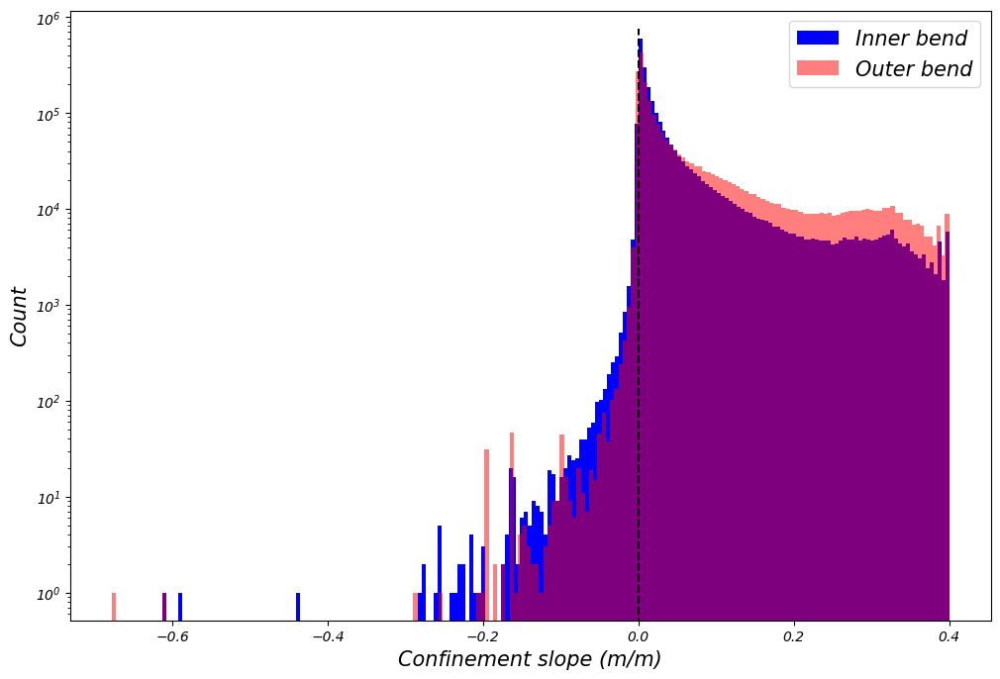

In [176]:
f, ax = plt.subplots(nrows = 1, ncols = 1, figsize  = [12,8], sharex = True, sharey= True,
                        squeeze = False)
bins = 200
##############
# Outside bend
ax[0,0].hist(df['slope_inn_angle'], bins=bins, alpha=1, color = 'blue', label = 'Inner bend')
ax[0,0].hist(df['slope_out_angle'], bins=bins, alpha=0.5, color = 'red' , label = 'Outer bend')



ax[0,0].set_yscale('log')

ax[0,0].vlines(0,0, 15**5, linestyle = '--', color = 'black')
ax[0,0].set_xlabel('Confinement slope (m/m)', fontsize = labelTextSize)
ax[0,0].set_ylabel('Count', fontsize = labelTextSize)
plt.legend(fontsize = labelTextSize)
plt.show()

In [29]:
df[(df['slope_out'] < 0) & (df['slope_inn'] < 0)].shape[0] / df.shape[0], df[(df['slope_out'] < 0) & (df['slope_inn'] < 0)].shape[0]

(0.013770683243993134, 31367)

In [30]:
# df[(df['slope_out'] > 0.22) & (df['slope_inn'] > 0.22)].shape[0], df[(df['slope_out'] > 0.22) & (df['slope_inn'] > 0.22)].shape[0] / df.shape[0]

A = df[(df['slope_out_angle'] > 0.22) & (df['slope_inn_angle'] > 0.22)]

B = df[(df['ER_out'] < 2) & (df['ER_inn'] < 2)]
A['ER_out'].max(), A['ER_inn'].max(), B['slope_out_angle'].min(), B['slope_inn_angle'].min()
# df[(df['ER_out'] < 3.5) & (df['ER_inn'] < 2.5)].shape[0]

(1.8180529300654482,
 1.8181247759068642,
 0.04009871556579772,
 0.04003785450968866)

In [45]:
df[df['slope_out_angle'] == 0.04000954347997491]

,index,ER_inn,ER_out,slope_inn,slope_out,ER_left,ER_right,slope_left,slope_right,apex,...,slope_diff_bendSide_abs,slope_diff_side,ER_diff_bendSide,ER_diff_bendSide_abs,ER_diff_side,slope_out_angle,slope_inn_angle,slope_left_angle,slope_right_angle,nonDimAmp
1601369,13284,1.71994,1.999523,0.581416,0.500119,1.999523,1.71994,0.500119,0.581416,1381.842506,...,0.081296,-0.081296,-0.279583,0.279583,0.279583,0.04001,0.046513,0.04001,0.046513,0.979261
1601393,13308,1.71994,1.999523,0.581416,0.500119,1.999523,1.71994,0.500119,0.581416,1381.842506,...,0.081296,-0.081296,-0.279583,0.279583,0.279583,0.04001,0.046513,0.04001,0.046513,0.979261
1601395,13310,1.71994,1.999523,0.581416,0.500119,1.999523,1.71994,0.500119,0.581416,1381.842506,...,0.081296,-0.081296,-0.279583,0.279583,0.279583,0.04001,0.046513,0.04001,0.046513,0.979261


## Scatter plots

### function

In [87]:
def scatter_plot(df,nrows, ncols, colX, colY, xlab, ylab,titles, sharex=True, sharey=False, alpha = 0.05):
    f, ax = plt.subplots(nrows = nrows, ncols = ncols, figsize = [12,8], sharex = sharex, sharey=sharey, squeeze = False)

    count = 0
    for r in range(nrows):
        for c in range(ncols):
            
            ax[r,c].scatter(df[colX[r]], df[colY[c]], s = 1, alpha = alpha)
            ax[r,c].set_xscale('log')
            ax[r,c].set_yscale('log')
            ax[r,c].set_title(titles[count], fontsize = labelTextSize) 
            if c == 0:
                ax[r,c].set_ylabel(ylab[c], fontsize = labelTextSize)
            if r == (nrows-1):
                ax[r,c].set_xlabel(xlab[c], fontsize = labelTextSize)
            count+=1
    plt.tight_layout()
    plt.show()




### apex/bendWidth vs ER & slope

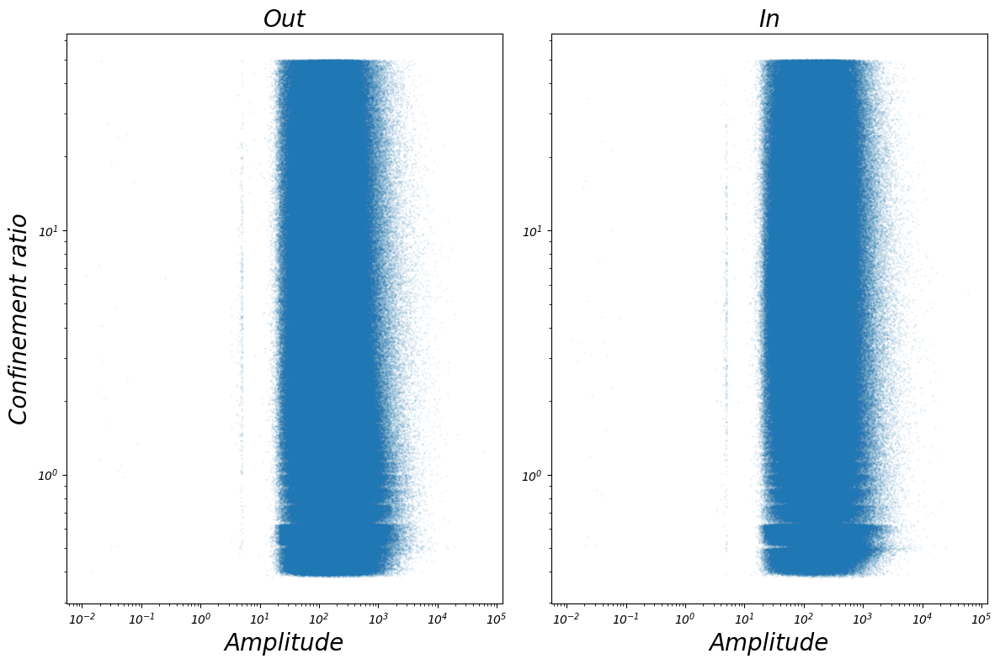

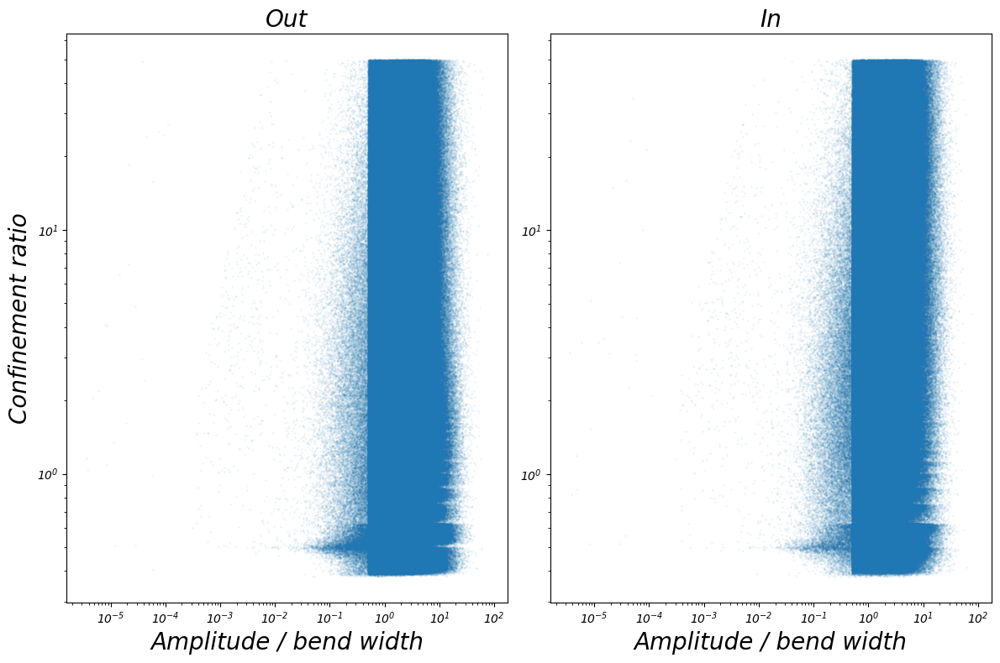

In [98]:
scatter_plot(df,1, 2, ['apex'], ['ER_out', 'ER_inn'], 
             ['Amplitude', 'Amplitude'], ['Confinement ratio'],['Out', 'In'], 
             sharex=True, sharey=False, alpha = 0.05)

scatter_plot(df,1, 2, ['nonDimAmp'], ['ER_out', 'ER_inn'], 
             ['Amplitude / bend width', 'Amplitude / bend width'], ['Confinement ratio'],['Out', 'In', '', ''], 
             sharex=True, sharey=False, alpha = 0.05)

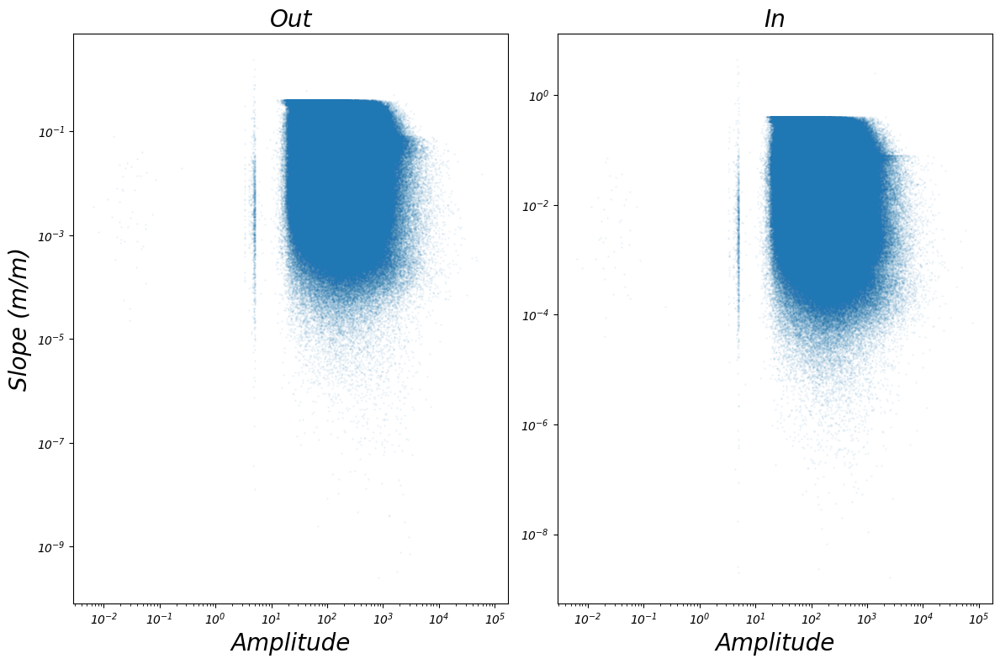

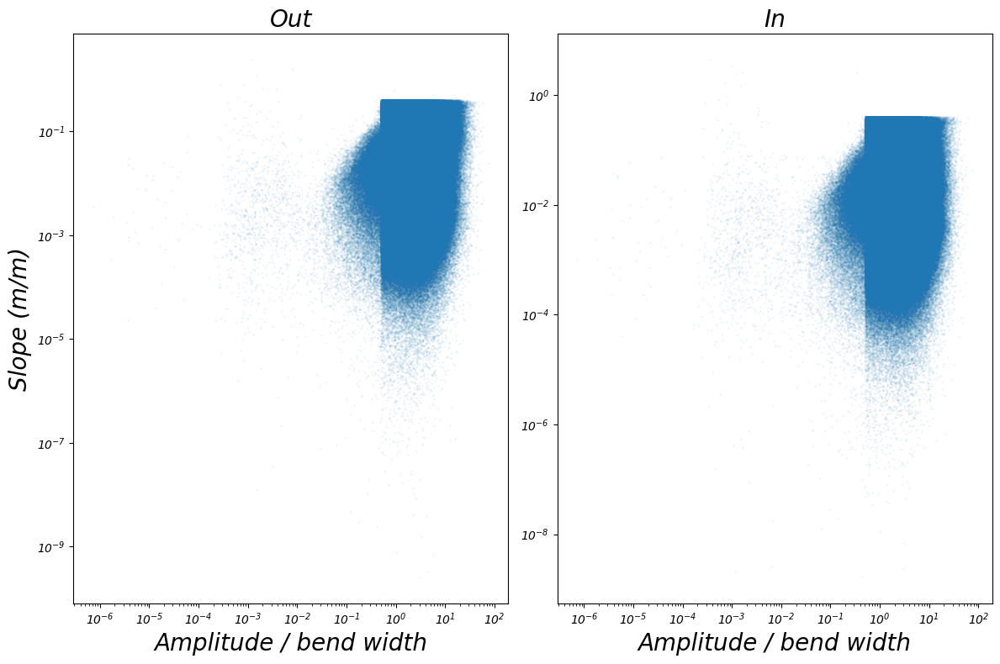

In [99]:
scatter_plot(df,1, 2, ['apex'], ['slope_out', 'slope_inn'], 
             ['Amplitude', 'Amplitude'], ['Slope (m/m)'],['Out', 'In'], 
             sharex=True, sharey=False, alpha = 0.05)

scatter_plot(df,1, 2, ['nonDimAmp'], ['slope_out', 'slope_inn'], 
             ['Amplitude / bend width', 'Amplitude / bend width'], ['Slope (m/m)'],['Out', 'In', '', ''], 
             sharex=True, sharey=False, alpha = 0.05)

### Elevation vs ER & Slope

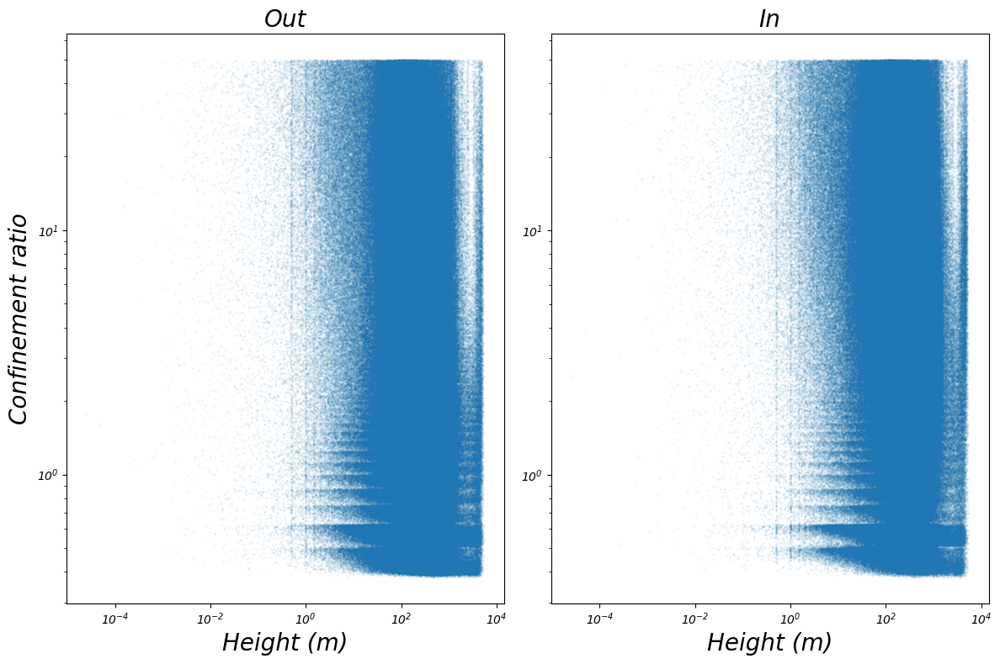

In [101]:
scatter_plot(df,1, 2, ['bendHeight'], ['ER_out', 'ER_inn'], 
             ['Height (m)', 'Height (m)'], ['Confinement ratio'],['Out', 'In'], 
             sharex=True, sharey=False, alpha = 0.05)

In [149]:
df[df['reach_id'] == 23267000591].networkGraph

1367531    112
1367532    112
1367533    112
1367534    112
1367535    112
1367536    112
Name: networkGraph, dtype: int64

In [150]:
A = df[df['file'] == 'eu']
A.groupby('networkGraph')['ER_out'].count()
A = A[A['networkGraph'] == 112]

In [151]:
A.loc[(A['ER_out'] < 3) & (A['bendHeight'] < 100), 'reach_id'].unique()

array([23240601211, 23240601161, 23240601151, 23240600151, 23240600131,
       23240600111, 23240600091, 23240600071, 23240600051, 23240600031,
       23240500091, 23240500061, 23240500021, 23240500011, 23240300131,
       23240300111, 23240300081, 23240300051, 23240300031, 23240100101,
       23240100081, 23240100071, 23240100061, 23240100041, 23240100021,
       23230900013, 23240400661, 23240400651, 23240400641, 23240400621,
       23240400521, 23240400491, 23240400481, 23240400461, 23240400401,
       23240400331, 23240400311, 23240400271, 23240400231, 23240400211,
       23240400101, 23240400081, 23240400061, 23240400041, 23240400011,
       23240600674, 23240600621, 23240600571, 23240600491, 23240600431,
       23240600411, 23240600401, 23240600381, 23240600341, 23240600321,
       23240600281, 23240600241, 23240601261, 23240700501, 23240700471,
       23240700401, 23240700381, 23240700361, 23240700321, 23240700281,
       23240700261, 23240700241, 23240700221, 23240700201, 23240

In [148]:
df.loc[df['reach_id'] == 45100800105, 'ER_out']

678498          NaN
678499     0.575375
678500          NaN
678501     0.729974
678502          NaN
678503     2.260228
678504          NaN
678505    25.713964
678506    47.503475
678507    33.932390
678508    10.135796
678509          NaN
678510          NaN
678511    23.982943
678512    36.616172
Name: ER_out, dtype: float64

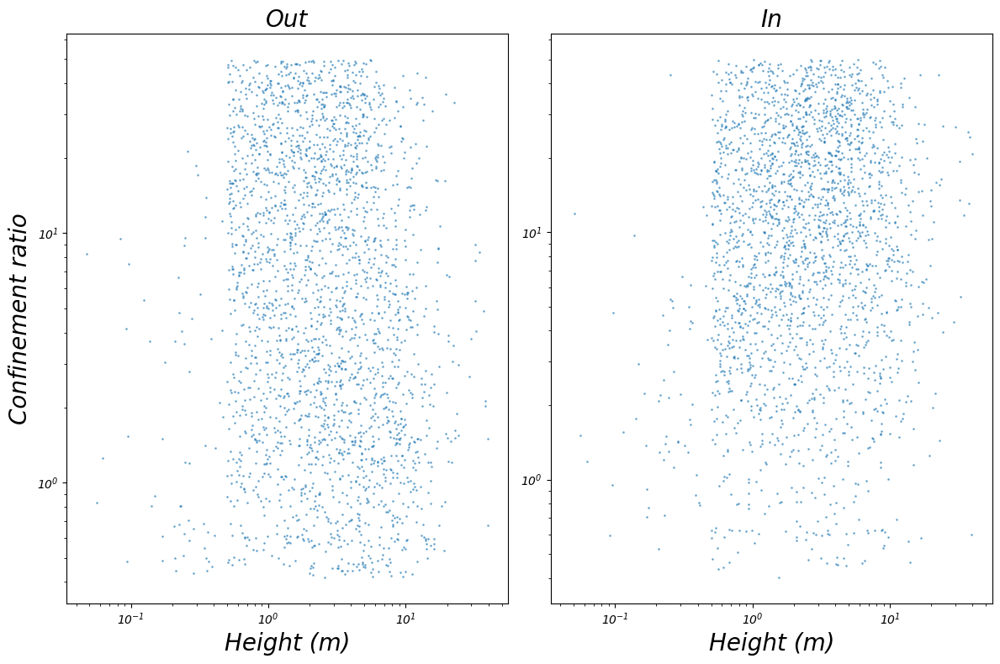

In [153]:
scatter_plot(A,1, 2, ['nonDimAmp'], ['ER_out', 'ER_inn'], 
             ['Height (m)', 'Height (m)'], ['Confinement ratio'],['Out', 'In'], 
             sharex=True, sharey=False, alpha = 0.5)


### catchment position vs conf Ratio

NameError: name 'catchmentPosition' is not defined

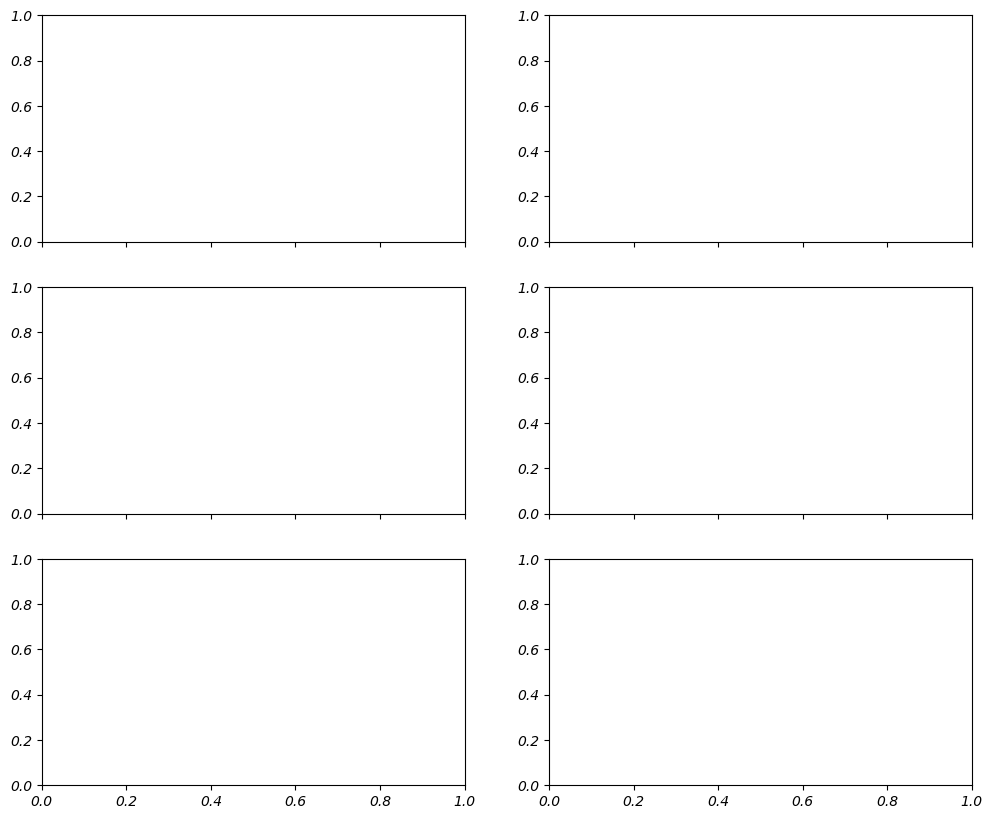

In [102]:
def scatter_plots(ax, xvar, yvar,title,xbool, xlabel, ybool, ylabel, alpha, s):
    ax.scatter(xvar, yvar, s = s, alpha = alpha)
    ax.set_title(title)
    if xbool == True:
        ax.set_xlabel(xlabel)
    if ybool == True:
        ax.set_ylabel(ylabel)
    
    ax.set_xscale('log')
    ax.set_yscale('log')

f, [ax1, ax2, ax3] = plt.subplots(nrows = 3, ncols = 2, figsize = [12,10], 
                                  sharex = True, sharey=False)
scatter_plots(ax1[0], catchmentPosition, EROut    , 'Outside bend', False, '', True , 'Confinement Ratio', scatterAlpha, scatterSize)
scatter_plots(ax1[1], catchmentPosition, slopeOut , 'Outside bend', False, '', True, 'Confinement Slope', scatterAlpha, scatterSize)
scatter_plots(ax2[0], catchmentPosition, ERInn    , 'inside bend' , False, '', True , 'Confinement Ratio', scatterAlpha, scatterSize)
scatter_plots(ax2[1], catchmentPosition, slopeInn , 'inside bend' , False, '', True, 'Confinement Slope', scatterAlpha, scatterSize)
scatter_plots(ax3[0], catchmentPosition, ERMax    , 'Max'         , True, 'Relative Catchment Position', True , 'Confinement Ratio', scatterAlpha, scatterSize)
scatter_plots(ax3[1], catchmentPosition, slopeMax , 'Max'         , True, 'Relative Catchment Position', True, 'Confinement Slope', scatterAlpha, scatterSize)
plt.show()

## Scatter with quantiles

In [ ]:
def plot_apex_quant(df, colNameX, colNameY, quant, ax):
    ax.scatter(df[colNameX], df[colNameY], s = 0.1, c = 'blue', alpha = 0.05)
    for col in quant.columns:
        ax.plot(quant.index, quant[col], label = col)
    ax.legend()
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlabel(colNameX)
    ax.set_ylabel(colNameY)

def bin_quantiles(df, binAxis, quantList, binSteps):
    binCenter = [(binSteps[i] + binSteps[i+1])/2 for i in range(len(binSteps) -1)]
    df['bin'] = pd.cut(df[binAxis], bins = binSteps, labels = binCenter)
    quants = []
    for q in quantList:
        quants.append(df.groupby('bin', as_index = True)[q].quantile([0.1, 0.25, 0.5, 0.75, 0.95]).unstack())
    return quants

### catchment position vs slope

In [ ]:
binSteps = list(np.arange(0,1, 0.1)) +\
            [1,1.5,2]


qOut, qInn, qMax,  qDiff = bin_quantiles(df, 'catchment_position', ['slope_out_angle', 'slope_inn_angle', 'slope_max_angle', 'slope_diff_bendSide_angle'], binSteps)


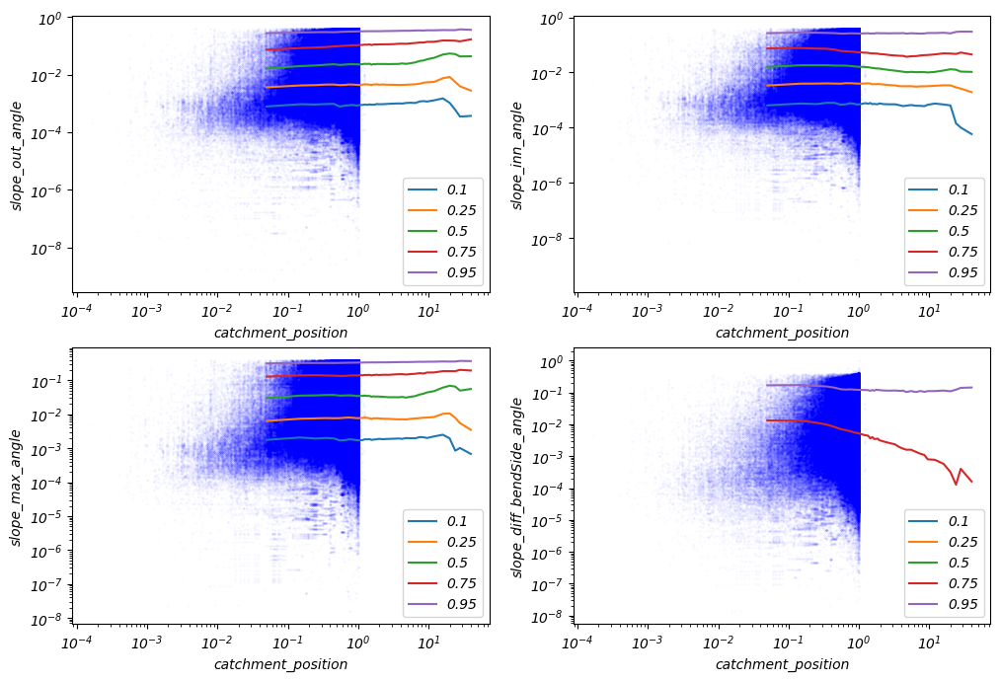

In [217]:
f, ax = plt.subplots(nrows = 2, ncols = 2, figsize = [12, 8], sharex = False, sharey = False)
plot_apex_quant(df, 'catchment_position', 'slope_out_angle' , qOut, ax[0,0])
plot_apex_quant(df, 'catchment_position', 'slope_inn_angle' , qInn, ax[0,1])
plot_apex_quant(df, 'catchment_position', 'slope_max_angle' , qMax, ax[1,0])
plot_apex_quant(df, 'catchment_position', 'slope_diff_bendSide_angle', qDiff, ax[1,1])
plt.show()

# qOut, qInn, qMax,  qDiff = bin_quantiles('catchmentPosition', ['EROut', 'ERInn', 'ERMax', 'ERDiff'], binSteps)

# f, ax = plt.subplots(nrows = 2, ncols = 2, figsize = [12, 8], sharex = False, sharey = False)
# plot_apex_quant('catchmentPosition', 'EROut' , qOut, ax[0,0])
# plot_apex_quant('catchmentPosition', 'ERInn' , qInn, ax[0,1])
# plot_apex_quant('catchmentPosition', 'ERMax' , qMax, ax[1,0])
# plot_apex_quant('catchmentPosition', 'ERDiff', qDiff, ax[1,1])
# plt.show()



### Apex vs Slope

In [80]:
binSteps = list(np.arange(1,1000, 50)) +\
            list(np.arange(1000, 2000, 100)) +\
            list(np.arange(2000, 5000, 500)) +\
            [5000, 10000, 20000]

qOut, qInn, qMax,  qDiff = bin_quantiles('apex', ['slopeOut', 'slopeInn', 'slopeMax', 'slopeDiff'], binSteps)


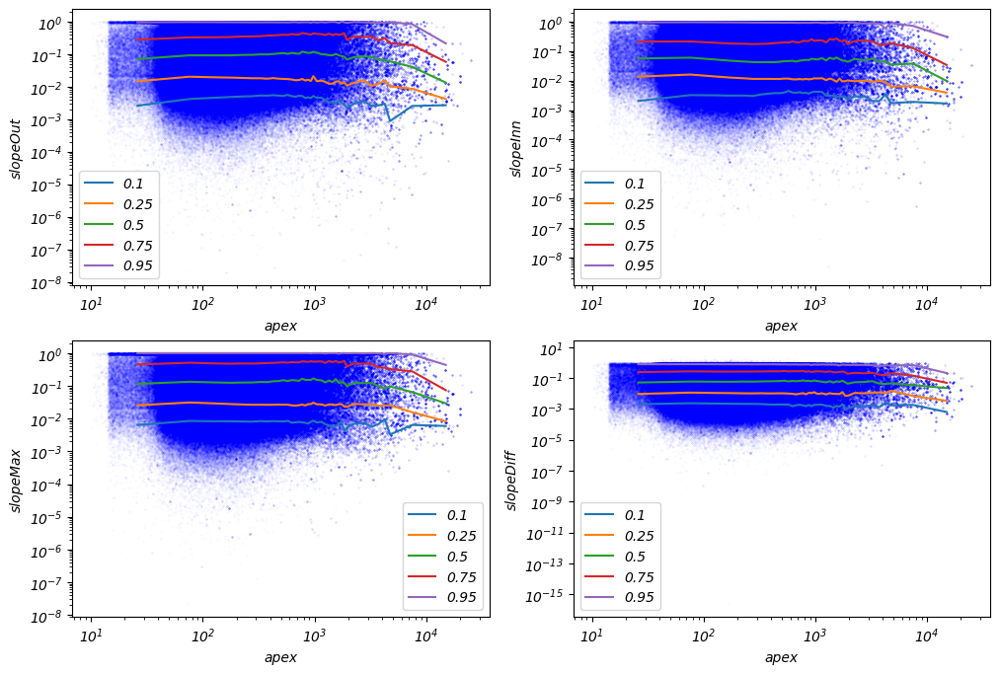

In [81]:
f, ax = plt.subplots(nrows = 2, ncols = 2, figsize = [12, 8], sharex = False, sharey = False)
plot_apex_quant('apex', 'slopeOut' , qOut, ax[0,0])
plot_apex_quant('apex', 'slopeInn' , qInn, ax[0,1])
plot_apex_quant('apex', 'slopeMax' , qMax, ax[1,0])
plot_apex_quant('apex', 'slopeDiff', qDiff, ax[1,1])
plt.show()

### Amplitude vs ER

In [82]:
binSteps = list(np.arange(1,1000, 50)) +\
            list(np.arange(1000, 2000, 100)) +\
            list(np.arange(2000, 5000, 500)) +\
            [5000, 10000, 20000]


qOut, qInn, qMax,  qDiff = bin_quantiles('apex', ['EROut', 'ERInn', 'ERMax', 'ERDiff'], binSteps)


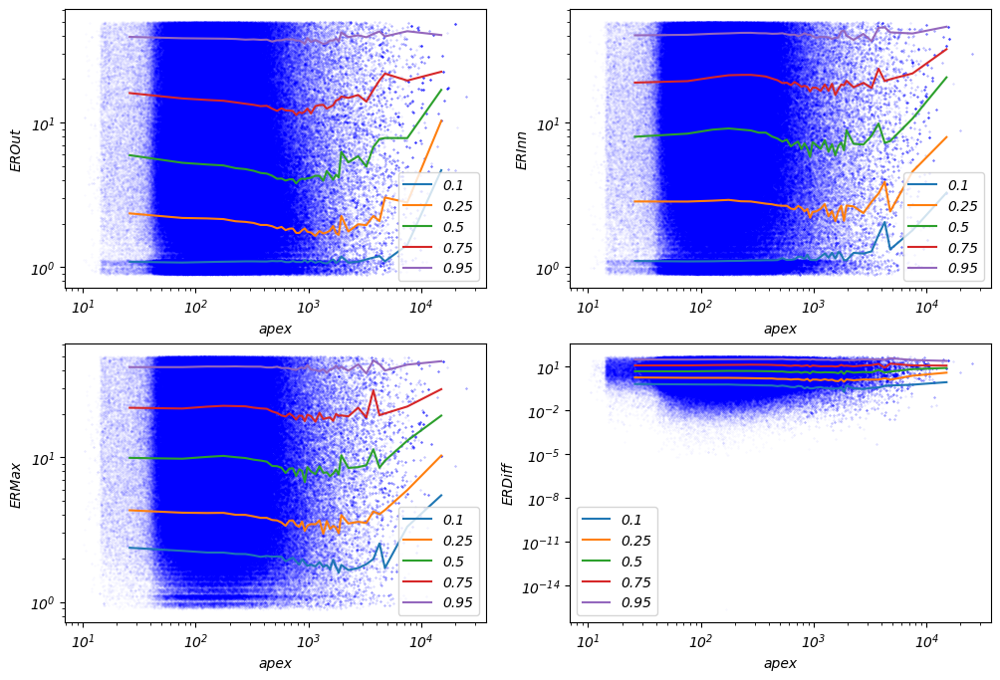

In [83]:
f, ax = plt.subplots(nrows = 2, ncols = 2, figsize = [12, 8])
plot_apex_quant('apex', 'EROut' , qOut, ax[0,0])
plot_apex_quant('apex', 'ERInn' , qInn, ax[0,1])
plot_apex_quant('apex', 'ERMax' , qMax, ax[1,0])
plot_apex_quant('apex', 'ERDiff', qDiff, ax[1,1])
plt.show()

### Amplitude/width vs conf ratio

In [84]:
binSteps = list(np.arange(0,2, 0.1)) +\
            list(np.arange(2,5, 0.5)) +\
            list(np.arange(5,10, 1)) +\
            list(np.arange(10,30, 4)) +\
            [30,50] 

qOut, qInn, qMax,  qDiff = bin_quantiles('bw_apex', ['EROut', 'ERInn', 'ERMax', 'ERDiff'], binSteps)


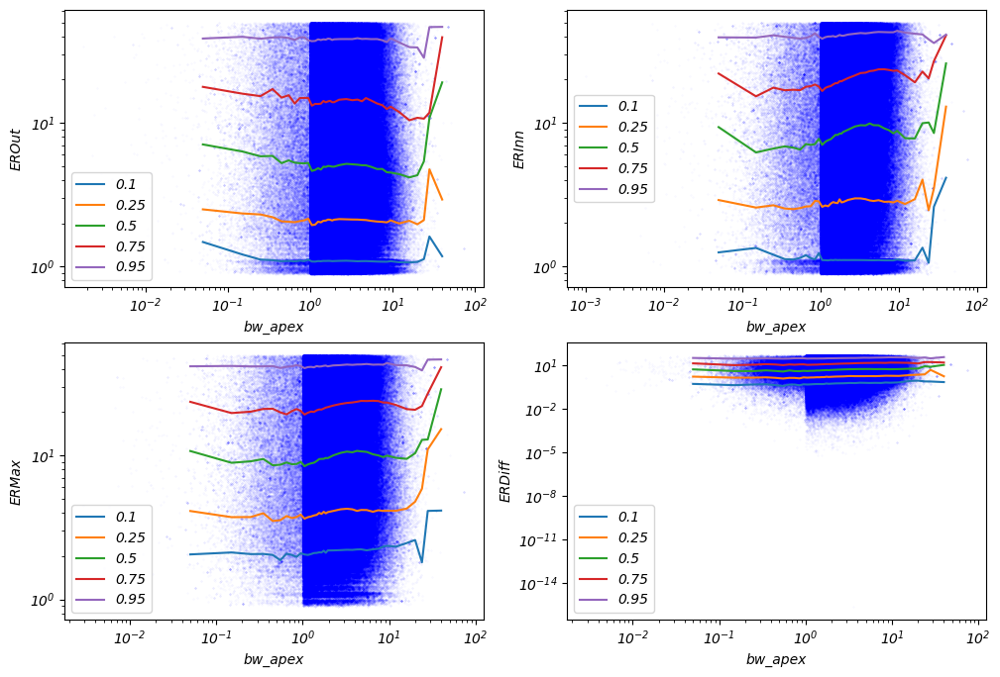

In [85]:
f, ax = plt.subplots(nrows = 2, ncols = 2, figsize = [12, 8])
plot_apex_quant('bw_apex', 'EROut' , qOut, ax[0,0])
plot_apex_quant('bw_apex', 'ERInn' , qInn, ax[0,1])
plot_apex_quant('bw_apex', 'ERMax' , qMax, ax[1,0])
plot_apex_quant('bw_apex', 'ERDiff', qDiff, ax[1,1])
plt.show()


### Amplitude/width vs conf ratio

In [214]:
binSteps = list(np.arange(0,2, 0.1)) +\
            list(np.arange(2,5, 0.5)) +\
            list(np.arange(5,10, 1)) +\
            list(np.arange(10,30, 4)) +\
            [30,50] 

qOut, qInn, qMax,  qDiff = bin_quantiles('nonDimAmp', ['slope_out_angle', 'slope_inn_angle', 'slope_max_angle', 'slope_diff_bendSide_angle'], binSteps)


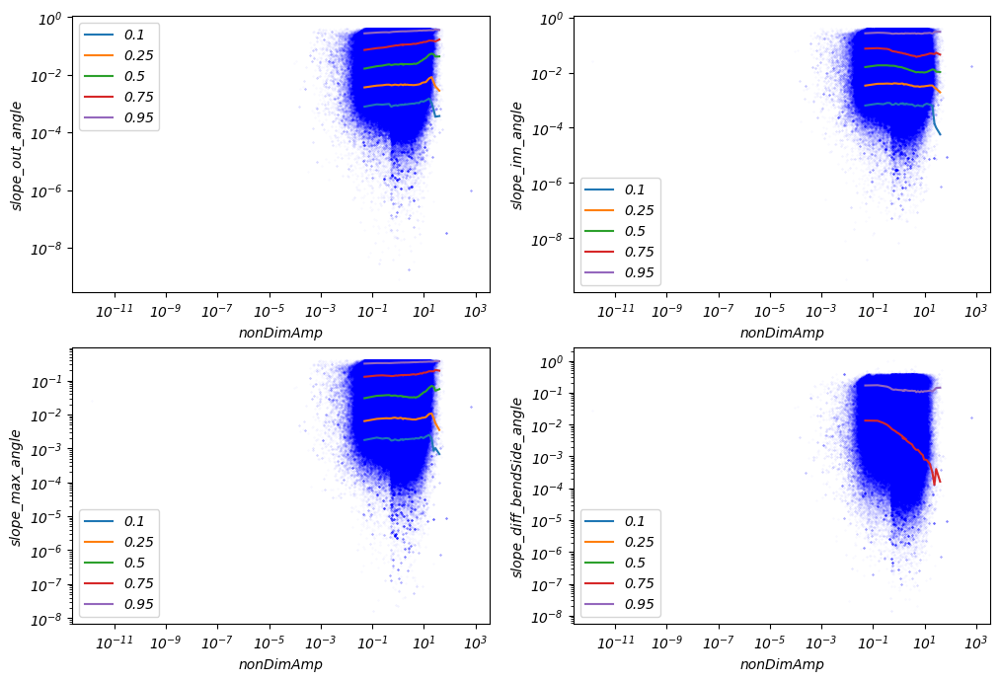

In [215]:
f, ax = plt.subplots(nrows = 2, ncols = 2, figsize = [12, 8])
plot_apex_quant(df,'nonDimAmp', 'slope_out_angle' , qOut, ax[0,0])
plot_apex_quant(df, 'nonDimAmp', 'slope_inn_angle' , qInn, ax[0,1])
plot_apex_quant(df, 'nonDimAmp', 'slope_max_angle' , qMax, ax[1,0])
plot_apex_quant(df, 'nonDimAmp', 'slope_diff_bendSide_angle', qDiff, ax[1,1])
plt.show()


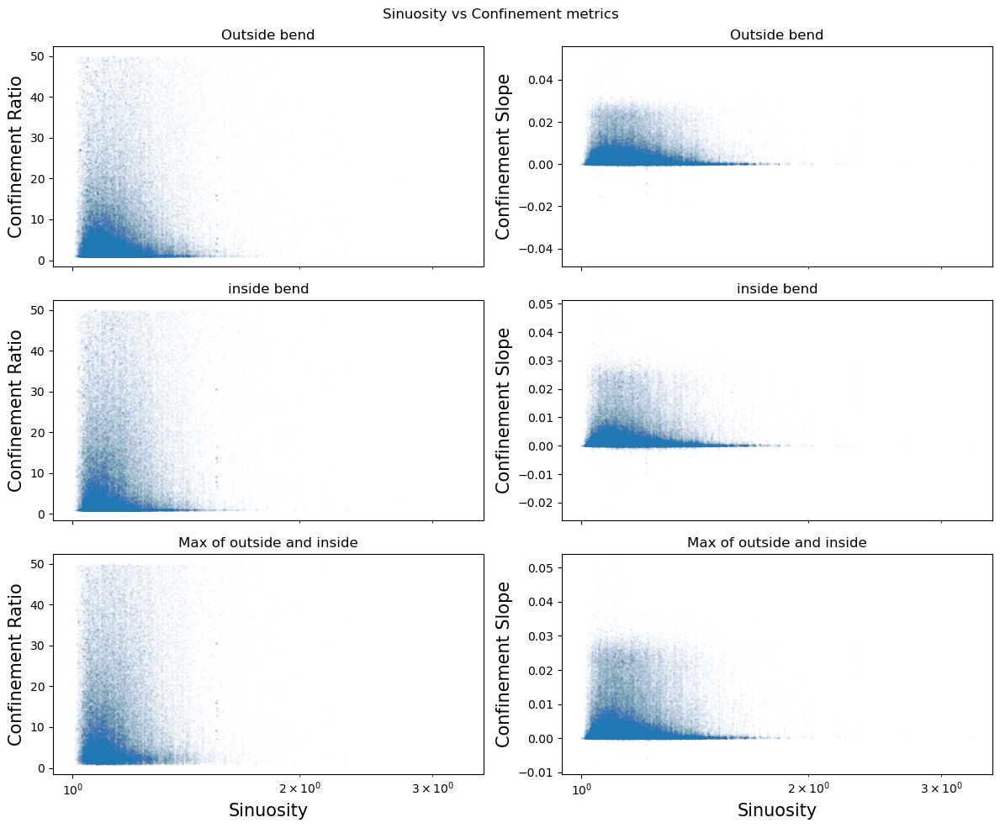

In [104]:
sin = ds.variables['sin'][:]
A = 0.01
f, [ax1, ax2, ax3] = plt.subplots(nrows = 3, ncols = 2, figsize = [12,10], 
                                  sharex = True, sharey=False)

ax1[0].scatter(sin, EROut, s = 1, alpha = A)
ax1[0].set_xscale('log')
ax1[0].set_title('Outside bend')

ax1[1].scatter(sin, slopeOut, s = 1, alpha = A)
ax1[1].set_xscale('log')
ax1[1].set_title('Outside bend')

ax2[0].scatter(sin, ERInn, s = 1, alpha = A)
ax2[0].set_xscale('log')
ax2[0].set_title('inside bend')

ax2[1].scatter(sin, slopeInn, s = 1, alpha = A)
ax2[1].set_xscale('log')
ax2[1].set_title('inside bend')

ax3[0].scatter(sin, ERMax, s = 1, alpha = A)
ax3[0].set_xscale('log')
ax3[0].set_title('Max of outside and inside')

ax3[1].scatter(sin, slopeMax, s = 1, alpha = A)
ax3[1].set_xscale('log')
ax3[1].set_title('Max of outside and inside')

ax1[0].set_ylabel('Confinement Ratio', fontsize = labelTextSize)
ax1[1].set_ylabel('Confinement Slope', fontsize = labelTextSize)

ax2[0].set_ylabel('Confinement Ratio', fontsize = labelTextSize)
ax2[1].set_ylabel('Confinement Slope', fontsize = labelTextSize)

ax3[0].set_ylabel('Confinement Ratio', fontsize = labelTextSize)
ax3[1].set_ylabel('Confinement Slope', fontsize = labelTextSize)



ax3[0].set_xlabel('Sinuosity', fontsize = labelTextSize)
ax3[1].set_xlabel('Sinuosity', fontsize = labelTextSize)

plt.suptitle('Sinuosity vs Confinement metrics')
plt.tight_layout()
plt.show()

# reach averages

In [165]:
data.loc[data['ER_left'].isna(), 'ER_left']

26        NaN
32        NaN
41        NaN
43        NaN
44        NaN
           ..
1492202   NaN
1492203   NaN
1492204   NaN
1492205   NaN
1492206   NaN
Name: ER_left, Length: 486088, dtype: float64

In [173]:
data1 = data[~data['slope_left'].isna()]
data.shape[0], data1.shape[0]

(1492207, 1489536)

In [ ]:
from kmodes.kprototypes import KPrototypes

# Example dataset
data = df[['combined_reach_id', 
           'ER_left'    , 'ER_right'  , 'ER_out'   , 'ER_inn', 
           'slope_right', 'slope_left', 'slope_out', 'slope_inn']]

repCols = ['ER_left'    , 'ER_right'  , 'ER_out'   , 'ER_inn']
remCols = ['slope_right', 'slope_left', 'slope_out', 'slope_inn']
for col in repCols:
    data.loc[data[col].isna(), col] = 55
for col in remCols:
    data = data[~data[col].isna()]

# List of categorical columns
categorical_columns = ['combined_reach_id']

# Convert categorical columns to category codes
data_encoded = data.copy()
for col in categorical_columns:
    data_encoded[col] = data[col].astype('category').cat.codes

# Convert to numpy array for k-Prototypes
X = data_encoded.to_numpy()

# Indices of categorical columns
cat_cols_idx = [data.columns.get_loc(col) for col in categorical_columns]

# Fit k-Prototypes
kproto = KPrototypes(n_clusters=10, init='Huang', verbose=2, max_iter = 20)
clusters = kproto.fit_predict(X, categorical=cat_cols_idx)

# Assign clusters back to the original DataFrame
data['cluster'] = clusters

print(data)


Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 219819, ncost: 172890091.82048857
Run: 1, iteration: 2/100, moves: 95751, ncost: 163837610.04483694
Run: 1, iteration: 3/100, moves: 43709, ncost: 162463911.0019633
Run: 1, iteration: 4/100, moves: 18730, ncost: 162216159.84899858
Run: 1, iteration: 5/100, moves: 9368, ncost: 162149617.72893357
Run: 1, iteration: 6/100, moves: 5327, ncost: 162126680.23912013
Run: 1, iteration: 7/100, moves: 3208, ncost: 162117301.20615688
Run: 1, iteration: 8/100, moves: 2045, ncost: 162113322.05006567
Run: 1, iteration: 9/100, moves: 1284, ncost: 162111695.61798826
Run: 1, iteration: 10/100, moves: 761, ncost: 162111099.99905342
Run: 1, iteration: 11/100, moves: 530, ncost: 162110827.91345465


KeyboardInterrupt: 

In [ ]:
vars = ['ER_out', 'ER_inn', 'slope_out', 'slope_in',
        'ER_left', 'ER_right', 'slope_left', 'slope_right']

In [ ]:
dfAv = df.groupby('combined_reach_id', as_index = False)[variables].agg(['mean', 'std'])

TypeError: agg function failed [how->mean,dtype->object]

# catchment figures

In [147]:
dsF = ds.where((ds['file'] == 'as') & (ds['networkGraph'] == 723), drop = True)


In [155]:

dsSubset = ds[['ER_inn', 'ER_out', 'slope_inn', 'slope_out',
    'apex', 'catchment_position', 'bendWidths', 'bendMaxWidths']]
dfSubset = dsSubset.to_dataframe().reset_index()
dfSubset['ERMax'] = dfSubset[['ER_out', 'ER_inn']].max(axis = 1)
dfSubset['slopeMax'] = dfSubset[['slope_out', 'slope_inn']].max(axis = 1)

apex  = dfSubset['apex'].values
bendWidth = dfSubset['bendWidths'].values
EROut = dfSubset['ER_out'].values
ERInn = dfSubset['ER_inn'].values
ERMax = dfSubset['ERMax'].values

slopeOut = dfSubset['slope_out'].values
slopeInn = dfSubset['slope_inn'].values
slopeMax = dfSubset['slopeMax'].values
catchmentPosition = dfSubset['catchment_position'].values


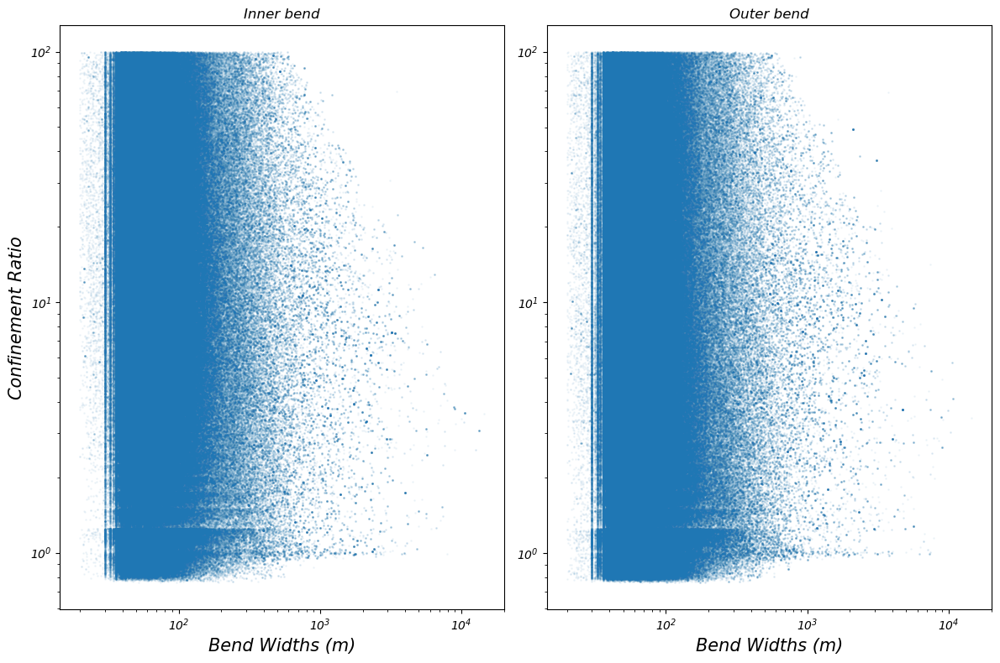

In [202]:
scatter_plot(df, 1, 2, ['bendWidths', 'bendWidths'], ['ER_inn', 'ER_out'], ['Bend Widths (m)', 'Bend Widths (m)'], ['Confinement Ratio'], ['Inner bend', 'Outer bend'])

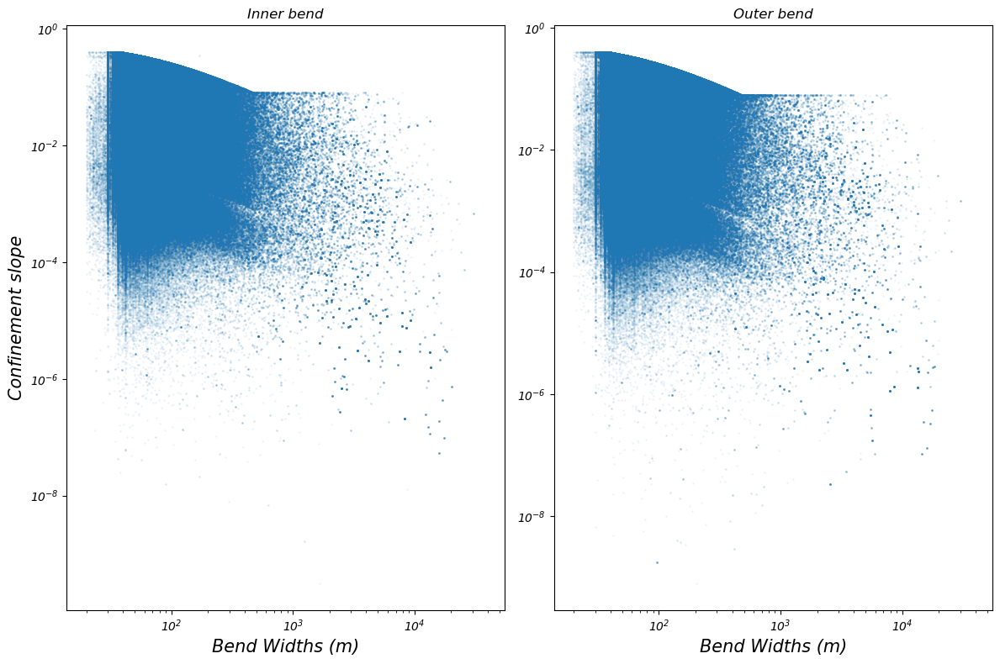

In [ ]:
scatter_plot(df, 1, 2, ['bendWidths', 'bendWidths'], ['slope_inn_angle', 'slope_out_angle'], ['Amplitude / Bend Widths', 'Amplitude/Bend Widths (m)'], ['Confinement slope'], ['Inner bend', 'Outer bend'])

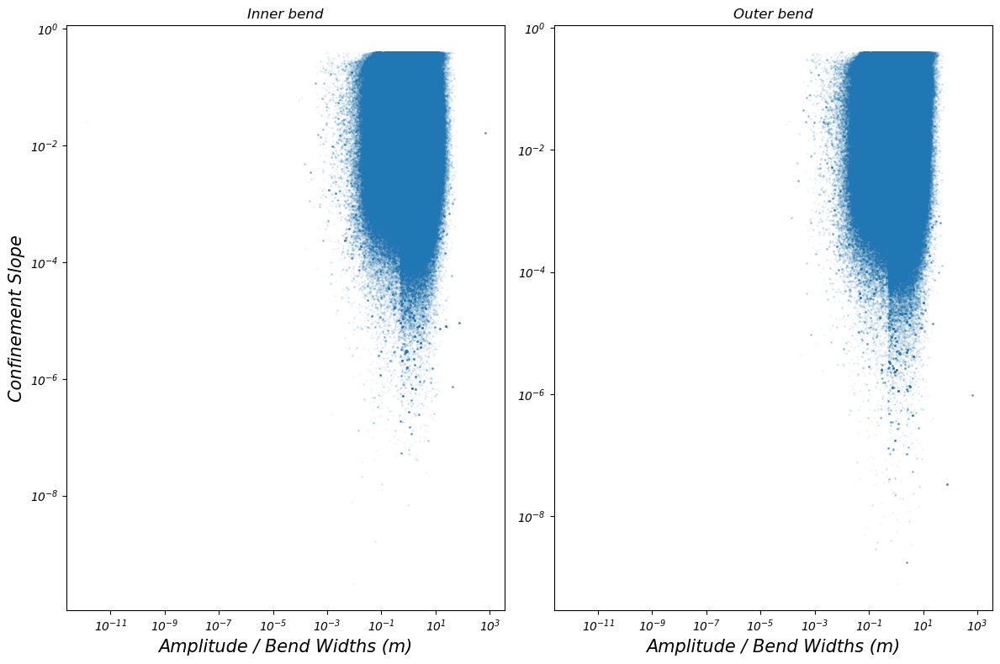

In [207]:
scatter_plot(df, 1, 2, ['nonDimAmp', 'nonDimAmp'], ['slope_inn_angle', 'slope_out_angle'], ['Amplitude / Bend Widths (m)', 'Amplitude / Bend Widths (m)'], ['Confinement Slope'], ['Inner bend', 'Outer bend'])

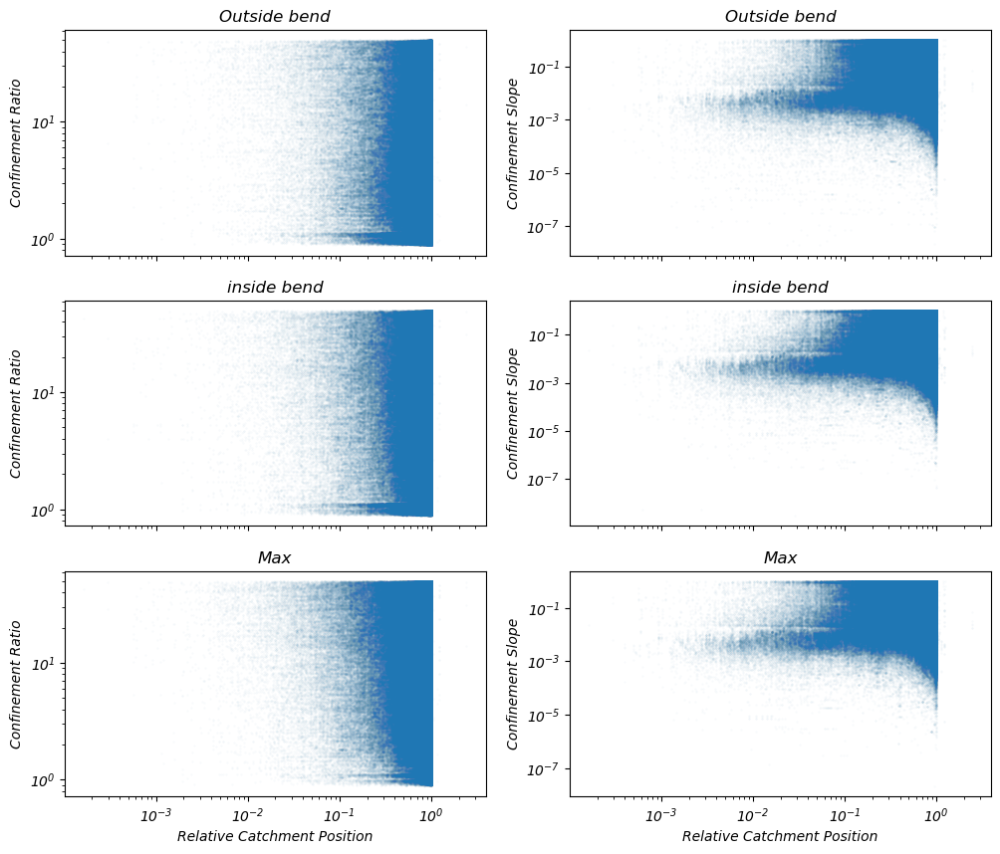

In [ ]:


f, [ax1, ax2, ax3] = plt.subplots(nrows = 3, ncols = 2, figsize = [12,10], 
                                  sharex = True, sharey=False)
scatter_plots(ax1[0], catchmentPosition, EROut    , 'Outside bend', False, '', True , 'Confinement Ratio', scatterAlpha, scatterSize)
scatter_plots(ax1[1], catchmentPosition, slopeOut , 'Outside bend', False, '', True, 'Confinement Slope', scatterAlpha, scatterSize)
scatter_plots(ax2[0], catchmentPosition, ERInn    , 'inside bend' , False, '', True , 'Confinement Ratio', scatterAlpha, scatterSize)
scatter_plots(ax2[1], catchmentPosition, slopeInn , 'inside bend' , False, '', True, 'Confinement Slope', scatterAlpha, scatterSize)
scatter_plots(ax3[0], catchmentPosition, ERMax    , 'Max'         , True, 'Relative Catchment Position', True , 'Confinement Ratio', scatterAlpha, scatterSize)
scatter_plots(ax3[1], catchmentPosition, slopeMax , 'Max'         , True, 'Relative Catchment Position', True, 'Confinement Slope', scatterAlpha, scatterSize)
plt.show()

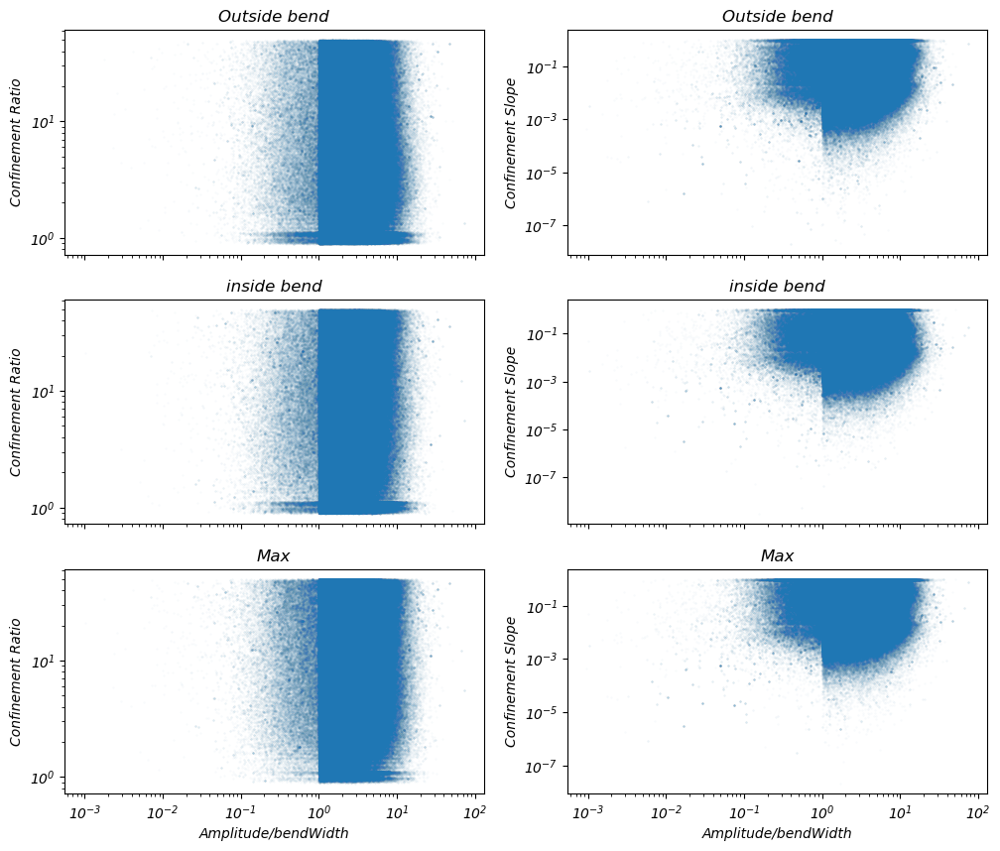

In [156]:

f, [ax1, ax2, ax3] = plt.subplots(nrows = 3, ncols = 2, figsize = [12,10], 
                                  sharex = True, sharey=False)
scatter_plots(ax1[0], apex/bendWidth, EROut    , 'Outside bend', False, '', True , 'Confinement Ratio', scatterAlpha, scatterSize)
scatter_plots(ax1[1],  apex/bendWidth, slopeOut , 'Outside bend', False, '', True, 'Confinement Slope', scatterAlpha, scatterSize)
scatter_plots(ax2[0],  apex/bendWidth, ERInn    , 'inside bend' , False, '', True , 'Confinement Ratio', scatterAlpha, scatterSize)
scatter_plots(ax2[1],  apex/bendWidth, slopeInn , 'inside bend' , False, '', True, 'Confinement Slope', scatterAlpha, scatterSize)
scatter_plots(ax3[0],  apex/bendWidth, ERMax    , 'Max'         , True, 'Amplitude/bendWidth', True , 'Confinement Ratio', scatterAlpha, scatterSize)
scatter_plots(ax3[1],  apex/bendWidth, slopeMax , 'Max'         , True, 'Amplitude/bendWidth', True, 'Confinement Slope', scatterAlpha, scatterSize)
plt.show()

# TEST

In [26]:
dfC = df.groupby(['file', 'combined_reach_id'], as_index = False)[['sin', 'ang', 'widthRatio', 'cp_height']].mean()
dfC = dfC[['sin', 'ang', 'widthRatio', 'cp_height']]
dfC = dfC.dropna()

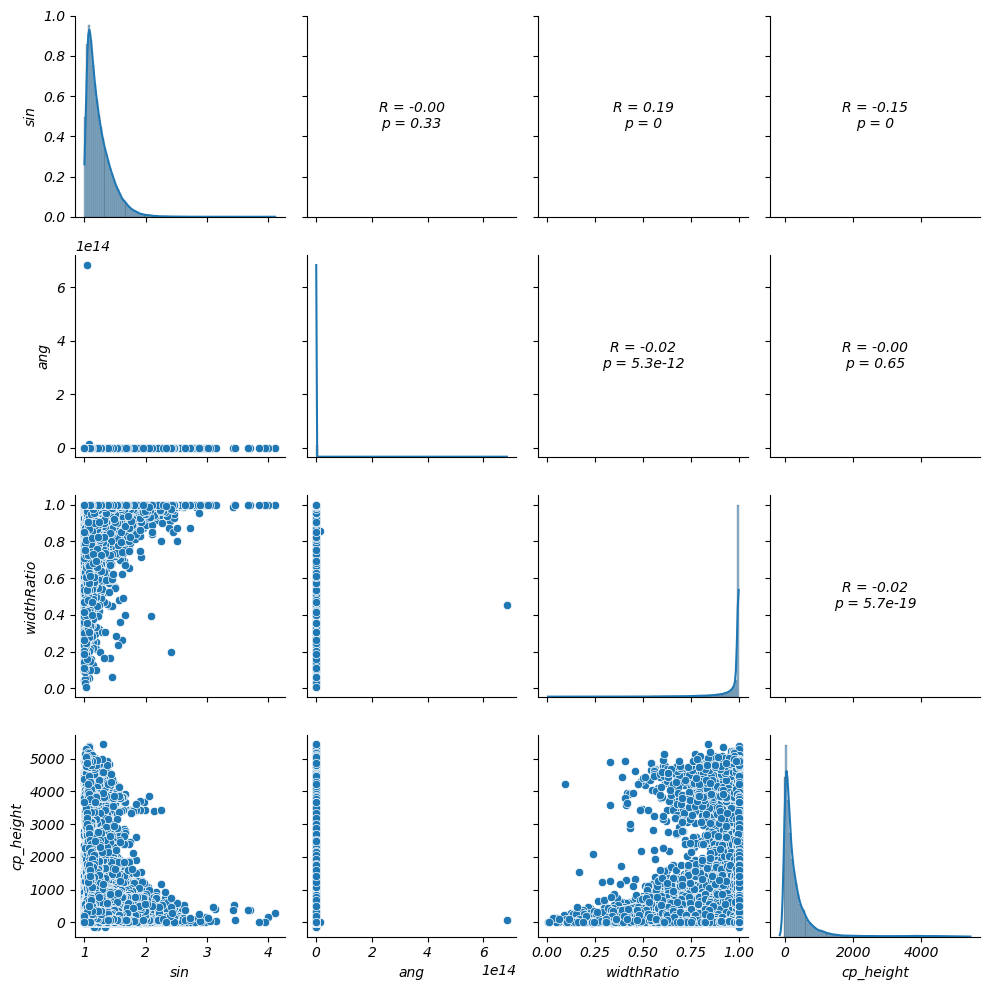

In [27]:
from scipy.stats import pearsonr

# Function to show correlation (R) and p-value
def corrfunc(x, y, **kws):
    r, p = pearsonr(x, y)
    ax = plt.gca()
    ax.annotate(f'R = {r:.2f}\np = {p:.2g}', 
                xy=(.5, .5), 
                xycoords=ax.transAxes, 
                ha='center', 
                va='center',
                fontsize=10)

# Create a PairGrid
g = sns.PairGrid(dfC, diag_sharey=False)
g.map_upper(corrfunc)  # Correlation and p-value on upper triangle
g.map_lower(sns.scatterplot)  # Scatterplots on lower triangle
g.map_diag(sns.histplot, kde=True, bins = 100)  # Histograms on diagonal

plt.tight_layout()
plt.show()

In [15]:
F = np.sort(glob(directory + 'results/single_values/*_2_*.gpkg'))[17]

In [16]:
D = gpd.read_file(F)

In [20]:
S = D[D.combined_reach_id == 47595]

In [22]:
S

,reach_id,combined_reach_id,apex,bendWidths,bendMaxWidths,ang,sin,bendSin,cp_height,ER_out,ER_inn,ER_left,ER_right,slope_out,slope_inn,slope_left,slope_right,bendDistOut,geometry


ValueError: aspect must be finite and positive 

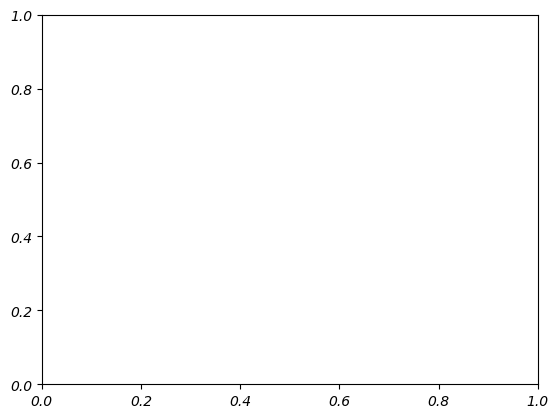

In [21]:
S.plot()